In [893]:
# Isaac Berez
# 17.01.23
import sys
from scipy.io import mmread
import os
import glob
import pandas as pd
import numpy as np
from pandas_ods_reader import read_ods
from copy import deepcopy
import pprint
import json
import re
from datetime import datetime
import logging
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn import preprocessing
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import harmonypy as hm
from matplotlib.cm import ScalarMappable
from datetime import date
import mpld3
import hvplot.pandas
import holoviews as hv
from holoviews import opts
import panel as pn
import bokeh
from bokeh.resources import INLINE

import dimorph_processing as dp


today = str(date.today())
%matplotlib notebook
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Table of Contents
1. [Introduction](#introduction)
2. [Data Loading](#data_loading)
3. [GABA Analysis](#gaba_analysis)
4. [Vglut1 Analysis](#vglut1_analysis)
5. [Vglut2 Analysis](#vglut2_analysis)
6. [Nonneuronal Analysis](#nn_analysis)

## Introduction <a name="introduction"></a>

This notebook continues the analysis from 'dimorph_processing_nb.ipynb' beginning with the analysis of each cell class: GABA, Vglut1, and Vglut2. It uses the same functions from dimorph_processing.py.

## Data Loading <a name="data_loading"></a>

In [894]:
today

'2024-07-16'

Load the original gene expression dataframe, then use an updated metafile to filter cells (previously performed in cell exclusion step of 'dimorph_processing_nb.ipynb')

In [895]:
df_orig = pd.read_feather('/bigdata/isaac/df_orig.feather')

#meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df2024-05-01.json')

#use 2024-05-09 version of metadata - which fixed a bug in compute marker means () where prev NN cells were not being summed
#meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df_mm_2024-05-09.json')

#latest metadata version 2024-05-19
meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df_mm_2024-05-19.json')

In [896]:
Counter(np.array(meta_data_df.loc['cell_class',:]))

Counter({'GABA': 15039,
         'Vglut1': 11287,
         'Vglut2': 9806,
         'Nonneuronal': 2996,
         'Doublet': 1121})

In [897]:
print (len(np.where(df_orig.sum(axis=1)==0)[0]))

4963


In [898]:
IEG_list = []

with open('/bigdata/isaac/IEG_cluster.txt', 'r') as fh:
    for g in fh:
        IEG_list.append(g[:-1])

In [899]:
df_orig.head()

,AAACCCAAGAGCATAT-1_10X51_2,AAACCCAAGCCTCAGC-1_10X51_2,AAACCCAAGTACTGTC-1_10X51_2,AAACCCACACAACGTT-1_10X51_2,AAACCCAGTAACATAG-1_10X51_2,AAACCCATCACTAGCA-1_10X51_2,AAACGAACACTCCGAG-1_10X51_2,AAACGAACAGCGCGTT-1_10X51_2,AAACGAACAGGACTTT-1_10X51_2,AAACGAAGTGAATAAC-1_10X51_2,...,TTTGGTTTCCACGAAT-1_10X37_2,TTTGGTTTCTTTCTAG-1_10X37_2,TTTGTTGAGAAATTCG-1_10X37_2,TTTGTTGAGTGCTCGC-1_10X37_2,TTTGTTGCAAGGTCAG-1_10X37_2,TTTGTTGCACCGCTGA-1_10X37_2,TTTGTTGGTCCATAGT-1_10X37_2,TTTGTTGGTTGCGAAG-1_10X37_2,TTTGTTGTCGAAGGAC-1_10X37_2,TTTGTTGTCTCTGCTG-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,2,0,2,0,0,1,3,2,0,...,1,0,1,0,2,1,1,0,0,0
0610009B22Rik,0,0,0,1,0,2,2,0,1,0,...,0,0,0,0,2,0,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,1,0,1,0,0,0
0610009O20Rik,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0610010F05Rik,0,0,1,0,0,0,2,1,1,0,...,1,0,2,0,1,0,1,0,0,0


In [900]:
meta_data_df

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
Serial_Number,68.0,68.0,68.0,68.0,63.0,103.0,97.0,103.0,102.0,99.0,...,65.0,64.0,103.0,64.0,98.0,64.0,103.0,99.0,66.0,102.0
Date_Captured,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,...,2019-11-24,2019-11-20,05/31/20,2019-11-20,05/31/20,2019-11-20,05/31/20,05/31/20,2019-11-24,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,,,,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,...,,,C57Bl/6,,C57Bl/6,,C57Bl/6,C57Bl/6,,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Breeder-M,Breeder-F,Breeder-M,Breeder-F,Breeder-M,...,Naïve-M,Naïve-F,Breeder-M,Naïve-F,Breeder-F,Naïve-F,Breeder-M,Breeder-M,Naïve-M,Breeder-F
ChipID,10X37,10X37,10X37,10X37,10X35,10X52,10X51,10X52,10X52,10X51,...,10X36,10X35,10X52,10X35,10X51,10X35,10X52,10X51,10X36,10X52
SampleID,10X37_2,10X37_2,10X37_2,10X37_2,10X35_1,10X52_3,10X51_1,10X52_3,10X52_2,10X51_3,...,10X36_1,10X35_2,10X52_3,10X35_2,10X51_2,10X35_2,10X52_3,10X51_3,10X36_2,10X52_2
DonorID,"DI4,DI5","DI4,DI5","DI4,DI5","DI4,DI5","DI1,DI2",DI-B3-M,DI-B1-F,DI-B3-M,DI-B3-F,DI-B1-M,...,DI3,"DI1,DI2",DI-B3-M,"DI1,DI2",DI-B1-F,"DI1,DI2",DI-B3-M,DI-B1-M,DI3,DI-B3-F


In [901]:
meta_data_df.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
ngperul_seqlib,16.0,16.0,16.0,16.0,13.6,20.4(second prep),19.2,20.4(second prep),17.5,22.0,...,11.4,17.6,20.4(second prep),17.6,22.2,17.6,20.4(second prep),22.0,12.1,17.5
lengthbp_seqlib,460.0,460.0,460.0,460.0,416.0,507.0,478.0,507.0,440.0,487.0,...,476.0,461.0,507.0,461.0,474.0,461.0,507.0,487.0,486.0,440.0
Sample_Index,F9,F9,F9,F9,D9,F12,G1,F12,E12,B2,...,H8,G8,F12,G8,A2,G8,F12,B2,A9,E12
cluster_label,26,26,26,26,26,26,26,26,26,26,...,37,37,37,37,37,37,37,37,37,37
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal


remove old cluster labels from original analysis to avoid confusion

In [902]:
meta_data_df = meta_data_df.drop(['cluster_label'])

In [903]:
df = df_orig.reindex(columns=meta_data_df.columns)

In [904]:
df.shape

(27933, 40249)

In [905]:
df.head()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,1,0,0,0,1,0,0,0,0,0,...,1,3,0,1,0,0,1,0,0,0
0610009B22Rik,1,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
0610009L18Rik,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,1,1,1,0
0610009O20Rik,0,0,0,0,0,0,1,1,1,0,...,1,0,2,0,0,0,1,1,0,0
0610010F05Rik,0,0,0,5,3,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [906]:
meta_data_df.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
LIbConstructionComment,,,,,,,,,,,...,,,,,,,,,,
ngperul_seqlib,16.0,16.0,16.0,16.0,13.6,20.4(second prep),19.2,20.4(second prep),17.5,22.0,...,11.4,17.6,20.4(second prep),17.6,22.2,17.6,20.4(second prep),22.0,12.1,17.5
lengthbp_seqlib,460.0,460.0,460.0,460.0,416.0,507.0,478.0,507.0,440.0,487.0,...,476.0,461.0,507.0,461.0,474.0,461.0,507.0,487.0,486.0,440.0
Sample_Index,F9,F9,F9,F9,D9,F12,G1,F12,E12,B2,...,H8,G8,F12,G8,A2,G8,F12,B2,A9,E12
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal


## GABA Analysis <a name="gaba_analysis"></a>

In [907]:
gaba_meta_data_df = meta_data_df.loc[:,meta_data_df.loc['cell_class',:] == 'GABA']
gaba_df = df.loc[:,meta_data_df.loc['cell_class',:] == 'GABA']

In [908]:
gaba_meta_data_df.tail()

,CCGGGTAGTGTTGAGG-1_10X51_3,CGTAAGTGTGAAGCTG-1_10X52_2,ACTATGGGTCCACATA-1_10X51_2,AAGGAATCATTATGCG-1_10X52_4,GGAATCTCATCCTTCG-1_10X51_2,TACGGGCAGAGGCGGA-1_10X35_1,TCTACCGCAACGATCT-1_10X38_1,TTTGTTGTCAGCTTCC-1_10X38_1,CGCAGGTTCTCTAAGG-1_10X38_1,CCACAAAGTACAACGG-1_10X51_2,...,TTCCGGTCAGACATCT-1_10X36_2,CACACAAGTCCGGACT-1_10X51_2,ATGAGGGGTGCCGTTG-1_10X38_2,GTCCTCACATCAGCGC-1_10X38_1,TACAGGTCACCGTGAC-1_10X36_1,CATTCCGCAACACGTT-1_10X36_1,ATCGGCGTCAAACGAA-1_10X38_2,GTGTGGCTCACAATGC-1_10X51_3,GGGTCACAGCTAGTTC-1_10X36_2,GAGGGATCAGAGATGC-1_10X38_1
LIbConstructionComment,,,,,,,,,,,...,,,,,,,,,,
ngperul_seqlib,22.0,17.5,22.2,8.94 (second prep),22.2,13.6,15.0,15.0,15.0,22.2,...,12.1,22.2,18.7,15.0,11.4,11.4,18.7,22.0,12.1,15.0
lengthbp_seqlib,487.0,440.0,474.0,535.0,474.0,416.0,420.0,420.0,420.0,474.0,...,486.0,474.0,415.0,420.0,476.0,476.0,415.0,487.0,486.0,420.0
Sample_Index,B2,E12,A2,G12,A2,D9,B9,B9,B9,A2,...,A9,A2,C9,B9,H8,H8,C9,B2,A9,B9
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA


In [909]:
gaba_df.head()

,CCGGGTAGTGTTGAGG-1_10X51_3,CGTAAGTGTGAAGCTG-1_10X52_2,ACTATGGGTCCACATA-1_10X51_2,AAGGAATCATTATGCG-1_10X52_4,GGAATCTCATCCTTCG-1_10X51_2,TACGGGCAGAGGCGGA-1_10X35_1,TCTACCGCAACGATCT-1_10X38_1,TTTGTTGTCAGCTTCC-1_10X38_1,CGCAGGTTCTCTAAGG-1_10X38_1,CCACAAAGTACAACGG-1_10X51_2,...,TTCCGGTCAGACATCT-1_10X36_2,CACACAAGTCCGGACT-1_10X51_2,ATGAGGGGTGCCGTTG-1_10X38_2,GTCCTCACATCAGCGC-1_10X38_1,TACAGGTCACCGTGAC-1_10X36_1,CATTCCGCAACACGTT-1_10X36_1,ATCGGCGTCAAACGAA-1_10X38_2,GTGTGGCTCACAATGC-1_10X51_3,GGGTCACAGCTAGTTC-1_10X36_2,GAGGGATCAGAGATGC-1_10X38_1
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,0,1,0,2,0,0,0,2,0,...,1,0,1,1,2,0,0,2,1,0
0610009B22Rik,0,0,0,0,2,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
0610009L18Rik,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,1,0,0
0610009O20Rik,0,0,1,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
0610010F05Rik,0,0,0,1,0,1,0,0,0,0,...,1,1,1,0,0,1,0,0,0,1


In [910]:
gaba_df.shape

(27933, 15039)

In [911]:
'Gad2' in df.index

True

In [912]:
len(gaba_df.index)

27933

In [913]:
'Gad2' in gaba_df.index

True

In [914]:
#2024-05-08- re ran clustering with eps_prc to 70, m_factor = 2 to get better cell class differentiation, but still getting high plp1 in gaba

<IPython.core.display.Javascript object>


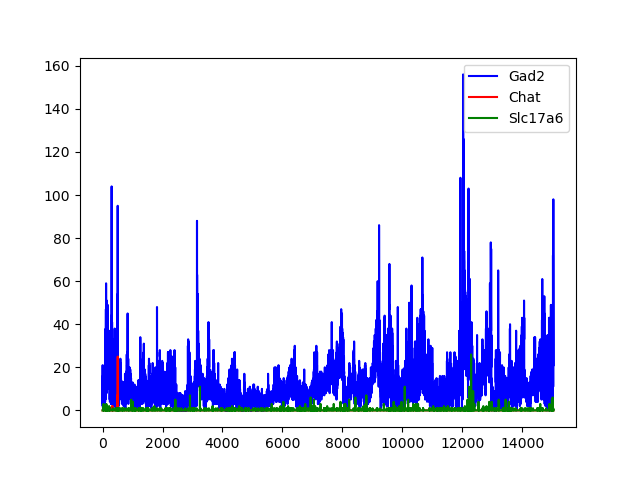

In [915]:
fig, ax = plt.subplots()
plt.plot(np.array(gaba_df.loc['Gad2',:]), c = 'b', label = 'Gad2')
plt.plot(np.array(gaba_df.loc['Chat',:]), c = 'r', label = 'Chat')
plt.plot(np.array(gaba_df.loc['Slc17a6',:]), c = 'g', label = 'Slc17a6')
plt.legend()
plt.show()

In [916]:
gaba_df_bool = gaba_df.mask(gaba_df>0, other = 1)

In [917]:
gaba_df_bool.head()

,CCGGGTAGTGTTGAGG-1_10X51_3,CGTAAGTGTGAAGCTG-1_10X52_2,ACTATGGGTCCACATA-1_10X51_2,AAGGAATCATTATGCG-1_10X52_4,GGAATCTCATCCTTCG-1_10X51_2,TACGGGCAGAGGCGGA-1_10X35_1,TCTACCGCAACGATCT-1_10X38_1,TTTGTTGTCAGCTTCC-1_10X38_1,CGCAGGTTCTCTAAGG-1_10X38_1,CCACAAAGTACAACGG-1_10X51_2,...,TTCCGGTCAGACATCT-1_10X36_2,CACACAAGTCCGGACT-1_10X51_2,ATGAGGGGTGCCGTTG-1_10X38_2,GTCCTCACATCAGCGC-1_10X38_1,TACAGGTCACCGTGAC-1_10X36_1,CATTCCGCAACACGTT-1_10X36_1,ATCGGCGTCAAACGAA-1_10X38_2,GTGTGGCTCACAATGC-1_10X51_3,GGGTCACAGCTAGTTC-1_10X36_2,GAGGGATCAGAGATGC-1_10X38_1
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,0,1,0,1,0,0,0,1,0,...,1,0,1,1,1,0,0,1,1,0
0610009B22Rik,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
0610009L18Rik,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
0610009O20Rik,0,0,1,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
0610010F05Rik,0,0,0,1,0,1,0,0,0,0,...,1,1,1,0,0,1,0,0,0,1


In [918]:
gaba_df_bool.shape

(27933, 15039)

num m cells: 6881 num f cells: 8158


<IPython.core.display.Javascript object>


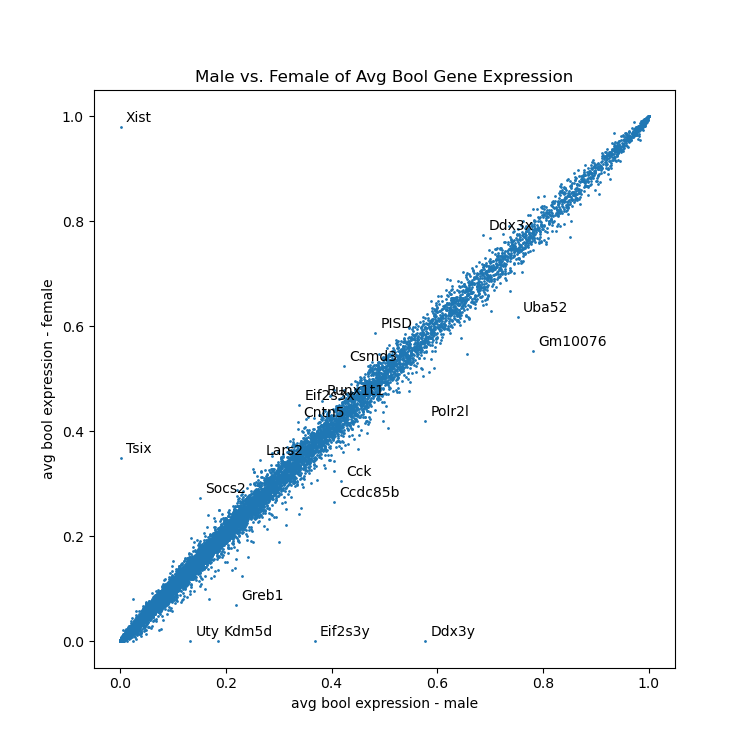

In [919]:
gaba_avg_bool_mf_df_sorted = dp.avg_bool_gene_expression_by_sex(df_bool = gaba_df_bool,
                                                              meta_data_df=gaba_meta_data_df,
                                                             num_top_genes=10,
                                                             plot_flag=1)

In [920]:
status_df = dp.intialize_status_df()

In [921]:
status_df.loc['cell_exclusion (l1)',:] = True

In [922]:
gaba_df.shape #genes x cells

(27933, 15039)

In [923]:
gene_exclusion_upper_bound = 0.01*50*gaba_df.shape[1]
gene_exclusion_upper_bound

7519.5

In [924]:
gaba_df

,CCGGGTAGTGTTGAGG-1_10X51_3,CGTAAGTGTGAAGCTG-1_10X52_2,ACTATGGGTCCACATA-1_10X51_2,AAGGAATCATTATGCG-1_10X52_4,GGAATCTCATCCTTCG-1_10X51_2,TACGGGCAGAGGCGGA-1_10X35_1,TCTACCGCAACGATCT-1_10X38_1,TTTGTTGTCAGCTTCC-1_10X38_1,CGCAGGTTCTCTAAGG-1_10X38_1,CCACAAAGTACAACGG-1_10X51_2,...,TTCCGGTCAGACATCT-1_10X36_2,CACACAAGTCCGGACT-1_10X51_2,ATGAGGGGTGCCGTTG-1_10X38_2,GTCCTCACATCAGCGC-1_10X38_1,TACAGGTCACCGTGAC-1_10X36_1,CATTCCGCAACACGTT-1_10X36_1,ATCGGCGTCAAACGAA-1_10X38_2,GTGTGGCTCACAATGC-1_10X51_3,GGGTCACAGCTAGTTC-1_10X36_2,GAGGGATCAGAGATGC-1_10X38_1
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,0,1,0,2,0,0,0,2,0,...,1,0,1,1,2,0,0,2,1,0
0610009B22Rik,0,0,0,0,2,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
0610009L18Rik,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,1,0,0
0610009O20Rik,0,0,1,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
0610010F05Rik,0,0,0,1,0,1,0,0,0,0,...,1,1,1,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mt-Nd3,20,6,19,9,10,13,10,9,7,9,...,7,23,53,21,28,60,33,30,19,18
mt-Nd4,149,55,53,76,33,115,84,85,50,31,...,61,53,238,133,165,201,80,138,138,110
mt-Nd4l,7,4,4,7,8,9,6,5,3,4,...,6,4,21,1,9,23,8,8,7,3


In [925]:
#gaba_df.drop(labels = IEG_in_df)

In [926]:
gaba_df.shape

(27933, 15039)

In [927]:
gaba_df_ge, gaba_df_bool, gaba_meta_data_df, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                      percent_cell_upper_bound=50,
                                                     df_bool=gaba_df_bool,
                                                     df = gaba_df,
                                                     meta_data_df = gaba_meta_data_df,
                                                     status_df = status_df)
#gaba_df_ge.head()


Total genes reduced from 27933 to 14843


In [928]:
gaba_df_ge.shape

(14843, 15039)

In [929]:
#remove IEG genes
gaba_df_ge = dp.gene_remover(IEG_list, gaba_df_ge)

removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


In [930]:
gaba_df_ge.shape

(14790, 15039)

In [931]:
'Gad2' in gaba_df_ge.index

False

In [932]:
print (len(np.where(gaba_df_ge.sum(axis=1)==0)[0]))

0


<IPython.core.display.Javascript object>


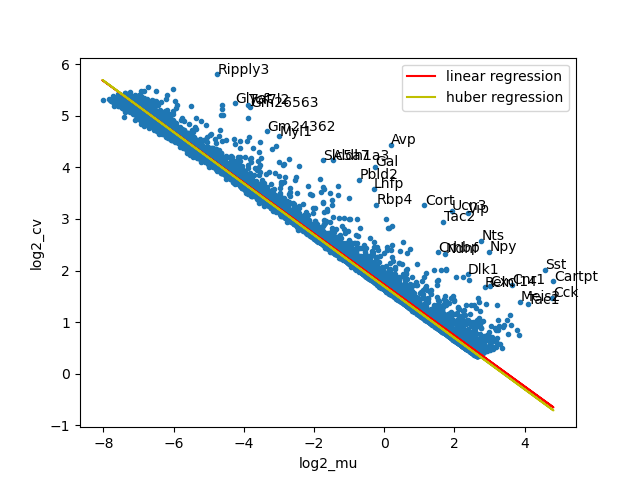

In [933]:
gaba_cv_df = dp.analyze_cv(df = gaba_df_ge,
                      norm_scale_factor=20000,
                      num_top_genes=30,
                      plot_flag=1,
                     use_huber = True)

In [934]:
gaba_cv_df.head()

,log2mu,log2cv,delta_cv
gene,,,
Avp,0.192009,4.435643,2.836932
Vip,2.374953,3.112450,2.602051
Sst,4.568699,2.018625,2.601922
Cartpt,4.823300,1.794851,2.505080
Ucn3,1.920323,3.160981,2.423925


<IPython.core.display.Javascript object>


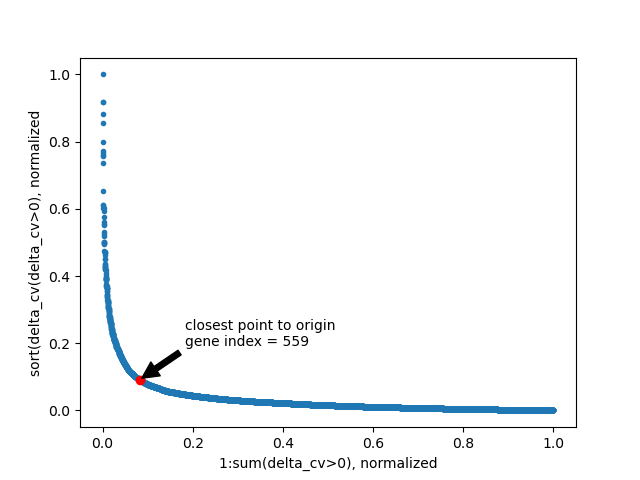

In [935]:
gaba_gene_index, gaba_df, status_df = dp.get_top_cv_genes(df = gaba_df_ge, cv_df=gaba_cv_df, plot_flag=1, status_df=status_df)

In [936]:
gaba_gene_index

559

In [937]:
gaba_df

,CCGGGTAGTGTTGAGG-1_10X51_3,CGTAAGTGTGAAGCTG-1_10X52_2,ACTATGGGTCCACATA-1_10X51_2,AAGGAATCATTATGCG-1_10X52_4,GGAATCTCATCCTTCG-1_10X51_2,TACGGGCAGAGGCGGA-1_10X35_1,TCTACCGCAACGATCT-1_10X38_1,TTTGTTGTCAGCTTCC-1_10X38_1,CGCAGGTTCTCTAAGG-1_10X38_1,CCACAAAGTACAACGG-1_10X51_2,...,TTCCGGTCAGACATCT-1_10X36_2,CACACAAGTCCGGACT-1_10X51_2,ATGAGGGGTGCCGTTG-1_10X38_2,GTCCTCACATCAGCGC-1_10X38_1,TACAGGTCACCGTGAC-1_10X36_1,CATTCCGCAACACGTT-1_10X36_1,ATCGGCGTCAAACGAA-1_10X38_2,GTGTGGCTCACAATGC-1_10X51_3,GGGTCACAGCTAGTTC-1_10X36_2,GAGGGATCAGAGATGC-1_10X38_1
gene,,,,,,,,,,,,,,,,,,,,,
Avp,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Vip,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sst,0,1,1,0,0,0,0,0,0,0,...,44,31,137,65,70,119,17,65,57,90
Cartpt,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
Ucn3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Glra2,0,0,4,2,0,0,5,0,0,0,...,0,0,1,0,4,0,0,0,0,0
Dpy19l1,1,0,0,0,1,0,1,0,0,0,...,1,0,0,0,1,1,0,0,0,0
Anxa2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [938]:
gaba_log_std_arr,status_df = dp.log_and_standerdize_df(gaba_df,status_df)

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


In [939]:
gaba_log_std_arr.shape[1]

559

In [940]:
gaba_df_ls = pd.DataFrame(data = gaba_log_std_arr.T, index = gaba_df.index, columns=gaba_df.columns)

<IPython.core.display.Javascript object>


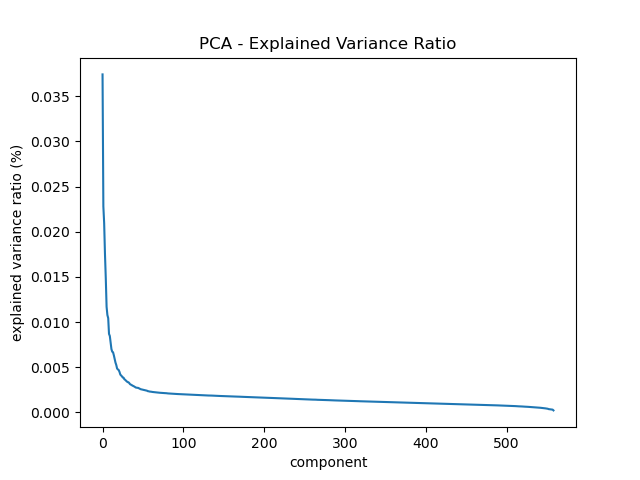

<IPython.core.display.Javascript object>


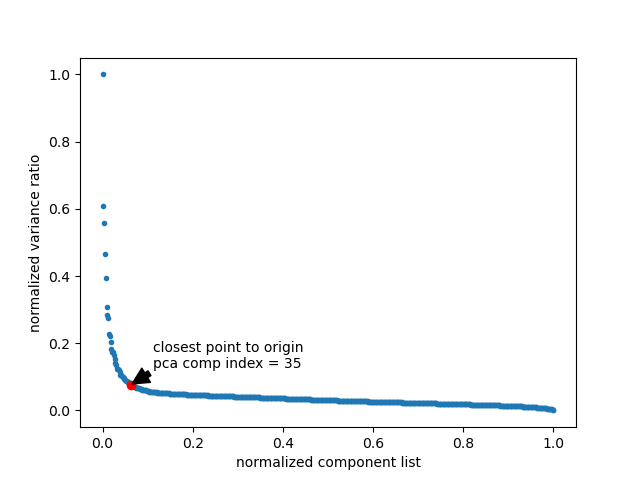

<IPython.core.display.Javascript object>


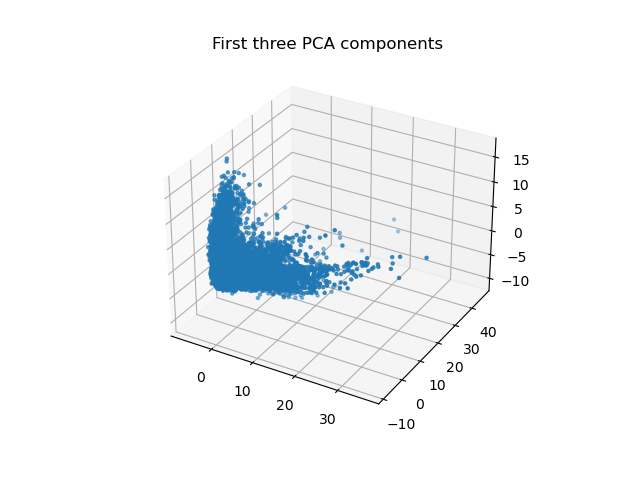

In [941]:
gaba_pca_index, gaba_arr_pca, status_df = dp.analyze_pca(arr = gaba_log_std_arr, #log_std_arr
                                               n_components=gaba_log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

In [942]:
gaba_arr_pca.shape

(15039, 35)

In [943]:
gaba_meta_data_df_pca = gaba_meta_data_df.T.copy()

In [944]:
vars_use = ['SampleID']
ho = hm.run_harmony(gaba_arr_pca,gaba_meta_data_df_pca,vars_use)

2024-07-16 10:07:43,930 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-07-16 10:07:45,362 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-07-16 10:07:45,418 - harmonypy - INFO - Iteration 1 of 10
2024-07-16 10:07:49,174 - harmonypy - INFO - Iteration 2 of 10
2024-07-16 10:07:52,953 - harmonypy - INFO - Iteration 3 of 10
2024-07-16 10:07:55,521 - harmonypy - INFO - Iteration 4 of 10
2024-07-16 10:07:57,082 - harmonypy - INFO - Iteration 5 of 10
2024-07-16 10:07:58,464 - harmonypy - INFO - Iteration 6 of 10
2024-07-16 10:07:59,802 - harmonypy - INFO - Iteration 7 of 10
2024-07-16 10:08:01,134 - harmonypy - INFO - Iteration 8 of 10
2024-07-16 10:08:02,485 - harmonypy - INFO - Iteration 9 of 10
2024-07-16 10:08:03,681 - harmonypy - INFO - Iteration 10 of 10
2024-07-16 10:08:05,028 - harmonypy - INFO - Stopped before convergence


In [945]:
ho.Z_corr.T.shape

(15039, 35)

In [946]:
gaba_hm_arr = ho.Z_corr.T

<IPython.core.display.Javascript object>


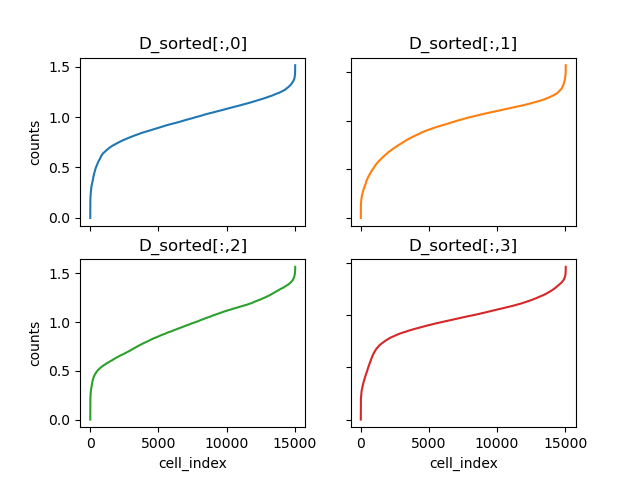

<IPython.core.display.Javascript object>


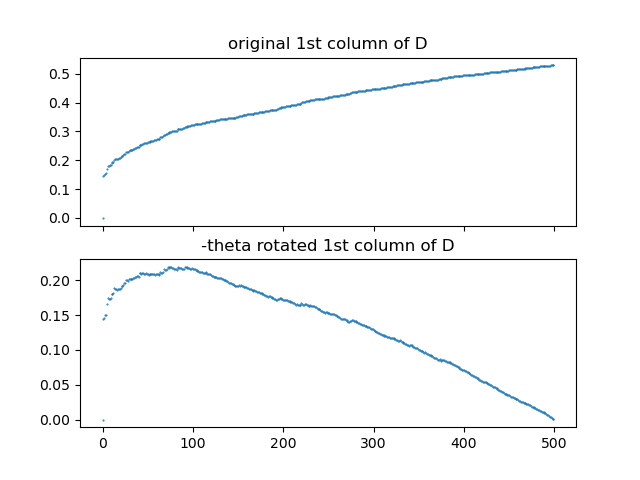

In [947]:
perplexity,status_df = dp.get_perplexity(pca_arr = gaba_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

In [948]:
gaba_hm_arr.shape

(15039, 35)

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 51.0


<IPython.core.display.Javascript object>


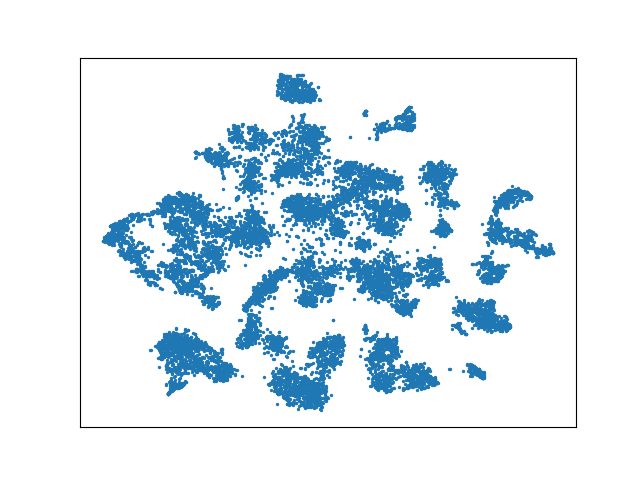

In [949]:
gaba_arr_tsne,status_df = dp.do_tsne(arr = gaba_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

fix minpts = 20, run a range of eps_prc

In [950]:
#for e in range(50,80,5):
    #epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=e, arr= gaba_arr_tsne, status_df = status_df)
    #labels,n_clusters, arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = gaba_arr_tsne, status_df = status_df)

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.0684145240856862

running dbscan with epsilon: 1.0684145240856862  and minpts: 20
Estimated number of clusters: 66
Estimated number of noise points: 1510


<IPython.core.display.Javascript object>


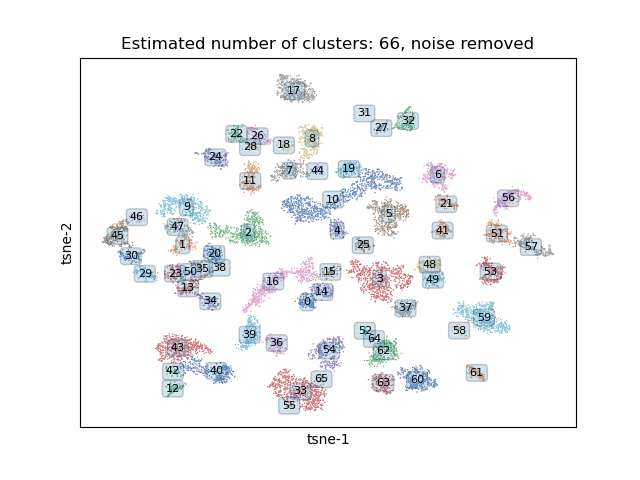

In [965]:
epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=65, arr= gaba_arr_tsne, status_df = status_df)
gaba_labels,n_clusters, gaba_arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = gaba_arr_tsne, status_df = status_df)

In [174]:
gaba_df_pre_linkage_ls, gaba_meta_data_df_pre_linkage, gaba_unique_labels = dp.sort_by_cluster_label(gaba_df_ls,
                                                                               gaba_meta_data_df,
                                                                               gaba_arr,
                                                                               gaba_labels)

In [6]:
today

'2024-06-07'

In [176]:
unique_labels

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67])

In [3]:
## CHECKPOINT - SAVE FILES
folder = '/bigdata/isaac/gaba_files/'
file1 = 'gaba_df_pre_linkage_ls_' + today
file2 = 'gaba_meta_data_df_pre_linkage_' + today
file3 = 'gaba_unique_labels_' + today 

#gaba_df_pre_linkage_ls.to_feather(folder+file1+'.feather')
#gaba_meta_data_df_pre_linkage.to_json(folder+file2+'.json')
#np.save(folder+file3 +'.npy', gaba_unique_labels)

gaba_df_pre_linkage_ls = pd.read_feather('/bigdata/isaac/gaba_files/gaba_df_pre_linkage_ls_2024-06-04.feather')
gaba_meta_data_df_pre_linkage = pd.read_json('/bigdata/isaac/gaba_files/gaba_meta_data_df_pre_linkage_2024-06-04.json')
gaba_unique_labels = np.load(folder+'gaba_unique_labels_2024-06-04'+'.npy')

In [5]:
linkage_alg = 'ward'
dist_metric = 'euclidean'

<IPython.core.display.Javascript object>


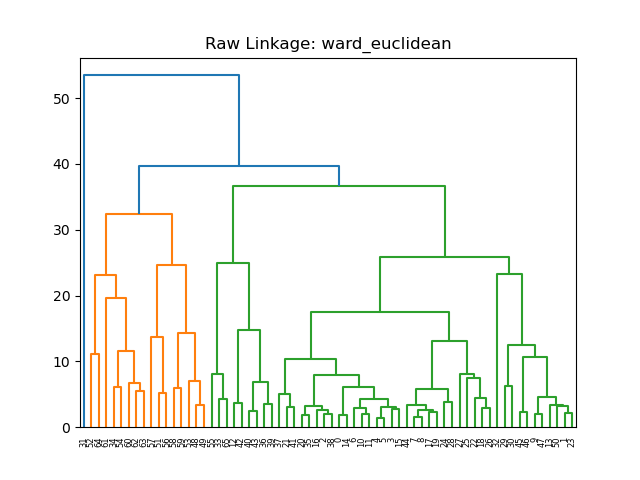

[31 12 42 43 40 39 36 55 65 33 16 38  2 20 35  0 14  4  5  3 15 11 10  6
 21 41 37 25 22 26 18 27 24 28  8  7 19 17 44 46 45  9 47 50 23  1 13 29
 30 32 51 56 57 53 48 49 59 58 61 60 63 62 54 34 64 52]


<IPython.core.display.Javascript object>


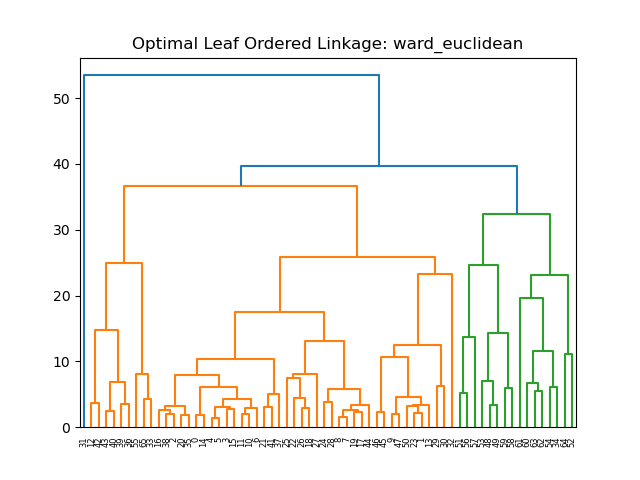

In [6]:
gaba_df_post_linkage, gaba_meta_data_df_post_linkage, linkage_cluster_order, Z_ordered, mpg_pca, linkage_cluster_order_po = dp.inter_cluster_sort(gaba_df_pre_linkage_ls,
                                                 gaba_meta_data_df_pre_linkage, 
                                                 gaba_unique_labels,
                                                 n_components = 10, 
                                                 linkage_alg = linkage_alg,
                                                 dist_metric = dist_metric)

<IPython.core.display.Javascript object>


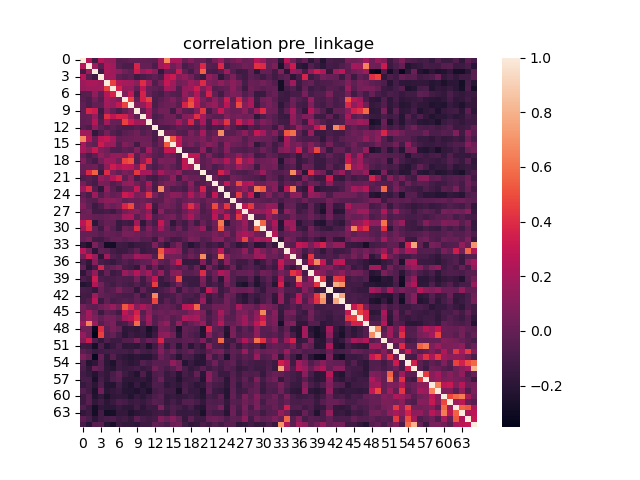

In [7]:
mpg_pca_df = pd.DataFrame(data = mpg_pca)
plt.figure()
ax = sns.heatmap(mpg_pca_df.corr(method='pearson'))
plt.title('correlation pre_linkage')
plt.show()

<IPython.core.display.Javascript object>


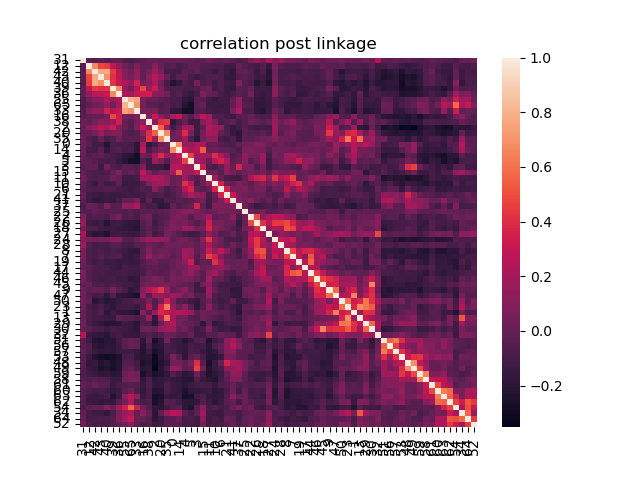

In [8]:
mpg_pca_pl_df = mpg_pca_df.reindex(columns = linkage_cluster_order)
plt.figure()
ax = sns.heatmap(mpg_pca_pl_df.corr(method='pearson'), yticklabels=True, xticklabels=True)
plt.title('correlation post linkage')
#plt.savefig(folder + 'mpg_pca_corr_post_linkage')
plt.show()

In [59]:
gaba_df.shape

(27933, 15039)

In [60]:
gaba_df = dp.gene_remover(IEG_list, gaba_df)

removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


In [61]:
gaba_df.shape

(27880, 15039)

In [91]:
gaba_df_s = gaba_df.reindex(columns = gaba_df_post_linkage.columns)

In [92]:
gaba_df_s.shape

(27880, 13529)

In [725]:
gaba_meta_data_df_post_linkage.shape

(29, 13529)

In [ ]:
#26 jun - tried loading from checkpoint, got hungup at intra cluster sort step

In [95]:
#with perplexity = 15 got "ValueError: perplexity must be less than n_samples" since smallest cluster (see x_arr)
#takes dim (549,8)
#so changed to perplexity = 7
gaba_df_post_linkage_intra_sorted, gaba_meta_data_df_plis, cluster_indices = dp.intra_cluster_sort(gaba_df_s, 
                                                                                              gaba_meta_data_df_post_linkage, 
                                                                                              linkage_cluster_order)

In [96]:
gaba_marker_genes_sorted, pos, ind, ind_s, mgs = dp.compute_marker_genes(gaba_df_post_linkage_intra_sorted,
                                                gaba_meta_data_df_plis,
                                                cluster_indices,
                                                linkage_cluster_order,
                                                n_markers=5)

/home/isaac/analysis/scRNA-seq/dimorph_processing.py:709: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0_ind_arr = np.column_stack((xi0_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:714: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0p5_ind_arr = np.column_stack((xi0p5_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0p5_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:719: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is

len marker_genes_sorted_final 320


In [66]:
np.random.seed(5)
test = np.random.randn(5,5)
print (test)
ind = np.argmax(test, axis=1)
print (ind)
ind_s = np.argsort(ind)
print (ind_s)

[[ 0.44122749 -0.33087015  2.43077119 -0.25209213  0.10960984]
 [ 1.58248112 -0.9092324  -0.59163666  0.18760323 -0.32986996]
 [-1.19276461 -0.20487651 -0.35882895  0.6034716  -1.66478853]
 [-0.70017904  1.15139101  1.85733101 -1.51117956  0.64484751]
 [-0.98060789 -0.85685315 -0.87187918 -0.42250793  0.99643983]]
[2 0 3 2 4]
[1 0 3 2 4]


In [67]:
len(linkage_cluster_order)

66

In [783]:
tg, tgfs = dp.get_heatmap_labels(mgs, ind, ind_s)

In [133]:
#gaba_marker_genes_sorted

In [132]:
gaba_cl_mg_dict

{31: ['Chat',
  'Th',
  'Hspb8',
  'Lhx8',
  'Isl1',
  'Matn2',
  'Ndrg1',
  'Deptor',
  'Pbx3',
  'Slc10a4',
  'Nkx2-1',
  'Zic1',
  'Ngfr',
  'Trap1a',
  'Slc5a7',
  'Slc18a3',
  'Ntrk1'],
 12: ['Dkk2',
  'Rbp1',
  'Creb3l1',
  'Pdyn',
  'Fbn2',
  'Wfs1',
  'Map3k15',
  'Prok2',
  'Prdm13',
  'Esr1',
  'Hs3st6',
  'Cd68'],
 42: ['Brinp3',
  'Arpp21',
  'Tmem100',
  'C1ql1',
  'Pappa',
  'Rcn1',
  'Cartpt',
  'Dkk3'],
 43: ['Jsrp1', 'Unc13c', 'Crtac1', 'Phxr4', 'Clca3a1', 'Tmem26', 'Ddc'],
 40: ['Apoc3', 'Igfbp6', 'Rprm'],
 39: ['Cck', 'Bmpr1b', 'Grp', 'Slc35d3'],
 36: ['Pde1c', 'Ramp3', 'Ppp1r17', 'Cbln1', 'Cckar', 'Plagl1', 'Prlr'],
 55: ['Kcng2',
  'Klhl14',
  'Fam159b',
  'Gm28884',
  'Brs3',
  'Defb1',
  'St18',
  'Gm17660',
  'Chst8',
  'Gpd1'],
 65: ['Phgdh'],
 33: [],
 16: ['Calcr', 'Gpc3', 'Myl4'],
 38: ['Gm5141', 'Pgr15l'],
 2: ['Col18a1'],
 20: ['Lamb3', 'Greb1'],
 35: ['Msn'],
 0: ['Brinp1', 'Gpr101'],
 14: ['Rxfp1', 'Ccdc153', 'Dnah5', 'Nrgn', 'Lypd1'],
 4: ['Spint1', 'My

In [98]:
gaba_df_marker = gaba_df_post_linkage_intra_sorted.loc[gaba_marker_genes_sorted,:]

In [99]:
gaba_df_marker.shape

(320, 13529)

In [100]:
status_df = dp.intialize_status_df()

In [101]:
gaba_marker_log_and_std_arr, status_df = dp.log_and_standerdize_df(gaba_df_marker,status_df, log = False)

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


In [102]:
gaba_df_marker_log_and_std = pd.DataFrame(index = gaba_df_marker.index, 
                                          columns=gaba_df_post_linkage_intra_sorted.columns, 
                                          data = gaba_marker_log_and_std_arr.T)

In [103]:
gaba_df_marker_log_and_std_col = pd.DataFrame(data = gaba_df_marker_log_and_std.to_numpy(), 
                                         index = gaba_df_marker_log_and_std.index,
                                        columns = list(gaba_meta_data_df_plis.loc['cluster_label',:]))

In [104]:
gaba_df_marker_log_and_std_col.shape

(320, 13529)

In [76]:
'Matn2' in gaba_df_post_linkage_intra_sorted.index

True

In [134]:
tl = 0
for x in tg:
    tl+=len(x)
print (tl)

291


In [105]:
change_indices = dp.get_heatmap_cluster_borders(gaba_meta_data_df_plis)

Indices where the value changes: [0, 28, 143, 201, 671, 995, 1241, 1395, 1412, 1438, 2036, 2617, 2633, 3141, 3273, 3363, 3480, 3626, 3748, 4181, 4822, 4905, 5106, 6046, 6334, 6467, 6606, 6766, 6868, 6965, 7073, 7121, 7196, 7405, 7468, 7762, 8003, 8163, 8604, 8641, 8686, 8960, 9350, 9492, 9511, 9625, 9747, 9898, 10002, 10111, 10305, 10521, 10800, 11041, 11279, 11421, 11525, 12024, 12087, 12232, 12545, 12729, 13006, 13353, 13475, 13492]


In [78]:
folder = '/bigdata/isaac/gaba_files/'

<IPython.core.display.Javascript object>


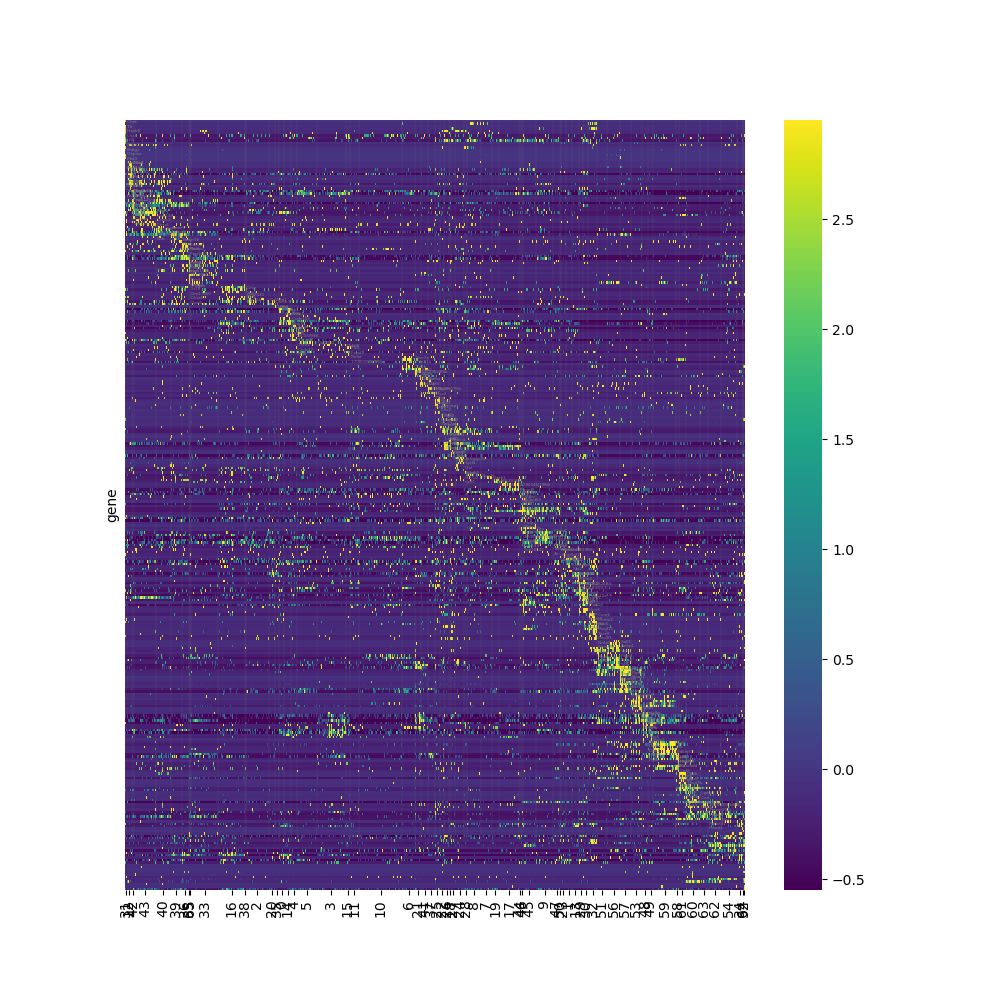

In [111]:
dp.plot_marker_heatmap(gaba_df_marker_log_and_std_col, 
                       pos, 
                       linkage_cluster_order, 
                       change_indices, 
                       tg, 
                       tgfs, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       savefig = True,
                       cell_class = 'GABA')

In [116]:
today

'2024-07-10'

In [119]:
'''
#run code below to generate and save interactive heatmap using hvplot
#NOTE - loading figure makes this nb size >100mb. to get back to normal, comment out, run cell, checkpoint.


# Calculate the 2nd and 98th percentiles for robust scaling (mimicing seaborn's robust = TRUE)
vmin, vmax = np.percentile(df.values, [2, 98])

# Create the heatmap
heatmap = gaba_df_marker_log_and_std.hvplot.heatmap(clim=(vmin, vmax), cmap='viridis', width=500, height=500, colorbar=True)

# Customize the heatmap with additional Holoviews elements
#xticks = [(i, label) for i, label in enumerate(linkage_cluster_order)]


xticks = [(p,label) for p, label in zip(pos,linkage_cluster_order)]

#vlines = hv.VLine(change_indices[32]).opts(color='gray', line_width=1)
#vlines = [hv.VLine(x).opts(color='gray', line_width=0.1) for x in change_indices]

all_vlines = []
for x in change_indices:
    vlines = hv.VLine(x).opts(color='gray', line_width=0.1)
    all_vlines.append(vlines)

# Combine heatmap with vertical lines and set xticks
final_plot = heatmap * vlines.opts(opts.HeatMap(xaxis='top', yaxis=None, xticks=xticks))

# Combine heatmap with vertical lines and set xticks
#final_plot = heatmap.opts(opts.HeatMap(xaxis='top', yaxis=None, xticks=xticks))


# Add vertical lines
for v in all_vlines:
    final_plot *= v

    
# Display the plot
hvplot.show(final_plot)
    
# Ensure output is displayed inline
hv.output(final_plot, backend='bokeh')

#save hv interactive heatmap plot to file
panel_object = pn.pane.HoloViews(final_plot)
pn.pane.HoloViews(final_plot).save(folder+'gaba_hvplot_' + today, embed=True, resources=INLINE)
'''

"\n#run code below to generate and save interactive heatmap using hvplot\n#NOTE - loading figure makes this nb size >100mb. to get back to normal, comment out, run cell, checkpoint.\n\n\n# Calculate the 2nd and 98th percentiles for robust scaling (mimicing seaborn's robust = TRUE)\nvmin, vmax = np.percentile(df.values, [2, 98])\n\n# Create the heatmap\nheatmap = gaba_df_marker_log_and_std.hvplot.heatmap(clim=(vmin, vmax), cmap='viridis', width=500, height=500, colorbar=True)\n\n# Customize the heatmap with additional Holoviews elements\n#xticks = [(i, label) for i, label in enumerate(linkage_cluster_order)]\n\n\nxticks = [(p,label) for p, label in zip(pos,linkage_cluster_order)]\n\n#vlines = hv.VLine(change_indices[32]).opts(color='gray', line_width=1)\n#vlines = [hv.VLine(x).opts(color='gray', line_width=0.1) for x in change_indices]\n\nall_vlines = []\nfor x in change_indices:\n    vlines = hv.VLine(x).opts(color='gray', line_width=0.1)\n    all_vlines.append(vlines)\n\n# Combine hea

top genes for each cluster (shown as stacked labels in heatmap)

In [199]:
np.sort(np.unique(ind))

array([ 0,  1,  2,  3,  4,  5,  6,  7, 10, 11, 12, 13, 15, 16, 17, 18, 20,
       23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40,
       41, 42, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59, 60, 61,
       63, 64, 65])

In [120]:
#06-07-2024
#for c,g in zip(linkage_cluster_order,tg):
    #print (c,g)

In [114]:
#07.10.24
for c,g in zip(linkage_cluster_order,tg):
    print (c,g)

31 ['Chat', 'Th', 'Hspb8', 'Lhx8', 'Isl1', 'Matn2', 'Ndrg1', 'Deptor', 'Pbx3', 'Slc10a4', 'Nkx2-1', 'Zic1', 'Ngfr', 'Trap1a', 'Slc5a7', 'Slc18a3', 'Ntrk1']
12 ['Dkk2', 'Rbp1', 'Creb3l1', 'Pdyn', 'Fbn2', 'Wfs1', 'Map3k15', 'Prok2', 'Prdm13', 'Esr1', 'Hs3st6', 'Cd68']
42 ['Brinp3', 'Arpp21', 'Tmem100', 'C1ql1', 'Pappa', 'Rcn1', 'Cartpt', 'Dkk3']
43 ['Jsrp1', 'Unc13c', 'Crtac1', 'Phxr4', 'Clca3a1', 'Tmem26', 'Ddc']
40 ['Apoc3', 'Igfbp6', 'Rprm']
39 ['Cck', 'Bmpr1b', 'Grp', 'Slc35d3']
36 ['Pde1c', 'Ramp3', 'Ppp1r17', 'Cbln1', 'Cckar', 'Plagl1', 'Prlr']
55 ['Kcng2', 'Klhl14', 'Fam159b', 'Gm28884', 'Brs3', 'Defb1', 'St18', 'Gm17660', 'Chst8', 'Gpd1']
65 ['Phgdh']
33 []
16 ['Calcr', 'Gpc3', 'Myl4']
38 ['Gm5141', 'Pgr15l']
2 ['Col18a1']
20 ['Lamb3', 'Greb1']
35 ['Msn']
0 ['Brinp1', 'Gpr101']
14 ['Rxfp1', 'Ccdc153', 'Dnah5', 'Nrgn', 'Lypd1']
4 ['Spint1', 'Myh7', 'BC039966', 'Il1rapl2', 'Tnnt2', 'Ccdc42', 'Ngb']
5 ['Col23a1']
3 ['Ddit4l']
15 ['Plk5', 'Fxyd1', 'Rmst', '1700016K19Rik']
11 []
10 []

In [142]:
gaba_df_marker_log_and_std

,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,CGAGTGCAGGCAGTCA-1_10X37_2,GTAGATCGTTGACGGA-1_10X51_3,AACCCAAAGAAATGGG-1_10X35_2,TTTACCAAGGGCAACT-1_10X51_1,CAGGGCTGTATCTTCT-1_10X51_1,ATGACCATCGTGAGAG-1_10X51_1,CAACAACAGACATATG-1_10X35_2,GCAGCTGTCCCGTTGT-1_10X52_1,...,GTTAGACGTGTCTAAC-1_10X36_2,TTCCGGTAGATAACGT-1_10X51_4,CAGCGTGTCGGAAACG-1_10X52_3,GGCACGTAGAGAGCAA-1_10X36_1,CCTCCAATCGCCTCTA-1_10X36_2,AATGGAATCTCGGGAC-1_10X51_2,TTGACCCAGCTCATAC-1_10X51_2,CATCGGGGTGTTCCTC-1_10X38_1,ATTACTCAGGTGAGAA-1_10X38_1,GAGGCCTAGCGTATGG-1_10X37_1
gene,,,,,,,,,,,,,,,,,,,,,
Chat,-0.026056,-0.026056,9.090578,3.012822,12.129455,3.012822,21.246089,3.012822,18.207211,3.012822,...,-0.026056,-0.026056,-0.026056,-0.026056,-0.026056,-0.026056,-0.026056,-0.026056,-0.026056,-0.026056
Th,-0.116086,-0.116086,4.462704,-0.116086,15.909678,4.462704,9.041493,-0.116086,-0.116086,-0.116086,...,-0.116086,-0.116086,-0.116086,-0.116086,-0.116086,-0.116086,-0.116086,-0.116086,-0.116086,-0.116086
Hspb8,-0.058845,-0.058845,5.110692,-0.058845,10.280228,-0.058845,15.449765,-0.058845,-0.058845,10.280228,...,-0.058845,-0.058845,-0.058845,5.110692,-0.058845,-0.058845,-0.058845,-0.058845,-0.058845,-0.058845
Lhx8,1.515456,6.344902,7.954717,12.784163,25.662685,-0.094359,11.174348,4.735087,20.833239,1.515456,...,-0.094359,-0.094359,-0.094359,7.954717,-0.094359,1.515456,-0.094359,-0.094359,-0.094359,-0.094359
Isl1,-0.150350,-0.150350,7.433875,7.433875,2.883340,1.366495,7.433875,8.950721,19.568637,5.917030,...,-0.150350,-0.150350,-0.150350,-0.150350,-0.150350,-0.150350,-0.150350,-0.150350,-0.150350,-0.150350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Npy,-0.156132,-0.156132,-0.156132,-0.156132,-0.156132,-0.156132,-0.156132,-0.006968,-0.156132,-0.156132,...,13.716066,13.417739,2.677973,0.440522,10.136144,9.539490,2.379647,4.617098,0.888012,34.151454
Crhbp,-0.177168,-0.177168,-0.177168,-0.177168,-0.177168,-0.177168,-0.177168,-0.177168,-0.177168,-0.177168,...,0.297561,16.438358,-0.177168,-0.177168,7.893230,15.014170,-0.177168,0.772290,-0.177168,13.589982
Gcnt1,-0.069429,-0.069429,-0.069429,-0.069429,-0.069429,-0.069429,-0.069429,-0.069429,-0.069429,-0.069429,...,-0.069429,-0.069429,-0.069429,-0.069429,29.283682,-0.069429,-0.069429,-0.069429,-0.069429,19.499312


In [143]:
gaba_meta_data_df_plis

,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,CGAGTGCAGGCAGTCA-1_10X37_2,GTAGATCGTTGACGGA-1_10X51_3,AACCCAAAGAAATGGG-1_10X35_2,TTTACCAAGGGCAACT-1_10X51_1,CAGGGCTGTATCTTCT-1_10X51_1,ATGACCATCGTGAGAG-1_10X51_1,CAACAACAGACATATG-1_10X35_2,GCAGCTGTCCCGTTGT-1_10X52_1,...,GTTAGACGTGTCTAAC-1_10X36_2,TTCCGGTAGATAACGT-1_10X51_4,CAGCGTGTCGGAAACG-1_10X52_3,GGCACGTAGAGAGCAA-1_10X36_1,CCTCCAATCGCCTCTA-1_10X36_2,AATGGAATCTCGGGAC-1_10X51_2,TTGACCCAGCTCATAC-1_10X51_2,CATCGGGGTGTTCCTC-1_10X38_1,ATTACTCAGGTGAGAA-1_10X38_1,GAGGCCTAGCGTATGG-1_10X37_1
Serial_Number,64.0,98.0,68.0,99.0,64.0,97.0,97.0,97.0,64.0,101.0,...,66.0,100.0,103.0,65.0,66.0,98.0,98.0,69.0,69.0,67.0
Date_Captured,2019-11-20,05/31/20,2019-11-25,05/31/20,2019-11-20,05/31/20,05/31/20,05/31/20,2019-11-20,05/31/20,...,2019-11-24,05/31/20,05/31/20,2019-11-24,2019-11-24,05/31/20,05/31/20,2019-12-01,2019-12-01,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,C57Bl/6,,C57Bl/6,C57Bl/6,C57Bl/6,,C57Bl/6,...,,C57Bl/6,C57Bl/6,,,C57Bl/6,C57Bl/6,,,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-F,Breeder-F,Naïve-M,Breeder-M,Naïve-F,Breeder-F,Breeder-F,Breeder-F,Naïve-F,Breeder-F,...,Naïve-M,Breeder-M,Breeder-M,Naïve-M,Naïve-M,Breeder-F,Breeder-F,Naïve-F,Naïve-F,Naïve-M
ChipID,10X35,10X51,10X37,10X51,10X35,10X51,10X51,10X51,10X35,10X52,...,10X36,10X51,10X52,10X36,10X36,10X51,10X51,10X38,10X38,10X37
SampleID,10X35_2,10X51_2,10X37_2,10X51_3,10X35_2,10X51_1,10X51_1,10X51_1,10X35_2,10X52_1,...,10X36_2,10X51_4,10X52_3,10X36_1,10X36_2,10X51_2,10X51_2,10X38_1,10X38_1,10X37_1
DonorID,"DI1,DI2",DI-B1-F,"DI4,DI5",DI-B1-M,"DI1,DI2",DI-B1-F,DI-B1-F,DI-B1-F,"DI1,DI2",DI-B3-F,...,DI3,DI-B1-M,DI-B3-M,DI3,DI3,DI-B1-F,DI-B1-F,DI6,DI6,"DI4,DI5"


In [36]:
today

'2024-06-27'

In [80]:
## save final marker df, associated meta data to file. 
folder = '/bigdata/isaac/gaba_files/'
file1 = 'gaba_df_marker_log_and_std' + today
file2 = 'gaba_meta_data_df_plis' + today


gaba_df_marker_log_and_std.to_feather(folder+file1+'.feather')
gaba_meta_data_df_plis.to_json(folder+file2+'.json')

In [81]:
#get non-log marker df, since amy df is non log
folder = '/bigdata/isaac/gaba_files/'
file = 'gaba_df_marker_' + today
gaba_df_marker.to_feather(folder+file+'.feather')


In [109]:
#also save dict with clusters and markers for each clusters
folder = '/bigdata/isaac/gaba_files/'
file4 = 'gaba_cl_mg_dict_' + today

#need to convert linkage cluster order to int (from int32) in order to store/write out dict
lco_int = [int(x) for x in linkage_cluster_order]
#store in dict
gaba_cl_mg_dict = dict(map(lambda i,j : (i,j) , lco_int,tg))

#write dict to file
with open(folder+file4+'.json', "w") as outfile: 
    json.dump(gaba_cl_mg_dict, outfile)

In [295]:
type(np.array(sorted(gaba_cl_mg_dict.keys())))

numpy.ndarray

In [426]:
gaba_cl_mg_dict.keys()

dict_keys([31, 12, 42, 43, 40, 39, 36, 55, 65, 33, 16, 38, 2, 20, 35, 0, 14, 4, 5, 3, 15, 11, 10, 6, 21, 41, 37, 25, 22, 26, 18, 27, 24, 28, 8, 7, 19, 17, 44, 46, 45, 9, 47, 50, 23, 1, 13, 29, 30, 32, 51, 56, 57, 53, 48, 49, 59, 58, 61, 60, 63, 62])

In [293]:
sorted(gaba_cl_mg_dict.keys())[-1:][0]

65

### After manual review of marker heatmap and correlation analysis from cell_comparison_nb.ipynb, create updated heatmap dropping clusters with no markers found from enrichment analysis (compute_marker_genes)

In [1031]:
clusters_to_drop = []
for k,v in gaba_cl_mg_dict.items():
    if len(v) == 0:
        clusters_to_drop.append(k)
    #after qualitative review, remove cluster 25 containting glut marker Slc17a6 , cluster 3 contating only Ddit4l
    
    if 'Slc17a6' in v:
        clusters_to_drop.append(k)
    if 'Ddit4l' in v:
        clusters_to_drop.append(k)
    if 'Gm5141' in v:
        clusters_to_drop.append(k)

    

In [1033]:
clusters_to_drop

[33, 38, 3, 11, 10, 25, 51]

In [1034]:
#get also missing key/value pairs

In [1035]:
full_rng = np.arange(sorted(gaba_cl_mg_dict.keys())[0],sorted(gaba_cl_mg_dict.keys())[-1:][0])

In [1036]:
missing_clusters = np.setdiff1d(full_rng, np.array(sorted(gaba_cl_mg_dict.keys())))

In [1037]:
clusters_to_drop.extend(missing_clusters)


In [1038]:
clusters_to_drop

[33, 38, 3, 11, 10, 25, 51, 34, 52, 54, 64]

In [776]:
linkage_cluster_order_filtered = [x for x in linkage_cluster_order if x not in clusters_to_drop]

In [784]:
tg_filtered = [x for x in tg if len(x)>0 and 'Slc17a6' not in x and 'Ddit4l' not in x and 'Gm5141' not in x]

In [786]:
tgfs_filtered = [x for x in tgfs if len(x)>1 and 'Slc17a6' not in x and 'Ddit4l' not in x and 'Gm5141' not in x]

In [789]:
filtered_index = [item for sublist in tg_filtered for item in sublist]

In [792]:
gaba_df_marker_log_and_std_filtered = gaba_df_marker_log_and_std.copy()
gaba_meta_data_df_plis_filtered = gaba_meta_data_df_plis.copy()

In [795]:
mask = gaba_meta_data_df_plis_filtered.loc['cluster_label'].apply(lambda x: x not in clusters_to_drop)

In [797]:
gaba_meta_data_df_plis_filtered = gaba_meta_data_df_plis_filtered.loc[:,mask]

In [798]:
gaba_meta_data_df_plis_filtered.shape

(29, 10292)

In [799]:
gaba_df_marker_log_and_std_filtered = gaba_df_marker_log_and_std_filtered.loc[filtered_index,mask]

In [800]:
gaba_df_marker_log_and_std_filtered.shape

(282, 10292)

In [804]:
change_indices_filtered = dp.get_heatmap_cluster_borders(gaba_meta_data_df_plis_filtered)

Indices where the value changes: [0, 28, 143, 201, 671, 995, 1241, 1395, 1412, 1438, 2019, 2527, 2659, 2749, 2866, 3012, 3134, 3567, 3650, 3938, 4071, 4210, 4370, 4467, 4575, 4623, 4698, 4907, 4970, 5264, 5505, 5665, 6106, 6143, 6188, 6462, 6852, 6994, 7013, 7127, 7249, 7400, 7504, 7613, 7807, 8086, 8327, 8565, 8707, 8811, 9310, 9373, 9518, 9831, 10015, 10291]


In [756]:
lc_ci_dict = dict(zip(linkage_cluster_order,cluster_indices))

In [836]:
cluster_indices_filtered_tmp = [v for k,v in lc_ci_dict.items() if k in linkage_cluster_order_filtered]

In [748]:
tmp = 0
pos_2 = [] 
for idx, c in enumerate(zip(linkage_cluster_order_filtered,cluster_indices_filtered)):
    #append mean of cell indices btwn tmp and tmp + length of cluster
    pos_2.append(np.mean(np.arange(tmp,tmp+len(c[1]))))
    #update pointer
    tmp+=len(c[1])

### Merge two clusters - after qualitative review, merge the following clusters e.g. 65 merges into 55

In [808]:

clusters_to_merge = {65:55}
clusters_to_merge

{65: 55}

In [811]:
gaba_df_marker_log_and_std_filtered_merged = gaba_df_marker_log_and_std_filtered.copy()
gaba_meta_data_df_plis_filtered_merged = gaba_meta_data_df_plis_filtered.copy()

In [812]:
#loop thru clusters to merge, replacing values in metadata
for k,v in clusters_to_merge.items():
    gaba_meta_data_df_plis_filtered_merged.loc['cluster_label', gaba_meta_data_df_plis_filtered_merged.loc['cluster_label']==k] = v

In [813]:
#dimensions sanity check that 65 (17 cells) was merged into 55 (26 cells). expect 17+26 = 43 columns.
gaba_meta_data_df_plis_filtered_merged.loc[:,gaba_meta_data_df_plis_filtered_merged.loc['cluster_label']==55]

,CACACAACAATGACCT-1_10X52_4,CTACATTAGGAGGCAG-1_10X51_4,GTGCTGGCAAGAATGT-1_10X51_1,CTCCCTCAGATGTTAG-1_10X36_2,GATGCTAAGCGTCTGC-1_10X36_1,TTGGGTATCGTTCTAT-1_10X52_3,GACAGCCGTGTTGACT-1_10X37_2,GCTTGGGAGGTATTGA-1_10X36_2,AGTGCCGAGCAGCCCT-1_10X36_2,TTCGATTCATACCAGT-1_10X52_4,...,CATACCCCAGTTTCGA-1_10X52_1,CGGAATTAGACCAAAT-1_10X52_1,GACCTTCGTATGAGGC-1_10X38_1,TCAGCAATCGTCAGAT-1_10X52_4,GACTATGGTTACGGAG-1_10X52_2,TGCAGTACACGCTTAA-1_10X36_2,TTGGTTTCAGACCAAG-1_10X51_3,TGCATGAGTTGTATGC-1_10X51_3,ATCGTAGAGAAGCTCG-1_10X52_2,AATTCCTGTGAATTAG-1_10X51_1
Serial_Number,104.0,100.0,97.0,66.0,65.0,103.0,68.0,66.0,66.0,104.0,...,101.0,101.0,69.0,104.0,102.0,66.0,99.0,99.0,102.0,97.0
Date_Captured,05/31/20,05/31/20,05/31/20,2019-11-24,2019-11-24,05/31/20,2019-11-25,2019-11-24,2019-11-24,05/31/20,...,05/31/20,05/31/20,2019-12-01,05/31/20,05/31/20,2019-11-24,05/31/20,05/31/20,05/31/20,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,,,C57Bl/6,,,,C57Bl/6,...,C57Bl/6,C57Bl/6,,C57Bl/6,C57Bl/6,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-M,Breeder-M,Breeder-F,Naïve-M,Naïve-M,Breeder-M,Naïve-M,Naïve-M,Naïve-M,Breeder-M,...,Breeder-F,Breeder-F,Naïve-F,Breeder-M,Breeder-F,Naïve-M,Breeder-M,Breeder-M,Breeder-F,Breeder-F
ChipID,10X52,10X51,10X51,10X36,10X36,10X52,10X37,10X36,10X36,10X52,...,10X52,10X52,10X38,10X52,10X52,10X36,10X51,10X51,10X52,10X51
SampleID,10X52_4,10X51_4,10X51_1,10X36_2,10X36_1,10X52_3,10X37_2,10X36_2,10X36_2,10X52_4,...,10X52_1,10X52_1,10X38_1,10X52_4,10X52_2,10X36_2,10X51_3,10X51_3,10X52_2,10X51_1
DonorID,DI-B3-M,DI-B1-M,DI-B1-F,DI3,DI3,DI-B3-M,"DI4,DI5",DI3,DI3,DI-B3-M,...,DI-B3-F,DI-B3-F,DI6,DI-B3-M,DI-B3-F,DI3,DI-B1-M,DI-B1-M,DI-B3-F,DI-B1-F


In [814]:
#update tg_filtered_merged/
tg_filtered_merged = []
i_2_rmv = None
for i,(c,tg) in enumerate(zip(linkage_cluster_order_filtered,tg_filtered)):
    for k,v in clusters_to_merge.items():
        if c == k:
            #print (c)
            #print (tg_filtered[i])
            tg_filtered_merged[i-1].extend(tg_filtered[i])
            i_2_rmv = i
    tg_filtered_merged.append(tg_filtered[i])
    #remove cluster that was merged
    if i == i_2_rmv:
        #print (i_2_rmv)
        del tg_filtered_merged[i_2_rmv]
        
    

In [816]:
tgfs_filtered_merged = dp.get_tgfs_from_tg(tg_filtered_merged)

In [818]:
#get change_indices_filtered_merged
change_indices_filtered_merged = dp.get_heatmap_cluster_borders(gaba_meta_data_df_plis_filtered_merged)

Indices where the value changes: [0, 28, 143, 201, 671, 995, 1241, 1395, 1438, 2019, 2527, 2659, 2749, 2866, 3012, 3134, 3567, 3650, 3938, 4071, 4210, 4370, 4467, 4575, 4623, 4698, 4907, 4970, 5264, 5505, 5665, 6106, 6143, 6188, 6462, 6852, 6994, 7013, 7127, 7249, 7400, 7504, 7613, 7807, 8086, 8327, 8565, 8707, 8811, 9310, 9373, 9518, 9831, 10015, 10291]


In [820]:
#get linkage_cluster_order_filtered_merged
linkage_cluster_order_filtered_merged = [x for x in linkage_cluster_order_filtered if x not in list(clusters_to_merge.keys())]

In [823]:
cluster_indices_filtered_merged = [v for k,v in lc_ci_dict.items() if k in linkage_cluster_order_filtered_merged]

In [845]:
#get updated pos_filtered_merged, accounting for merged clusters
tmp = 0
pos_og = [] 
for idx, c in enumerate(zip(linkage_cluster_order,cluster_indices)):
    #append mean of cell indices btwn tmp and tmp + length of cluster
    pos_og.append(np.mean(np.arange(tmp,tmp+len(c[1]))))
    #update pointer
    tmp+=len(c[1])

In [851]:
#get updated pos_filtered_merged, accounting for merged clusters
tmp = 0
pos_filtered_tmp = [] 
for idx, c in enumerate(zip(linkage_cluster_order_filtered,cluster_indices_filtered_tmp)):
    #append mean of cell indices btwn tmp and tmp + length of cluster
    pos_filtered_tmp.append(np.mean(np.arange(tmp,tmp+len(c[1]))))
    #update pointer
    tmp+=len(c[1])

In [875]:
#get pos_filtered_merged by combining merged clusters
#manual...
pos_filtered_merged = pos_filtered_tmp.copy()
# Calculate the average of the 7th and 8th elements (index 6 and 7) - corresponding to clusters 55 and 65
average_value = (pos_filtered_merged[6] + pos_filtered_merged[7]) / 2
# Replace the 7th and 8th elements with the calculated average
pos_filtered_merged[6:8] = [average_value]

'''
#get updated pos_filtered_merged
tmp = 0
pos_filtered_merged = [] 
for idx, c in enumerate(zip(linkage_cluster_order_filtered_merged,cluster_indices_filtered_merged)):
    #append mean of cell indices btwn tmp and tmp + length of cluster
    pos_filtered_merged.append(np.mean(np.arange(tmp,tmp+len(c[1]))))
    #update pointer
    tmp+=len(c[1])
'''

'\n#get updated pos_filtered_merged\ntmp = 0\npos_filtered_merged = [] \nfor idx, c in enumerate(zip(linkage_cluster_order_filtered_merged,cluster_indices_filtered_merged)):\n    #append mean of cell indices btwn tmp and tmp + length of cluster\n    pos_filtered_merged.append(np.mean(np.arange(tmp,tmp+len(c[1]))))\n    #update pointer\n    tmp+=len(c[1])\n'

In [620]:
gaba_df_marker_log_and_std_col_filtered = pd.DataFrame(data = gaba_df_marker_log_and_std_filtered.to_numpy(), 
                                         index = gaba_df_marker_log_and_std_filtered.index,
                                        columns = list(gaba_meta_data_df_plis_filtered.loc['cluster_label',:]))

In [826]:
gaba_df_marker_log_and_std_col_filtered_merged = pd.DataFrame(data = gaba_df_marker_log_and_std_filtered_merged.to_numpy(), 
                                         index = gaba_df_marker_log_and_std_filtered_merged.index,
                                        columns = list(gaba_meta_data_df_plis_filtered_merged.loc['cluster_label',:]))

In [625]:
folder

'/bigdata/isaac/gaba_files/'

<IPython.core.display.Javascript object>


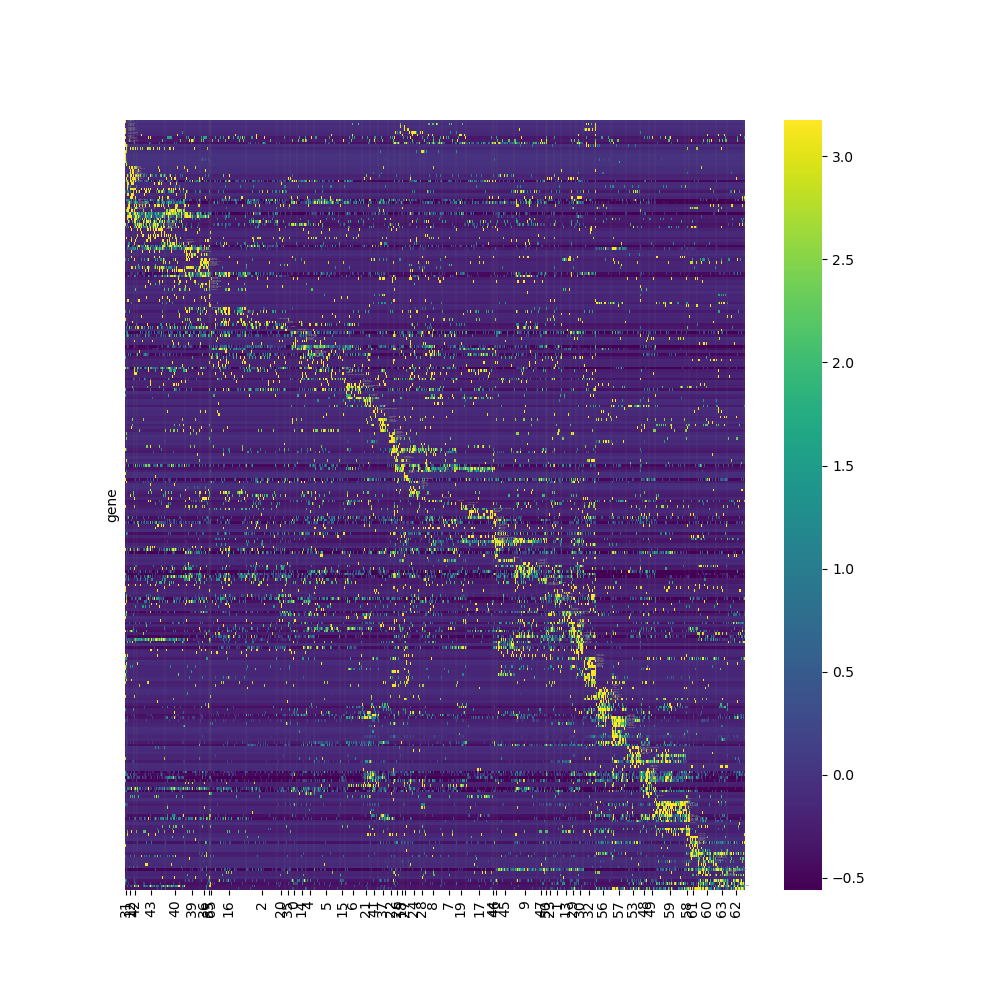

In [853]:
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(gaba_df_marker_log_and_std_col_filtered, 
                       pos_filtered_tmp, 
                       linkage_cluster_order_filtered, 
                       change_indices_filtered, 
                       tg_filtered, 
                       tgfs_filtered, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       savefig = True,
                       cell_class = 'GABA_filtered_1.7_bold_monospace_v_drop_25_3_filter_index_pos_filtered_tmp')

<IPython.core.display.Javascript object>


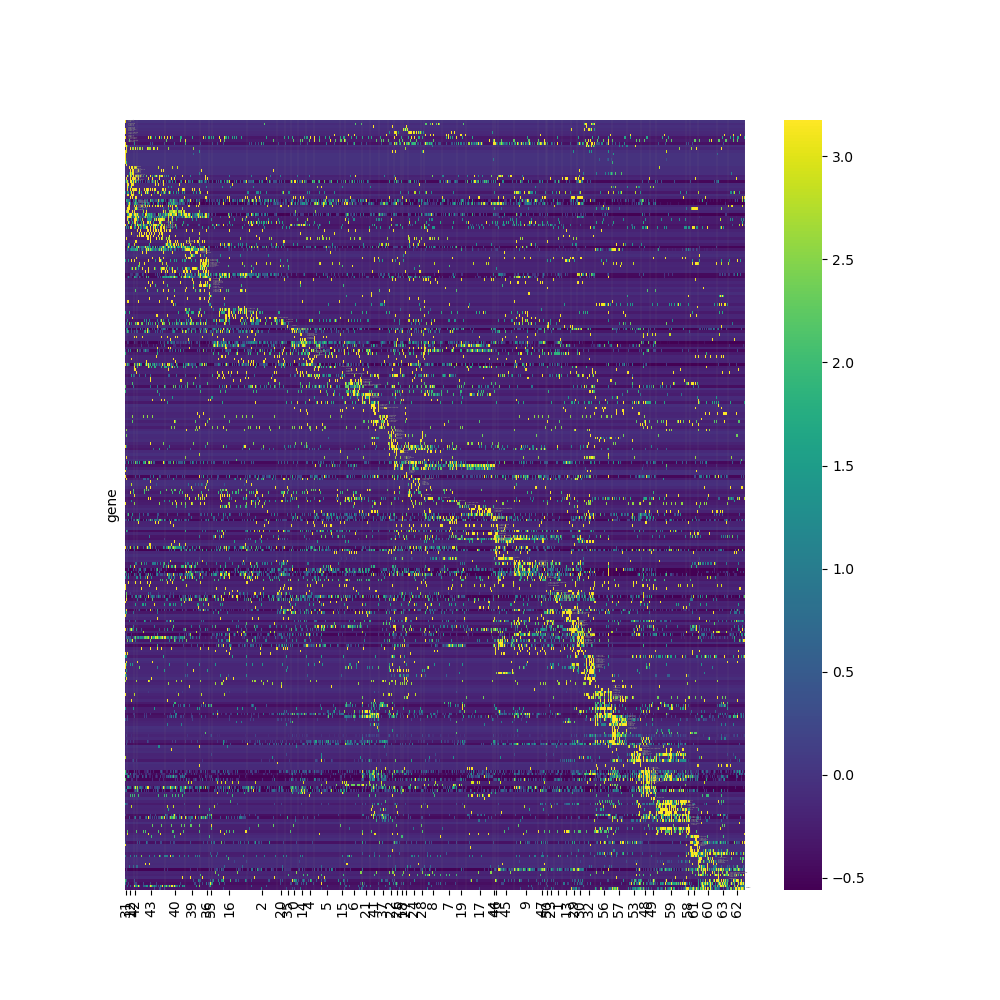

In [877]:
dp.plot_marker_heatmap(gaba_df_marker_log_and_std_col_filtered_merged, 
                       pos_filtered_merged, 
                       linkage_cluster_order_filtered_merged, 
                       change_indices_filtered_merged, 
                       tg_filtered_merged, 
                       tgfs_filtered_merged, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       savefig = True,
                       cell_class = 'GABA_filtered_1.7_bold_monospace_v_drop_25_3_38_filter_index_merge_65_55_fix_pos')

In [882]:
## CHECKPOINT - SAVE FILES
folder = '/bigdata/isaac/gaba_files/'
file1 = 'gaba_df_marker_log_and_std' + today
file2 = 'gaba_meta_data_df_plis_filtered_merged' + today
file3 = 'gaba_linkage_cluster_order_filtered_merged' + today 
file4 = 'gaba_change_indices_filtered_merged' + today
file5 = 'tg_filtered_merged' + today
file6 = 'tgfs_filtered_merged' + today

#note saving only log_and_std df, can't save latest due to duplicate columns.
#use metadata to get back to gaba_df_marker_log_and_std_col_filtered_merged
gaba_df_marker_log_and_std.to_feather(folder+file1+'.feather')
gaba_meta_data_df_plis_filtered_merged.to_json(folder+file2+'.json')
np.save(folder+file3, linkage_cluster_order_filtered_merged)
np.save(folder+file4, change_indices_filtered_merged)
#np.save(folder+file5, tg_filtered_merged)
#np.save(folder+file6, tgfs_filtered_merged)


### Update TSNE plot with merged/filtered clusters removed

In [1040]:
all_dropped_clusters = clusters_to_drop.copy()

In [1041]:
all_dropped_clusters.extend(list(clusters_to_merge.keys()))

In [1042]:
all_dropped_clusters

[33, 38, 3, 11, 10, 25, 51, 34, 52, 54, 64, 65]

In [1016]:
#filter original gaba_labels list
gaba_labels_filtered = [x for x in gaba_labels if x not in [33, 38, 3, 11, 10, 25, 51, 34, 52, 54, 64, 65]]

In [1017]:
gaba_labels

array([ 0,  1,  2, ..., 54, 54, 54])

In [1044]:
def plot_filtered_tsne(arr,labels,metadata_df,drop_clusters_list,plot_title):
    '''plot filtered tsne plot'''
    ids_filtered = np.sort(pd.unique(metadata_df.loc['cluster_label']))
    #arr.insert(2, 'labels',labels)
    arr_sorted = arr.sort_values(by = 'labels')
    arr_filtered = arr_sorted.copy()
    arr_filtered = arr_filtered[arr_filtered['labels'].isin(ids_filtered)]
    arr_xy = arr.drop('labels', axis = 'columns')
    fig,ax = plt.subplots()
    ax.scatter(arr_filtered['tsne-1'], arr_filtered['tsne-2'], s = 2)
    plt.xticks([])
    plt.yticks([])
    plt.title(plot_title)

    for label in set(labels):
        if label != -1:
            if label not in drop_clusters_list:
                cluster_median = gaba_arr_xy[labels == label].median()
                #print (cluster_median)
                ax.annotate(text = label, xy=cluster_median, fontsize=8, color='black',
                            ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
    plt.show()

/tmp/ipykernel_3821751/163413925.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()


<IPython.core.display.Javascript object>


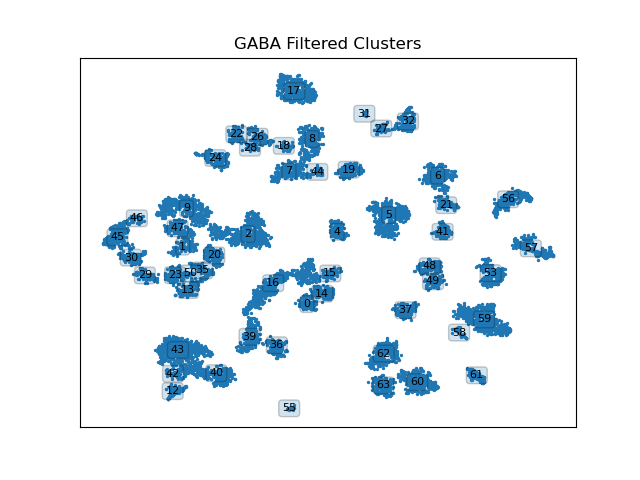

In [1045]:
plot_filtered_tsne(gaba_arr,gaba_labels,gaba_meta_data_df_plis_filtered_merged,all_dropped_clusters,'GABA Filtered Clusters')

In [1019]:
clusters_to_drop

[33, 38, 3, 11, 10, 25, 51, 34, 52, 54, 64]

## Vglut1 Analysis <a name="vglut1_analysis"></a>

num m cells: 5485 num f cells: 5802


<IPython.core.display.Javascript object>


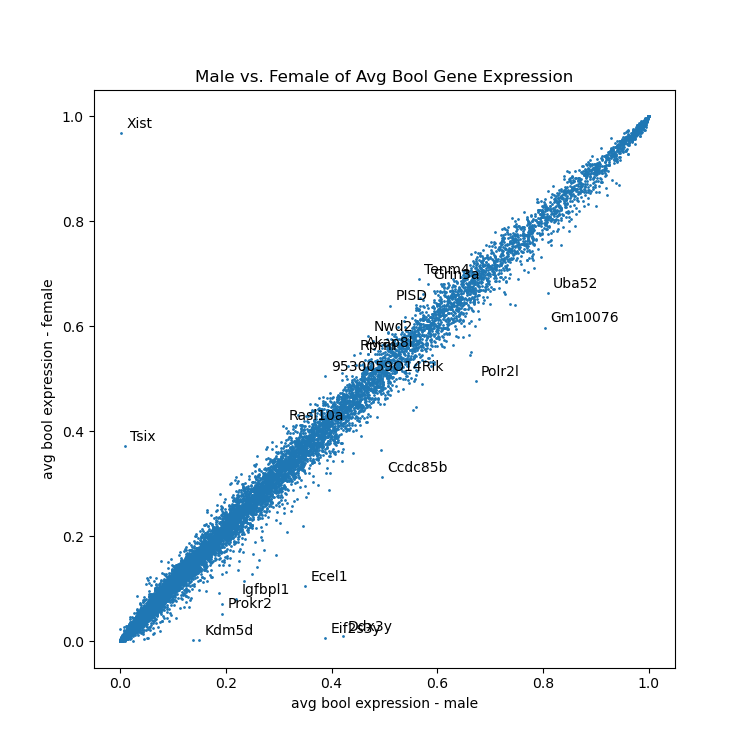

Total genes reduced from 27933 to 14208
removing  49  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


<IPython.core.display.Javascript object>


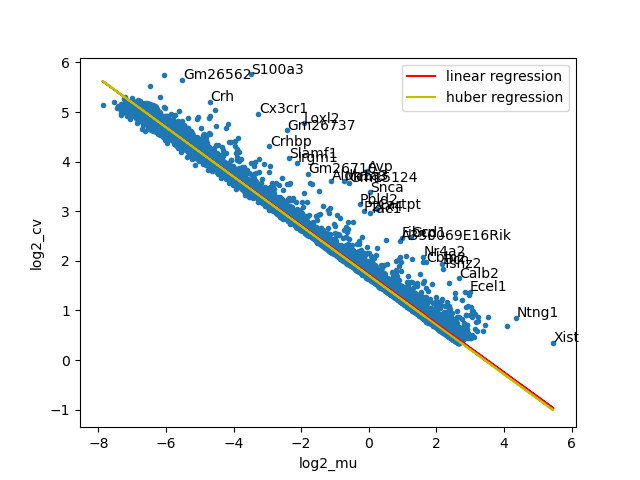

<IPython.core.display.Javascript object>


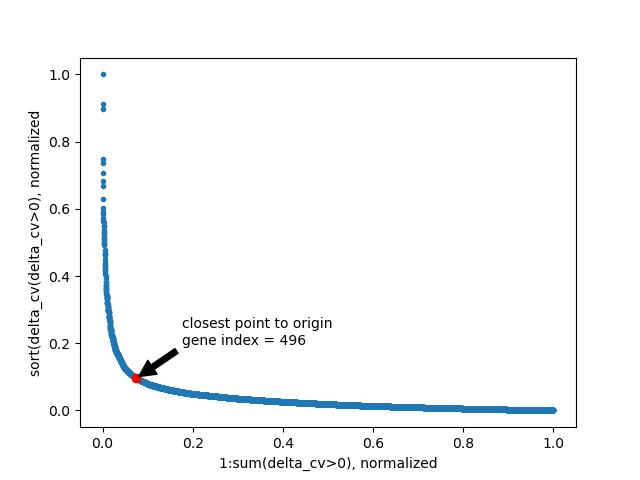

In [76]:

Vglut1_meta_data_df = meta_data_df.loc[:,meta_data_df.loc['cell_class',:] == 'Vglut1']
Vglut1_df = df.loc[:,meta_data_df.loc['cell_class',:] == 'Vglut1']
Vglut1_df_bool = Vglut1_df.mask(Vglut1_df>0, other = 1)
Vglut1_avg_bool_mf_df_sorted = dp.avg_bool_gene_expression_by_sex(df_bool = Vglut1_df_bool,
                                                              meta_data_df=Vglut1_meta_data_df,
                                                             num_top_genes=10,
                                                             plot_flag=1)
status_df = dp.intialize_status_df()
status_df.loc['cell_exclusion (l1)',:] = True
Vglut1_df_ge, Vglut1_df_bool, Vglut1_meta_data_df, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                      percent_cell_upper_bound=50,
                                                     df_bool=Vglut1_df_bool,
                                                     df = Vglut1_df,
                                                     meta_data_df = Vglut1_meta_data_df,
                                                     status_df = status_df)
#remove IEG genes
Vglut1_df_ge = dp.gene_remover(IEG_list,Vglut1_df_ge)
                        
Vglut1_cv_df = dp.analyze_cv(df = Vglut1_df_ge,
                      norm_scale_factor=20000,
                      num_top_genes=30,
                      plot_flag=1,
                     use_huber = True)

Vglut1_gene_index, Vglut1_df, status_df = dp.get_top_cv_genes(df = Vglut1_df_ge, cv_df=Vglut1_cv_df, plot_flag=1, status_df=status_df)

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


<IPython.core.display.Javascript object>


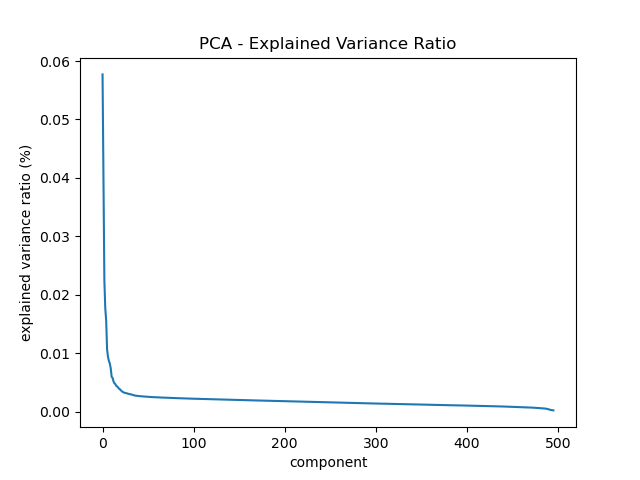

<IPython.core.display.Javascript object>


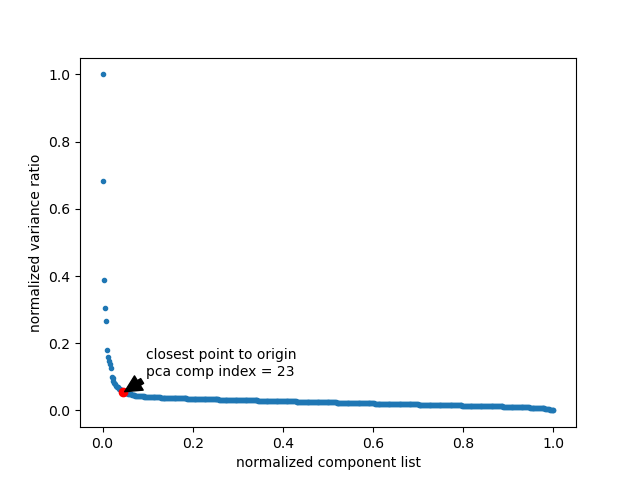

<IPython.core.display.Javascript object>


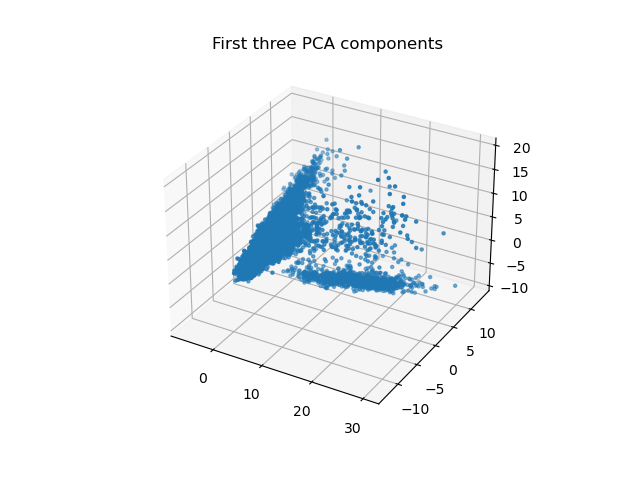

2024-06-06 09:34:57,455 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-06-06 09:34:58,512 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-06-06 09:34:58,556 - harmonypy - INFO - Iteration 1 of 10
2024-06-06 09:35:00,975 - harmonypy - INFO - Iteration 2 of 10
2024-06-06 09:35:04,212 - harmonypy - INFO - Iteration 3 of 10
2024-06-06 09:35:07,126 - harmonypy - INFO - Iteration 4 of 10
2024-06-06 09:35:10,107 - harmonypy - INFO - Iteration 5 of 10
2024-06-06 09:35:12,675 - harmonypy - INFO - Iteration 6 of 10
2024-06-06 09:35:14,412 - harmonypy - INFO - Iteration 7 of 10
2024-06-06 09:35:16,445 - harmonypy - INFO - Iteration 8 of 10
2024-06-06 09:35:18,265 - harmonypy - INFO - Converged after 8 iterations


<IPython.core.display.Javascript object>


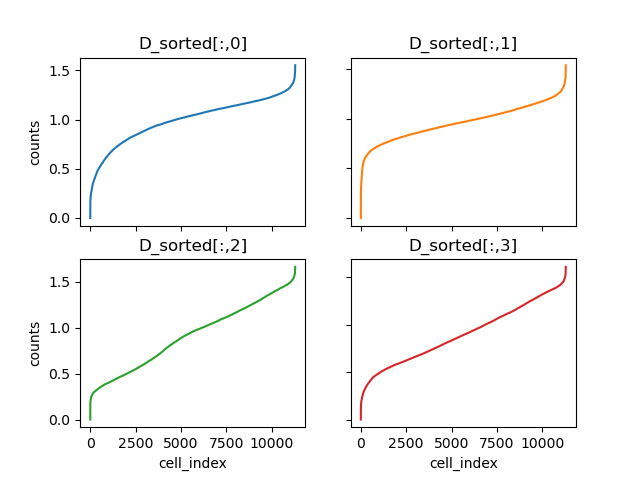

<IPython.core.display.Javascript object>


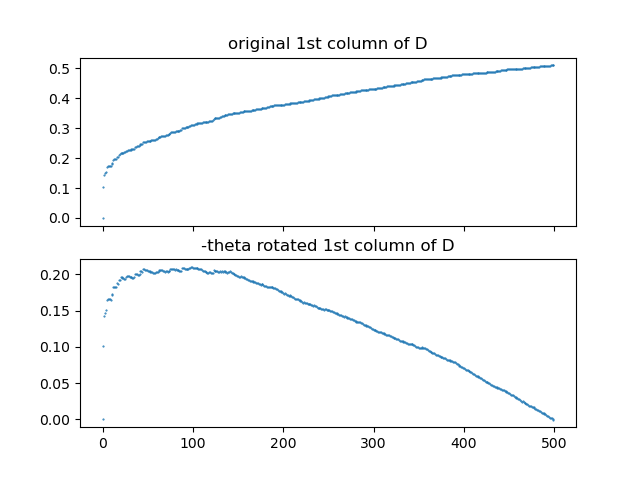

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 54.0


<IPython.core.display.Javascript object>


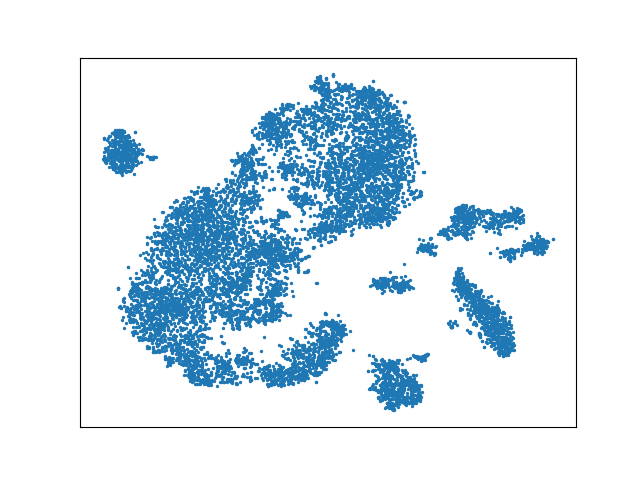

In [247]:
Vglut1_log_std_arr,status_df = dp.log_and_standerdize_df(Vglut1_df,status_df)
Vglut1_df_ls = pd.DataFrame(data = Vglut1_log_std_arr.T, index = Vglut1_df.index, columns=Vglut1_df.columns)

Vglut1_pca_index, Vglut1_arr_pca, status_df = dp.analyze_pca(arr = Vglut1_log_std_arr, #log_std_arr
                                               n_components=Vglut1_log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

Vglut1_meta_data_df_pca = Vglut1_meta_data_df.T.copy()

vars_use = ['SampleID']
ho = hm.run_harmony(Vglut1_arr_pca,Vglut1_meta_data_df_pca,vars_use)
Vglut1_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = Vglut1_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

Vglut1_arr_tsne,status_df = dp.do_tsne(arr = Vglut1_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

params for dbscan
minpts:  20
epsilon percentile 50
epsilon:  1.191870172472523

running dbscan with epsilon: 1.191870172472523  and minpts: 20
Estimated number of clusters: 50
Estimated number of noise points: 1999


<IPython.core.display.Javascript object>


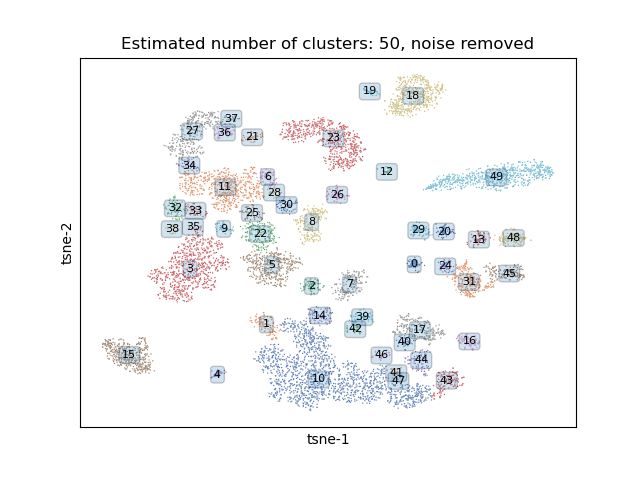

params for dbscan
minpts:  20
epsilon percentile 55
epsilon:  1.2275727227540816

running dbscan with epsilon: 1.2275727227540816  and minpts: 20
Estimated number of clusters: 45
Estimated number of noise points: 1683


<IPython.core.display.Javascript object>


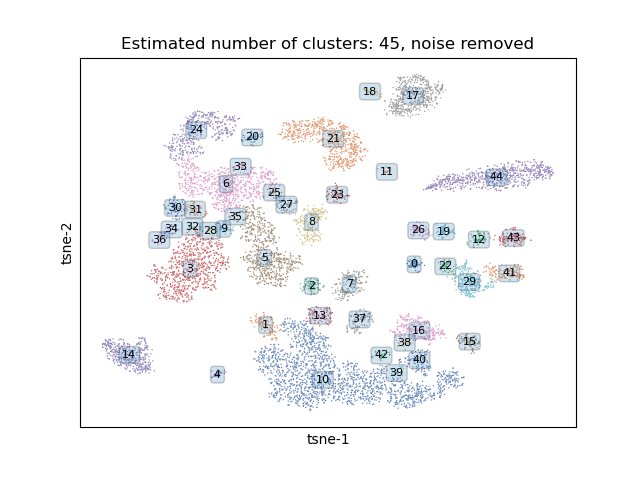

params for dbscan
minpts:  20
epsilon percentile 60
epsilon:  1.268055345128817

running dbscan with epsilon: 1.268055345128817  and minpts: 20
Estimated number of clusters: 40
Estimated number of noise points: 1408


<IPython.core.display.Javascript object>


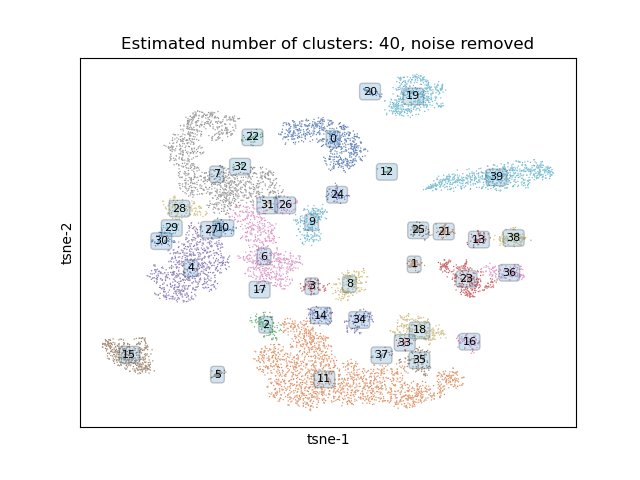

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.3109567094845322

running dbscan with epsilon: 1.3109567094845322  and minpts: 20
Estimated number of clusters: 31
Estimated number of noise points: 1114


<IPython.core.display.Javascript object>


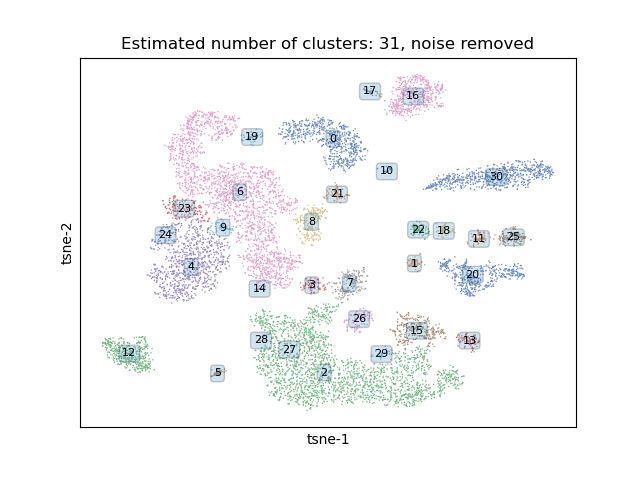

params for dbscan
minpts:  20
epsilon percentile 70
epsilon:  1.361799666218052

running dbscan with epsilon: 1.361799666218052  and minpts: 20
Estimated number of clusters: 28
Estimated number of noise points: 904


<IPython.core.display.Javascript object>


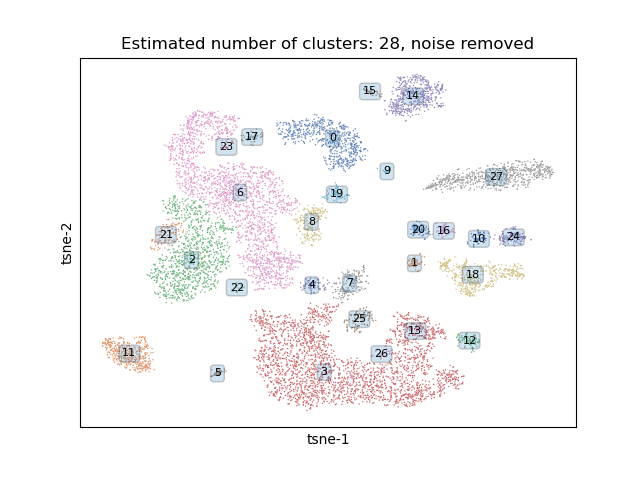

params for dbscan
minpts:  20
epsilon percentile 75
epsilon:  1.4218480040689196

running dbscan with epsilon: 1.4218480040689196  and minpts: 20
Estimated number of clusters: 27
Estimated number of noise points: 638


<IPython.core.display.Javascript object>


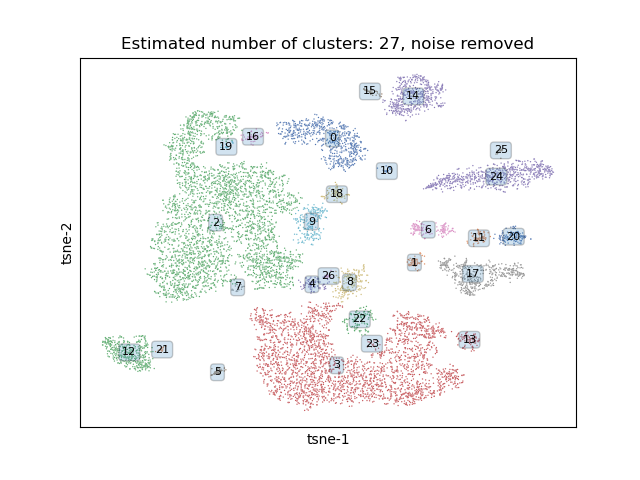

In [95]:
for e in range(50,80,5):
    epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=e, arr= Vglut1_arr_tsne, status_df = status_df)
    labels,n_clusters, arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = Vglut1_arr_tsne, status_df = status_df)

params for dbscan
minpts:  20
epsilon percentile 60
epsilon:  1.2510628313081809

running dbscan with epsilon: 1.2510628313081809  and minpts: 20
Estimated number of clusters: 45
Estimated number of noise points: 1175


<IPython.core.display.Javascript object>


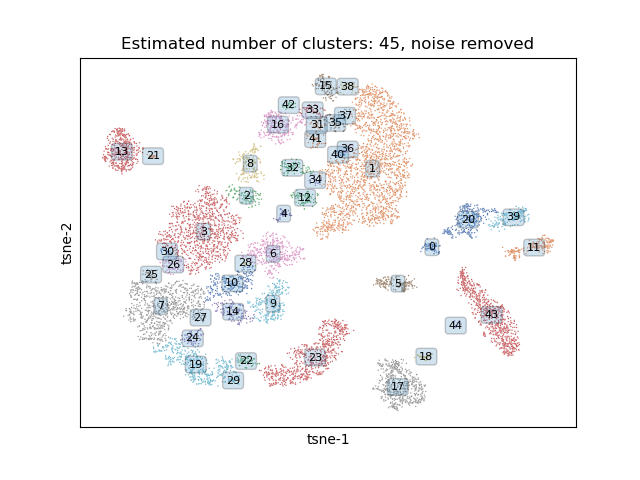

In [248]:
epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=60, arr= Vglut1_arr_tsne, status_df = status_df)
Vglut1_labels,n_clusters, Vglut1_arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = Vglut1_arr_tsne, status_df = status_df)

In [254]:
Vglut1_df_pre_linkage_ls, Vglut1_meta_data_df_pre_linkage, Vglut1_unique_labels = dp.sort_by_cluster_label(Vglut1_df_ls,
                                                                               Vglut1_meta_data_df,
                                                                               Vglut1_arr,
                                                                               Vglut1_labels)

In [70]:
today

'2024-06-07'

In [71]:
## CHECKPOINT - SAVE FILES
folder = '/bigdata/isaac/Vglut1_files/'
file1 = 'Vglut1_df_pre_linkage_ls_' + today
file2 = 'Vglut1_meta_data_df_pre_linkage_' + today
file3 = 'Vglut1_unique_labels_' + today 


#Vglut1_df_pre_linkage_ls.to_feather(folder+file1+'.feather')
#Vglut1_meta_data_df_pre_linkage.to_json(folder+file2+'.json')
#np.save(folder+file3 +'.npy', Vglut1_unique_labels)

Vglut1_df_pre_linkage_ls = pd.read_feather(folder + 'Vglut1_df_pre_linkage_ls_2024-06-06.feather')
Vglut1_meta_data_df_pre_linkage = pd.read_json(folder + 'Vglut1_meta_data_df_pre_linkage_2024-06-06.json')
Vglut1_unique_labels = np.load(folder+'Vglut1_unique_labels_2024-06-06.npy')

In [330]:
linkage_alg = 'ward'
dist_metric = 'euclidean'

<IPython.core.display.Javascript object>


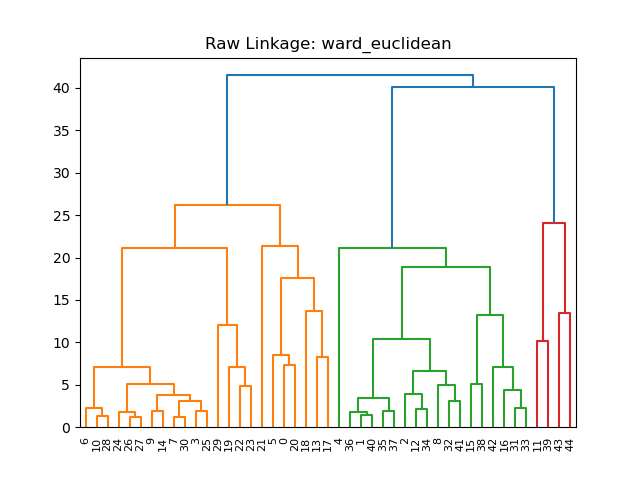

[29 19 22 23  9 14 30  7 25  3 27 26 24 10 28  6 21 18 17 13 20  0  5 39
 11 43 44 38 15 42 31 33 16 36  1 40 37 35  8 32 41 12 34  2  4]


<IPython.core.display.Javascript object>


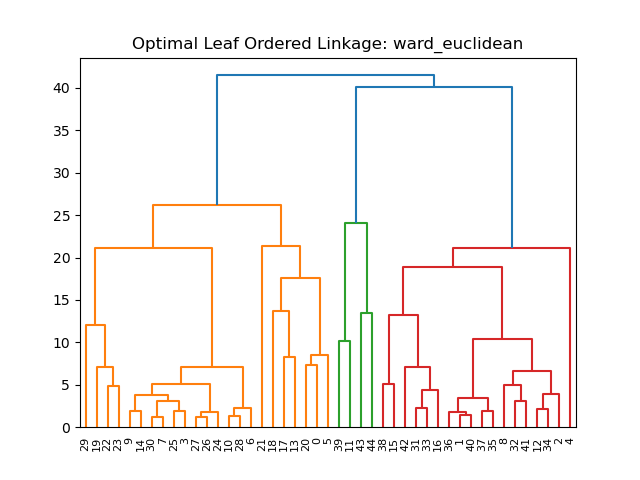

In [72]:
Vglut1_df_post_linkage, Vglut1_meta_data_df_post_linkage, linkage_cluster_order, Z_ordered, mpg_pca, linkage_cluster_order_po = dp.inter_cluster_sort(Vglut1_df_pre_linkage_ls,
                                                 Vglut1_meta_data_df_pre_linkage, 
                                                 Vglut1_unique_labels,
                                                 n_components = 10, 
                                                 linkage_alg = linkage_alg,
                                                 dist_metric = dist_metric)

<IPython.core.display.Javascript object>


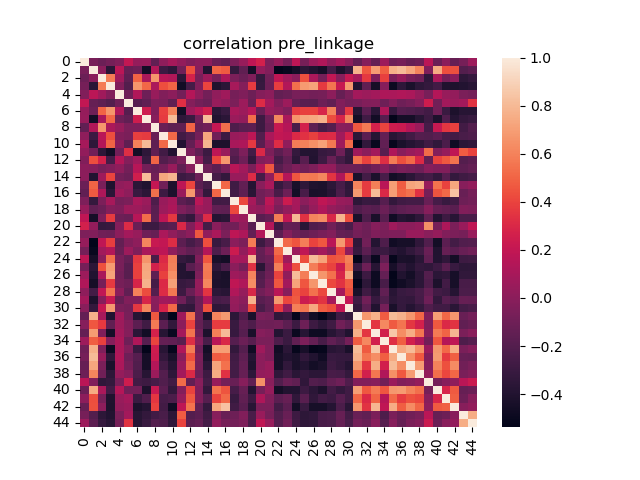

In [332]:
mpg_pca_df = pd.DataFrame(data = mpg_pca)
plt.figure()
ax = sns.heatmap(mpg_pca_df.corr(method='pearson'))
plt.title('correlation pre_linkage')
plt.show()

<IPython.core.display.Javascript object>


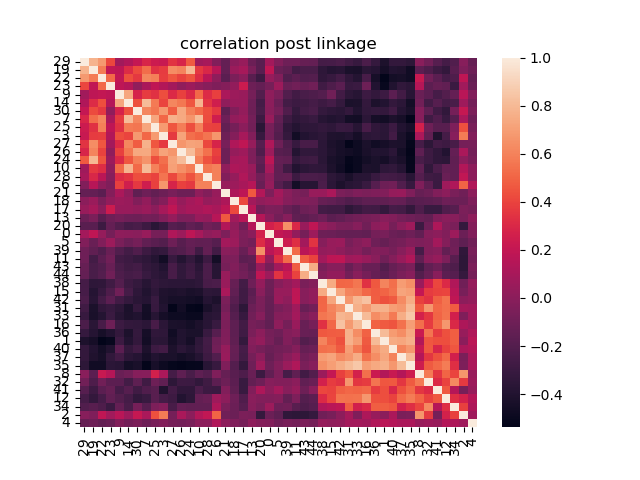

In [333]:
mpg_pca_pl_df = mpg_pca_df.reindex(columns = linkage_cluster_order)
plt.figure()
ax = sns.heatmap(mpg_pca_pl_df.corr(method='pearson'), yticklabels=True, xticklabels=True)
plt.title('correlation post linkage')
plt.savefig(folder + 'mpg_pca_corr_post_linkage')
plt.show()

In [77]:
Vglut1_df_s = Vglut1_df.reindex(columns = Vglut1_df_post_linkage.columns)

In [78]:
Vglut1_df_post_linkage_intra_sorted, Vglut1_meta_data_df_plis, cluster_indices = dp.intra_cluster_sort(Vglut1_df_s, 
                                                                                              Vglut1_meta_data_df_post_linkage, 
                                                                                              linkage_cluster_order)

In [79]:
Vglut1_marker_genes_sorted, pos, ind, ind_s, mgs = dp.compute_marker_genes(Vglut1_df_post_linkage_intra_sorted,
                                                Vglut1_meta_data_df_plis,
                                                cluster_indices,
                                                linkage_cluster_order,
                                                n_markers=5)

/home/isaac/analysis/scRNA-seq/dimorph_processing.py:709: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0_ind_arr = np.column_stack((xi0_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:714: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0p5_ind_arr = np.column_stack((xi0p5_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0p5_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:719: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is

len marker_genes_sorted_final 167


In [80]:
Vglut1_df_marker = Vglut1_df_post_linkage_intra_sorted.loc[Vglut1_marker_genes_sorted,:]
Vglut1_marker_log_and_std_arr, status_df = dp.log_and_standerdize_df(Vglut1_df_marker,status_df, log = False)
Vglut1_df_marker_log_and_std = pd.DataFrame(index = Vglut1_df_marker.index, 
                                          columns=Vglut1_df_post_linkage_intra_sorted.columns, 
                                          data = Vglut1_marker_log_and_std_arr.T)
Vglut1_df_marker_log_and_std_col = pd.DataFrame(data = Vglut1_df_marker_log_and_std.to_numpy(), 
                                         index = Vglut1_df_marker_log_and_std.index,
                                        columns = list(Vglut1_meta_data_df_plis.loc['cluster_label',:]))
change_indices = dp.get_heatmap_cluster_borders(Vglut1_meta_data_df_plis)
tg, tgfs = dp.get_heatmap_labels(mgs, ind, ind_s)

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 31, 463, 516, 1219, 1462, 1596, 1613, 2344, 2377, 3327, 3353, 3430, 3491, 3734, 3742, 4111, 4132, 4191, 4735, 5164, 5490, 5564, 5745, 5924, 6154, 6906, 6926, 6971, 7078, 7102, 7136, 7196, 7465, 7481, 9436, 9450, 9473, 9525, 9696, 9786, 9835, 9922, 9947, 10052]


In [338]:
folder = '/bigdata/isaac/Vglut1_files/'
folder

'/bigdata/isaac/Vglut1_files/'

In [84]:
## save final marker df, associated meta data to file. 
folder = '/bigdata/isaac/Vglut1_files/'
file1 = 'Vglut1_df_marker_' + today
file2 = 'Vglut1_meta_data_df_plis' + today


Vglut1_df_marker.to_feather(folder+file1+'.feather')
Vglut1_meta_data_df_plis.to_json(folder+file2+'.json')

#also save dict with clusters and markers for each clusters
file3 = 'Vglut1_cl_mg_dict' + today

#need to convert linkage cluster order to int (from int32) in order to store/write out dict
lco_int = [int(x) for x in linkage_cluster_order]
#store in dict
Vglut1_cl_mg_dict = dict(map(lambda i,j : (i,j) , lco_int,tg))

#write dict to file
with open(folder+file3+'.json', "w") as outfile: 
    json.dump(Vglut1_cl_mg_dict, outfile)

<IPython.core.display.Javascript object>


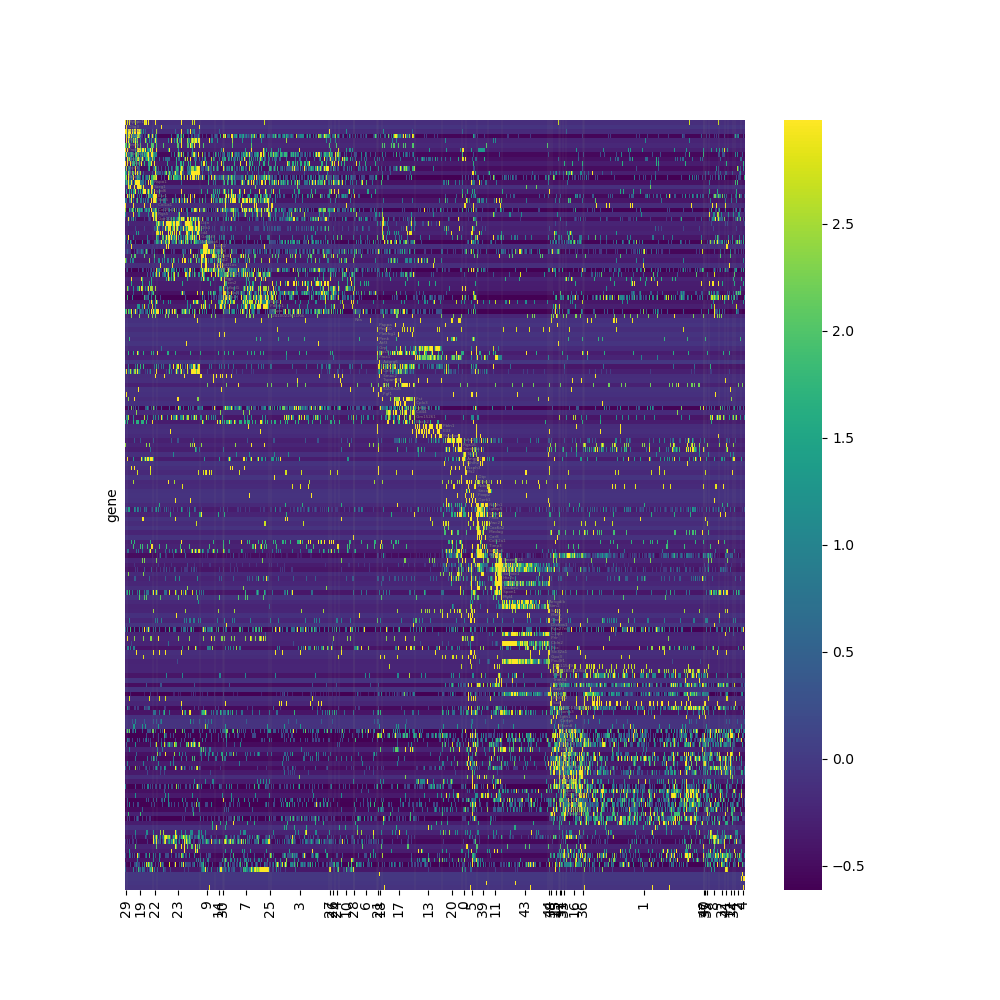

In [339]:
dp.plot_marker_heatmap(Vglut1_df_marker_log_and_std_col, 
                       pos, 
                       linkage_cluster_order, 
                       change_indices, 
                       tg, 
                       tgfs, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       savefig = True,
                       cell_class = 'Vglut1')

In [267]:
Vglut1_marker_genes_sorted

['Mybpc1',
 'Olig3',
 'Fibcd1',
 'Cd24a',
 'Mirt1',
 'Grem1',
 'Prokr2',
 'Pde11a',
 'Cxcl12',
 'Pla2g7',
 'Vgll3',
 'Meis2',
 'Tanc1',
 'Rspo1',
 'Scrg1',
 'Lypd6',
 'Esr1',
 'Sox5',
 'Col1a1',
 'Col25a1',
 'Rgs5',
 'Gpr101',
 'Dcn',
 'Dlk1',
 'Id4',
 'Galnt9',
 'Arhgap6',
 'Llgl2',
 'Bdnf',
 'Igfbp4',
 'C1ql2',
 'Abhd11os',
 'Pcdh11x',
 'Col6a1',
 'Mgp',
 'Ecm2',
 'Igfbpl1',
 'Slc1a3',
 'Npy2r',
 'Stc1',
 'Pdlim1',
 'Rspo3',
 '2410022M11Rik',
 'Nts',
 'Pappa',
 'Peg10',
 'Plekhg1',
 'Penk',
 'Atf3',
 'Grp',
 'Eps8',
 'Prox1',
 'Adgrg6',
 'Cpne2',
 'Calb2',
 'Smoc2',
 'Tspan18',
 'Kit',
 'S100a16',
 'Fgf1',
 'Fst',
 'Cplx3',
 'Igfbp3',
 'Cd44',
 'Gm15261',
 'Bace2',
 'Fbln1',
 'Il33',
 'Prox1os',
 'Tshz2',
 'Rgs16',
 'Sema5a',
 'Tac1',
 'Angpt1',
 'Nhlh2',
 'Nxph3',
 'Mt2',
 'Otp',
 'Olfm3',
 'Ndst4',
 'Snca',
 'Foxp2',
 'Oprk1',
 'Nxph1',
 'Igfbp5',
 'Sorcs1',
 'Pnoc',
 'Vwc2',
 'Cox6a2',
 'Medag',
 'Car8',
 'Col12a1',
 'Timp3',
 'Stxbp6',
 'Ntng1',
 'Tmem215',
 'Rph3a',
 'Ptn',
 'So

In [340]:
for c,g in zip(linkage_cluster_order,tg):
    print (c,g)

29 ['Mybpc1', 'Olig3', 'Fibcd1', 'Cd24a', 'Mirt1', 'Grem1', 'Prokr2', 'Pde11a', 'Cxcl12', 'Pla2g7', 'Vgll3', 'Meis2', 'Tanc1']
19 ['Rspo1', 'Scrg1', 'Lypd6']
22 ['Esr1', 'Sox5', 'Col1a1', 'Col25a1', 'Rgs5', 'Gpr101']
23 ['Dcn', 'Dlk1', 'Id4', 'Galnt9', 'Arhgap6']
9 ['Llgl2', 'Bdnf', 'Igfbp4', 'C1ql2', 'Abhd11os', 'Pcdh11x']
14 ['Col6a1', 'Mgp']
30 ['Ecm2', 'Igfbpl1', 'Slc1a3', 'Npy2r']
7 ['Stc1', 'Pdlim1']
25 ['Rspo3', '2410022M11Rik']
3 []
27 []
26 []
24 []
10 []
28 ['Nts']
6 []
21 ['Pappa', 'Peg10', 'Plekhg1', 'Penk', 'Atf3', 'Grp', 'Eps8', 'Prox1']
18 ['Adgrg6', 'Cpne2', 'Calb2', 'Smoc2', 'Tspan18', 'Kit', 'S100a16', 'Fgf1']
17 ['Fst', 'Cplx3', 'Igfbp3', 'Cd44', 'Gm15261', 'Bace2']
13 ['Fbln1', 'Il33', 'Prox1os']
20 ['Tshz2', 'Rgs16', 'Sema5a']
0 ['Tac1', 'Angpt1', 'Nhlh2', 'Nxph3', 'Mt2']
5 ['Otp', 'Olfm3', 'Ndst4', 'Snca', 'Foxp2', 'Oprk1']
39 ['Nxph1', 'Igfbp5', 'Sorcs1', 'Pnoc', 'Vwc2', 'Cox6a2', 'Medag', 'Car8', 'Col12a1', 'Timp3', 'Stxbp6', 'Ntng1']
11 ['Tmem215', 'Rph3a', 'Pt

Analysis for Vglut1 (Slc17a7) Markers in Clusters (using ChatGPT)

Cluster 39

    Genes: ['Pou3f1', 'C1ql1', 'Cbln2', 'Arhgdib', 'Sim1', 'Rprm']
    No known association with Vglut1 markers.

Cluster 38

    Genes: ['Rmst', 'Spon1', 'Tmem215', 'Igfbp6', 'Ptn', 'Serpini1', 'Neurod6', 'Htr2c', 'Sostdc1', 'Cyp26b1', 'Scube1', 'Myl4', 'Krt12']
    Neurod6: Known to be expressed in glutamatergic neurons.
    Potential association with Vglut1 markers.

Cluster 36

    Genes: ['Rims3', 'Ntng1', 'Timp3', 'Stxbp6', 'Vwc2', 'Cox6a2', 'Nxph1', 'Igfbp5', 'Pnoc', 'Sorcs1', 'Car8']
    Ntng1: Associated with excitatory synapses.
    Potential association with Vglut1 markers.

Cluster 5

    Genes: ['Ifit1', 'Oasl2', 'Usp18', 'Ifi44', 'Isg15']
    No known association with Vglut1 markers.

Cluster 14

    Genes: []
    Empty cluster.

Cluster 11

    Genes: ['Rab3b', 'Plk5', 'Nppc', 'Gpr88', '9330185C12Rik']
    No known association with Vglut1 markers.

Cluster 34

    Genes: ['BC048546', 'Reln']
    Reln: Known to be expressed in glutamatergic neurons.
    Potential association with Vglut1 markers.

Cluster 8

    Genes: ['Lpl', 'Arhgef40']
    No known association with Vglut1 markers.

Cluster 33

    Genes: ['Ecel1', 'Dpp10', 'Nov', 'Snhg6', 'Fam19a1', 'Trh', 'Cdkn1c']
    No known association with Vglut1 markers.

Cluster 18

    Genes: ['Col23a1', 'Rxfp1', 'Pam', 'Smoc1']
    No known association with Vglut1 markers.

Cluster 35

    Genes: ['Svil', 'Cryab', 'Moxd1', 'Ptprt', 'Trp53i11']
    No known association with Vglut1 markers.

Cluster 37

    Genes: ['Rcn1', 'Rnf152']
    No known association with Vglut1 markers.

Cluster 16

    Genes: ['Ptgs2', 'A830036E02Rik', 'Cartpt', 'Egr4', 'Arc', 'Nr4a1', 'Fos', 'Dusp1']
    Arc: Associated with excitatory synapses.
    Potential association with Vglut1 markers.

Cluster 24

    Genes: ['Mirt1', 'Nr4a2']
    Nr4a2: Known to be expressed in glutamatergic neurons.
    Potential association with Vglut1 markers.

Cluster 25

    Genes: ['Prlr', 'Sv2c', 'Otp', 'Foxp2', 'Gpx3', 'Penk', 'Slc32a1', 'Baiap3']
    No known association with Vglut1 markers.

Cluster 1

    Genes: ['Mt2', 'Angpt1', 'Cxcl12', 'Tac1', 'Nxph3']
    No known association with Vglut1 markers.

Cluster 23

    Genes: ['Tshz2', 'Sema5a']
    No known association with Vglut1 markers.

Cluster 21

    Genes: ['Satb2', 'Snca', 'Olfm3', 'Oprk1', 'Mpped1']
    Satb2: Known to be expressed in glutamatergic neurons.
    Potential association with Vglut1 markers.

Cluster 13

    Genes: ['Ndst4']
    No known association with Vglut1 markers.

Cluster 20

    Genes: ['Trps1', 'Cpne2', 'Tspan18', 'Homer3', 'S100a16', 'Calb2', 'Fgf1', 'Adgrg6']
    No known association with Vglut1 markers.

Cluster 3

    Genes: []
    Empty cluster.

Cluster 2

    Genes: ['Tspan15', 'Cntn5']
    No known association with Vglut1 markers.

Cluster 6

    Genes: []
    Empty cluster.

Cluster 17

    Genes: ['Pycr2', 'Tsix']
    No known association with Vglut1 markers.

Cluster 15

    Genes: ['Fbln1', 'Il33', 'Grp', 'Prox1', 'Rasl10a', 'Prox1os']
    No known association with Vglut1 markers.

Cluster 19

    Genes: ['Cplx3', 'Fst', 'Cd44', 'Eps8', 'Gm15261']
    No known association with Vglut1 markers.

Cluster 12

    Genes: ['Ppm1n', 'Fosb', 'Milr1', 'Gm26802']
    No known association with Vglut1 markers.

Cluster 0

    Genes: ['Dcn', 'Dlk1', 'Id4', 'Galnt9', 'Arhgap6', 'Meis2', 'Alcam']
    No known association with Vglut1 markers.

Cluster 22

    Genes: ['Rgs5', 'Col1a1', 'Esr1', 'Tanc1', 'Gpr101']
    No known association with Vglut1 markers.

Cluster 32

    Genes: ['Cd24a', 'Sox5', 'Zmat4', 'Stc1', 'Igfbpl1', 'Pdlim1', 'Gm29666', 'Col6a1', 'Col25a1', 'mt-Nd6', 'Npy2r']
    No known association with Vglut1 markers.

Cluster 4

    Genes: []
    Empty cluster.

Cluster 10

    Genes: []
    Empty cluster.

Cluster 7

    Genes: ['Fibcd1']
    No known association with Vglut1 markers.

Cluster 29

    Genes: ['Rspo1']
    No known association with Vglut1 markers.

Cluster 30

    Genes: ['Ecm2', 'Vgll3', 'Slc1a3', 'Pde11a', 'Col12a1']
    Slc1a3: Known to be expressed in glutamatergic neurons.
    Potential association with Vglut1 markers.

Summary

Clusters with potential Vglut1 markers:

    38, 36, 34, 16, 24, 21, 30

In [117]:
Vglut1_ids_filtered = np.sort([38, 36, 34, 16, 24, 21, 30])
Vglut1_arr_sorted = Vglut1_arr.sort_values(by = 'labels')
Vglut1_arr_filtered = Vglut1_arr_sorted.copy()
Vglut1_arr_filtered = Vglut1_arr_filtered[Vglut1_arr_filtered['labels'].isin(Vglut1_ids_filtered)]
Vglut1_meta_data_df_filtered = Vglut1_meta_data_df.iloc[:,Vglut1_arr_filtered.index]
Vglut1_df_ls_filtered = Vglut1_df_ls.iloc[:,Vglut1_arr_filtered.index]

<IPython.core.display.Javascript object>


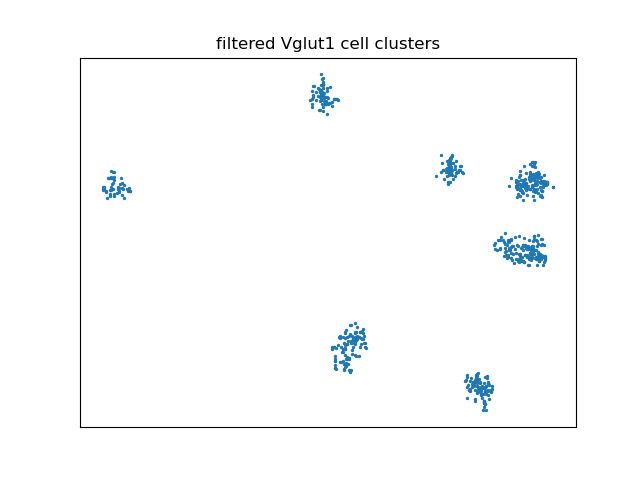

In [118]:
ax, fig = plt.subplots()
fig.scatter(Vglut1_arr_filtered['tsne-1'], Vglut1_arr_filtered['tsne-2'], s = 2)
plt.xticks([])
plt.yticks([])
plt.title('filtered Vglut1 cell clusters')
plt.show()

## Vglut2 Analysis <a name="vglut2_analysis"></a>

num m cells: 4058 num f cells: 5748


<IPython.core.display.Javascript object>


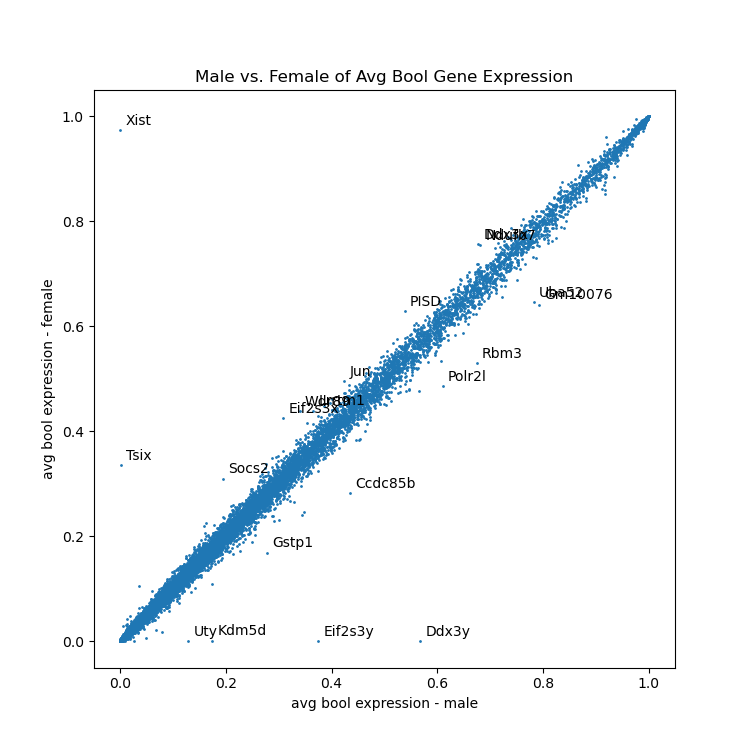

Total genes reduced from 27933 to 14090
removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


<IPython.core.display.Javascript object>


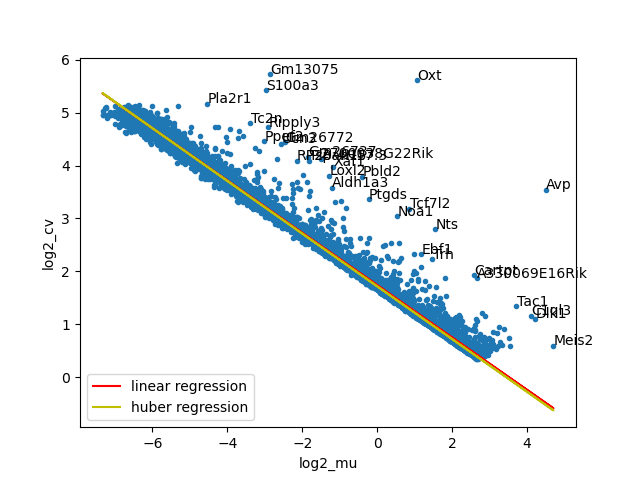

<IPython.core.display.Javascript object>


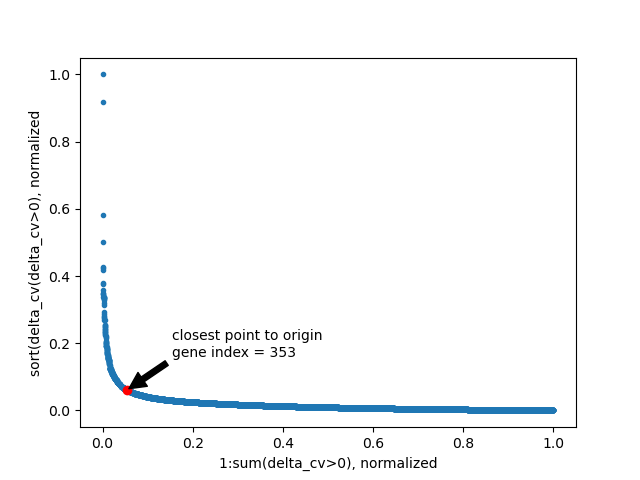

In [85]:

Vglut2_meta_data_df = meta_data_df.loc[:,meta_data_df.loc['cell_class',:] == 'Vglut2']
Vglut2_df = df.loc[:,meta_data_df.loc['cell_class',:] == 'Vglut2']
Vglut2_df_bool = Vglut2_df.mask(Vglut2_df>0, other = 1)
Vglut2_avg_bool_mf_df_sorted = dp.avg_bool_gene_expression_by_sex(df_bool = Vglut2_df_bool,
                                                              meta_data_df=Vglut2_meta_data_df,
                                                             num_top_genes=10,
                                                             plot_flag=1)
status_df = dp.intialize_status_df()
status_df.loc['cell_exclusion (l1)',:] = True
Vglut2_df_ge, Vglut2_df_bool, Vglut2_meta_data_df, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                      percent_cell_upper_bound=50,
                                                     df_bool=Vglut2_df_bool,
                                                     df = Vglut2_df,
                                                     meta_data_df = Vglut2_meta_data_df,
                                                     status_df = status_df)
#remove IEG genes
Vglut2_df_ge = dp.gene_remover(IEG_list,Vglut2_df_ge)
                        
Vglut2_cv_df = dp.analyze_cv(df = Vglut2_df_ge,
                      norm_scale_factor=20000,
                      num_top_genes=30,
                      plot_flag=1,
                     use_huber = True)

Vglut2_gene_index, Vglut2_df, status_df = dp.get_top_cv_genes(df = Vglut2_df_ge, cv_df=Vglut2_cv_df, plot_flag=1, status_df=status_df)

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


<IPython.core.display.Javascript object>


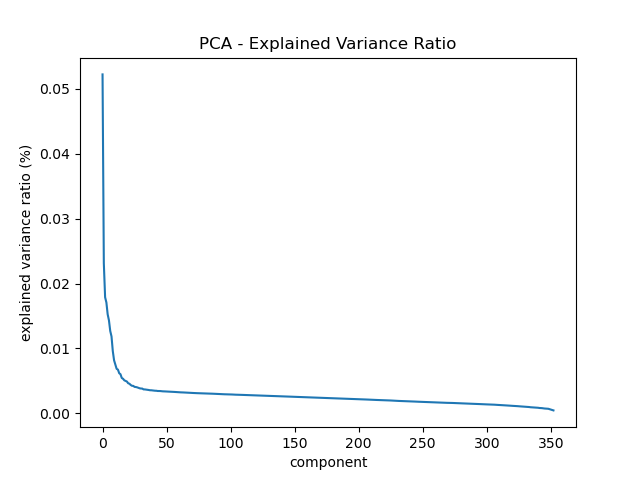

<IPython.core.display.Javascript object>


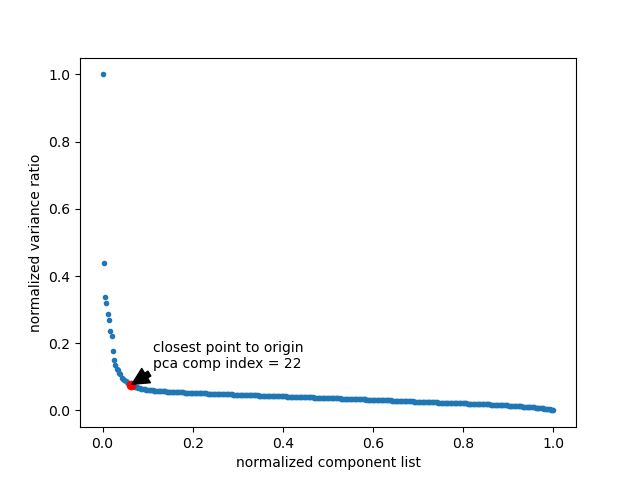

<IPython.core.display.Javascript object>


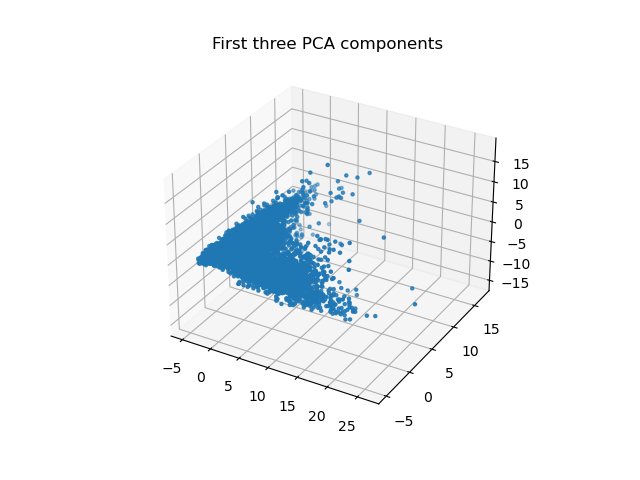

2024-06-06 09:58:00,175 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-06-06 09:58:01,100 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-06-06 09:58:01,135 - harmonypy - INFO - Iteration 1 of 10
2024-06-06 09:58:03,099 - harmonypy - INFO - Iteration 2 of 10
2024-06-06 09:58:05,051 - harmonypy - INFO - Iteration 3 of 10
2024-06-06 09:58:07,015 - harmonypy - INFO - Iteration 4 of 10
2024-06-06 09:58:08,621 - harmonypy - INFO - Iteration 5 of 10
2024-06-06 09:58:09,714 - harmonypy - INFO - Iteration 6 of 10
2024-06-06 09:58:10,795 - harmonypy - INFO - Iteration 7 of 10
2024-06-06 09:58:12,771 - harmonypy - INFO - Iteration 8 of 10
2024-06-06 09:58:14,034 - harmonypy - INFO - Iteration 9 of 10
2024-06-06 09:58:14,772 - harmonypy - INFO - Iteration 10 of 10
2024-06-06 09:58:15,501 - harmonypy - INFO - Stopped before convergence


<IPython.core.display.Javascript object>


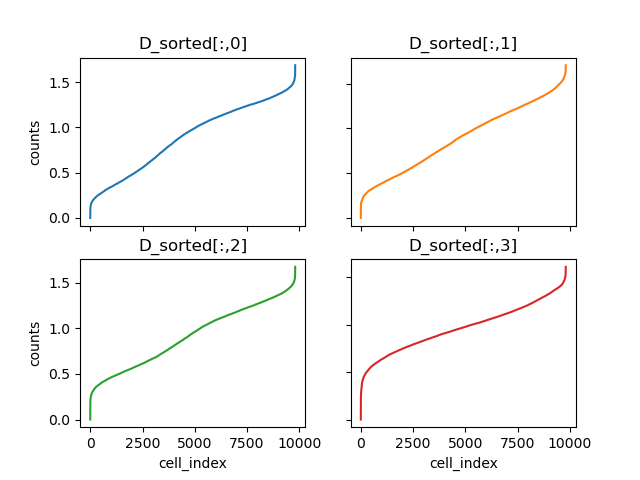

<IPython.core.display.Javascript object>


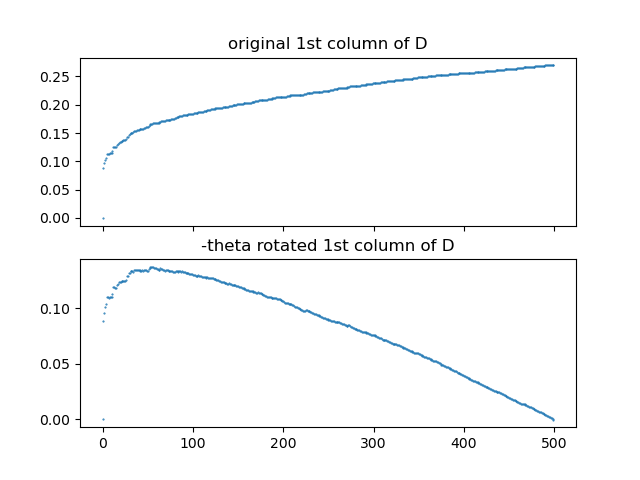

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 53.0


<IPython.core.display.Javascript object>


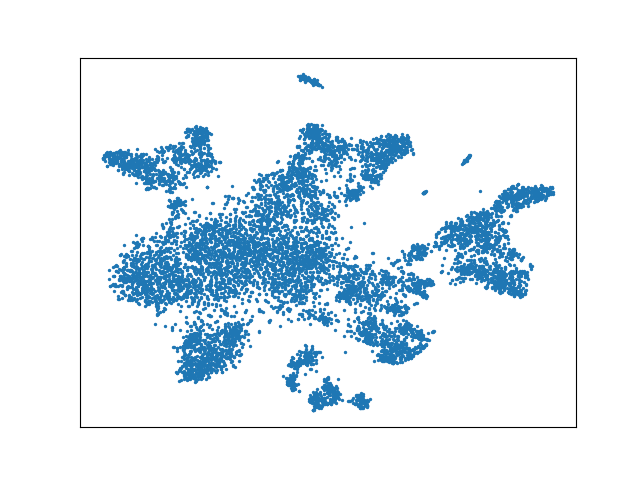

In [270]:
Vglut2_log_std_arr,status_df = dp.log_and_standerdize_df(Vglut2_df,status_df)
Vglut2_df_ls = pd.DataFrame(data = Vglut2_log_std_arr.T, index = Vglut2_df.index, columns=Vglut2_df.columns)

Vglut2_pca_index, Vglut2_arr_pca, status_df = dp.analyze_pca(arr = Vglut2_log_std_arr, #log_std_arr
                                               n_components=Vglut2_log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

Vglut2_meta_data_df_pca = Vglut2_meta_data_df.T.copy()

vars_use = ['SampleID']
ho = hm.run_harmony(Vglut2_arr_pca,Vglut2_meta_data_df_pca,vars_use)
Vglut2_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = Vglut2_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

Vglut2_arr_tsne,status_df = dp.do_tsne(arr = Vglut2_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

params for dbscan
minpts:  20
epsilon percentile 50
epsilon:  1.285569768729098

running dbscan with epsilon: 1.285569768729098  and minpts: 20
Estimated number of clusters: 53
Estimated number of noise points: 1844


<IPython.core.display.Javascript object>


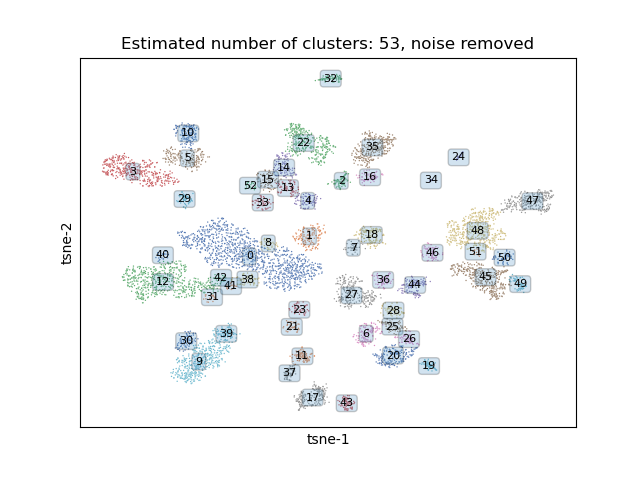

params for dbscan
minpts:  20
epsilon percentile 55
epsilon:  1.3261052742477621

running dbscan with epsilon: 1.3261052742477621  and minpts: 20
Estimated number of clusters: 46
Estimated number of noise points: 1505


<IPython.core.display.Javascript object>


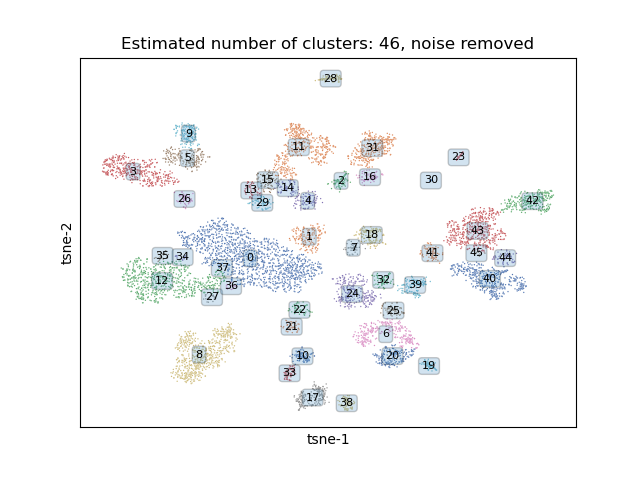

params for dbscan
minpts:  20
epsilon percentile 60
epsilon:  1.3719203591135822

running dbscan with epsilon: 1.3719203591135822  and minpts: 20
Estimated number of clusters: 37
Estimated number of noise points: 1248


<IPython.core.display.Javascript object>


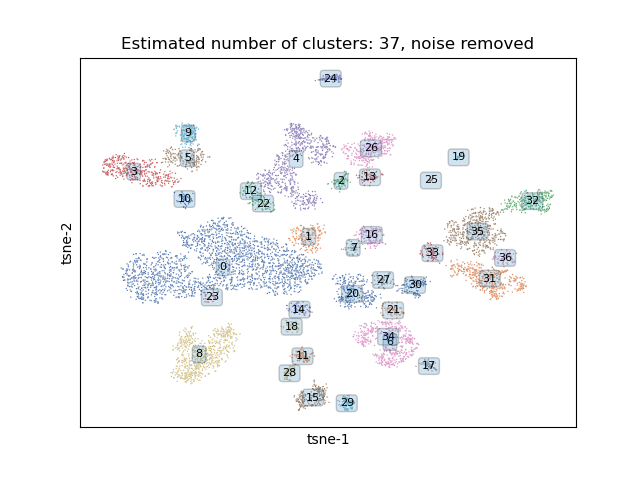

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.4229314054948932

running dbscan with epsilon: 1.4229314054948932  and minpts: 20
Estimated number of clusters: 32
Estimated number of noise points: 1020


<IPython.core.display.Javascript object>


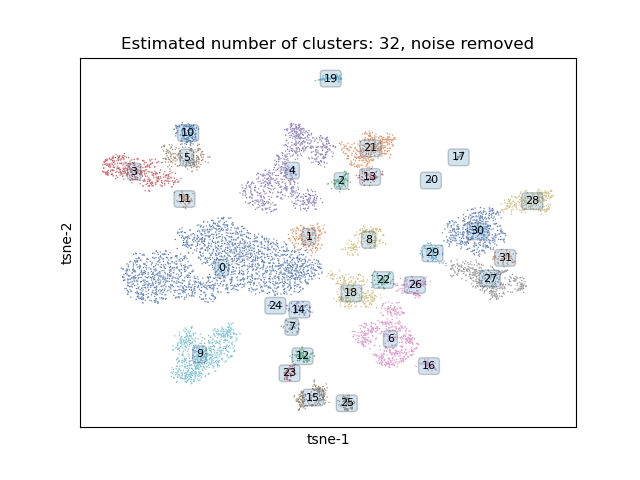

params for dbscan
minpts:  20
epsilon percentile 70
epsilon:  1.473635174025769

running dbscan with epsilon: 1.473635174025769  and minpts: 20
Estimated number of clusters: 30
Estimated number of noise points: 808


<IPython.core.display.Javascript object>


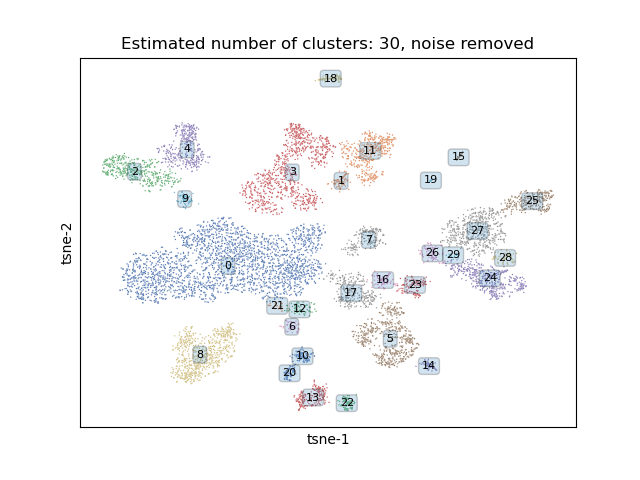

params for dbscan
minpts:  20
epsilon percentile 75
epsilon:  1.5448221147279013

running dbscan with epsilon: 1.5448221147279013  and minpts: 20
Estimated number of clusters: 29
Estimated number of noise points: 587


<IPython.core.display.Javascript object>


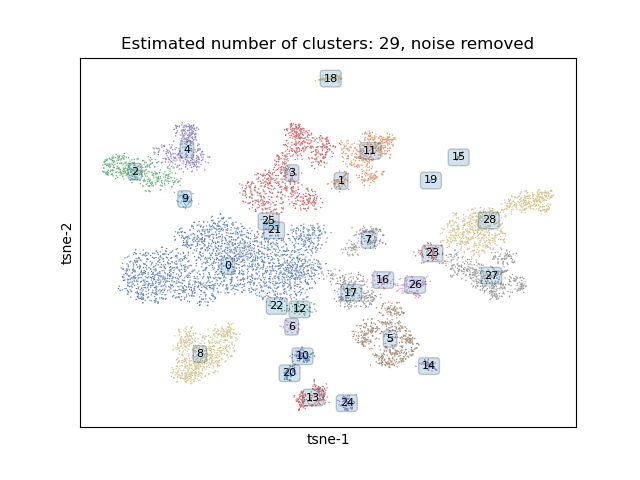

In [121]:
for e in range(50,80,5):
    epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=e, arr= Vglut2_arr_tsne, status_df = status_df)
    labels,n_clusters, arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = Vglut2_arr_tsne, status_df = status_df)

In [126]:
############################## OPTIMAL EPS_PRC VALUE FROM PLOTS ABOVE? ################# [RESUME HERE]

params for dbscan
minpts:  20
epsilon percentile 70
epsilon:  1.4964355350489675

running dbscan with epsilon: 1.4964355350489675  and minpts: 20
Estimated number of clusters: 26
Estimated number of noise points: 830


<IPython.core.display.Javascript object>


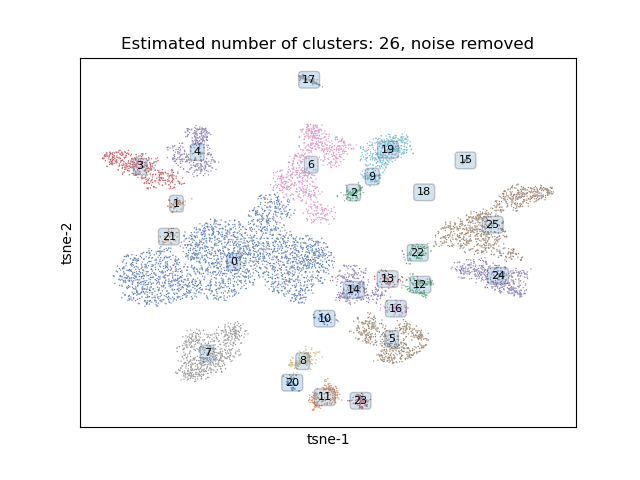

In [271]:
epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=70, arr= Vglut2_arr_tsne, status_df = status_df)
Vglut2_labels,n_clusters, Vglut2_arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = Vglut2_arr_tsne, status_df = status_df)

In [276]:
Vglut2_df_pre_linkage_ls, Vglut2_meta_data_df_pre_linkage, Vglut2_unique_labels = dp.sort_by_cluster_label(Vglut2_df_ls,
                                                                               Vglut2_meta_data_df,
                                                                               Vglut2_arr,
                                                                               Vglut2_labels)

In [274]:
today

'2024-06-06'

In [86]:
## CHECKPOINT - SAVE FILES
folder = '/bigdata/isaac/Vglut2_files/'
file1 = 'Vglut2_df_pre_linkage_ls_' + today
file2 = 'Vglut2_meta_data_df_pre_linkage_' + today
file3 = 'Vglut2_unique_labels_' + today 



#Vglut2_df_pre_linkage_ls.to_feather(folder+file1+'.feather')
#Vglut2_meta_data_df_pre_linkage.to_json(folder+file2+'.json')
#np.save(folder+file3 +'.npy', Vglut2_unique_labels)

Vglut2_df_pre_linkage_ls = pd.read_feather(folder + 'Vglut2_df_pre_linkage_ls_2024-06-06.feather')
Vglut2_meta_data_df_pre_linkage = pd.read_json(folder + 'Vglut2_meta_data_df_pre_linkage_2024-06-06.json')
Vglut2_unique_labels = np.load(folder+'Vglut2_unique_labels_2024-06-06.npy')

In [87]:
linkage_alg = 'ward'
dist_metric = 'euclidean'

<IPython.core.display.Javascript object>


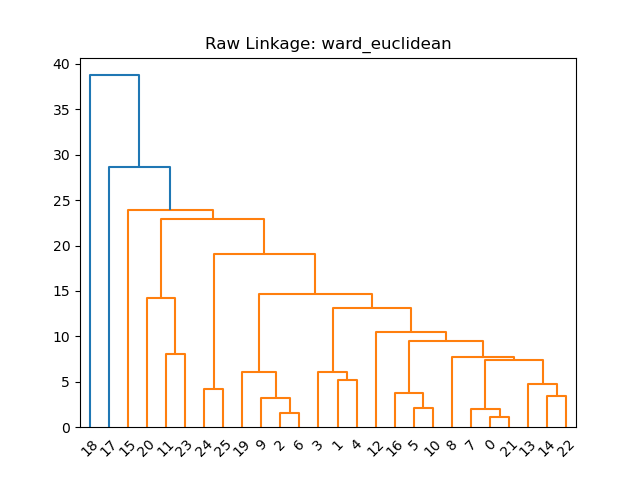

[18 15 25 24 12 16  5 10  7  0 21 13 14 22  8  1  4  3  6  2  9 19 20 23
 11 17]


<IPython.core.display.Javascript object>


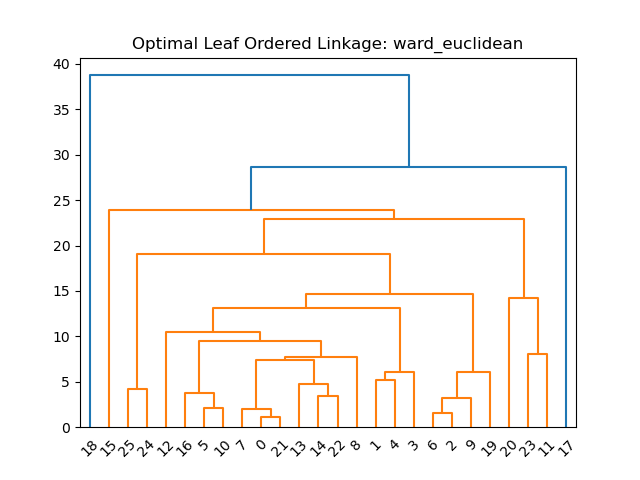

In [88]:
Vglut2_df_post_linkage, Vglut2_meta_data_df_post_linkage, linkage_cluster_order, Z_ordered, mpg_pca, linkage_cluster_order_po = dp.inter_cluster_sort(Vglut2_df_pre_linkage_ls,
                                                 Vglut2_meta_data_df_pre_linkage, 
                                                 Vglut2_unique_labels,
                                                 n_components = 10, 
                                                 linkage_alg = linkage_alg,
                                                 dist_metric = dist_metric)

<IPython.core.display.Javascript object>


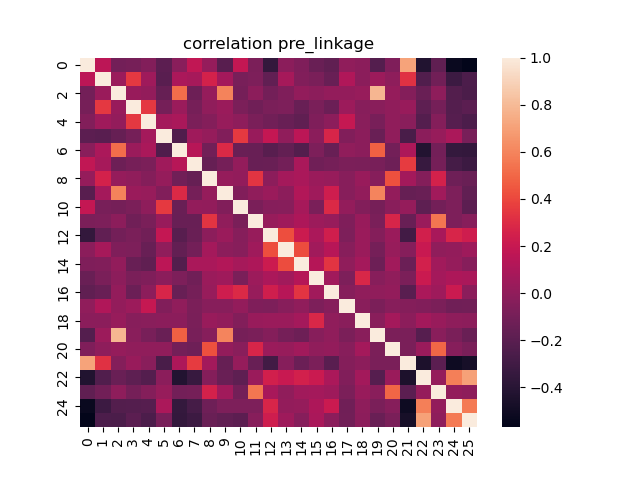

In [316]:
mpg_pca_df = pd.DataFrame(data = mpg_pca)
plt.figure()
ax = sns.heatmap(mpg_pca_df.corr(method='pearson'))
plt.title('correlation pre_linkage')
plt.show()

<IPython.core.display.Javascript object>


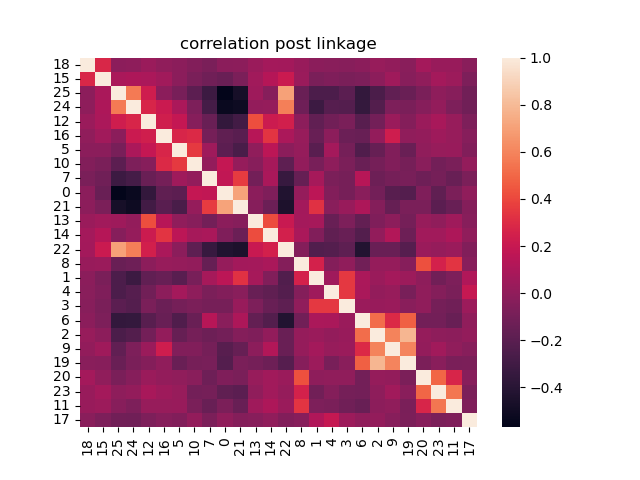

In [317]:
mpg_pca_pl_df = mpg_pca_df.reindex(columns = linkage_cluster_order)
plt.figure()
ax = sns.heatmap(mpg_pca_pl_df.corr(method='pearson'), yticklabels=True, xticklabels=True)
plt.title('correlation post linkage')
plt.savefig(folder + 'mpg_pca_corr_post_linkage')
plt.show()

In [89]:
Vglut2_df_s = Vglut2_df.reindex(columns = Vglut2_df_post_linkage.columns)

In [90]:
Vglut2_df_post_linkage_intra_sorted, Vglut2_meta_data_df_plis, cluster_indices = dp.intra_cluster_sort(Vglut2_df_s, 
                                                                                              Vglut2_meta_data_df_post_linkage, 
                                                                                              linkage_cluster_order)

In [320]:
Vglut2_marker_genes_sorted, pos, ind, ind_s, mgs = dp.compute_marker_genes(Vglut2_df_post_linkage_intra_sorted,
                                                Vglut2_meta_data_df_plis,
                                                cluster_indices,
                                                linkage_cluster_order,
                                                n_markers=5)

/home/isaac/analysis/scRNA-seq/dimorph_processing.py:708: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0_ind_arr = np.column_stack((xi0_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:713: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0p5_ind_arr = np.column_stack((xi0p5_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0p5_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:718: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is

len marker_genes_sorted_final 123


In [321]:
Vglut2_df_marker = Vglut2_df_post_linkage_intra_sorted.loc[Vglut2_marker_genes_sorted,:]
Vglut2_marker_log_and_std_arr, status_df = dp.log_and_standerdize_df(Vglut2_df_marker,status_df, log = False)
Vglut2_df_marker_log_and_std = pd.DataFrame(index = Vglut2_df_marker.index, 
                                          columns=Vglut2_df_post_linkage_intra_sorted.columns, 
                                          data = Vglut2_marker_log_and_std_arr.T)
Vglut2_df_marker_log_and_std_col = pd.DataFrame(data = Vglut2_df_marker_log_and_std.to_numpy(), 
                                         index = Vglut2_df_marker_log_and_std.index,
                                        columns = list(Vglut2_meta_data_df_plis.loc['cluster_label',:]))
change_indices = dp.get_heatmap_cluster_borders(Vglut2_meta_data_df_plis)
tg, tgfs = dp.get_heatmap_labels(mgs, ind, ind_s)

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 20, 82, 981, 1439, 1575, 1657, 2212, 2262, 2919, 5640, 5682, 5759, 6058, 6162, 6309, 6372, 6748, 7199, 7984, 8073, 8149, 8498, 8566, 8663, 8869]


In [322]:
folder

'/bigdata/isaac/Vglut2_files/'

<IPython.core.display.Javascript object>


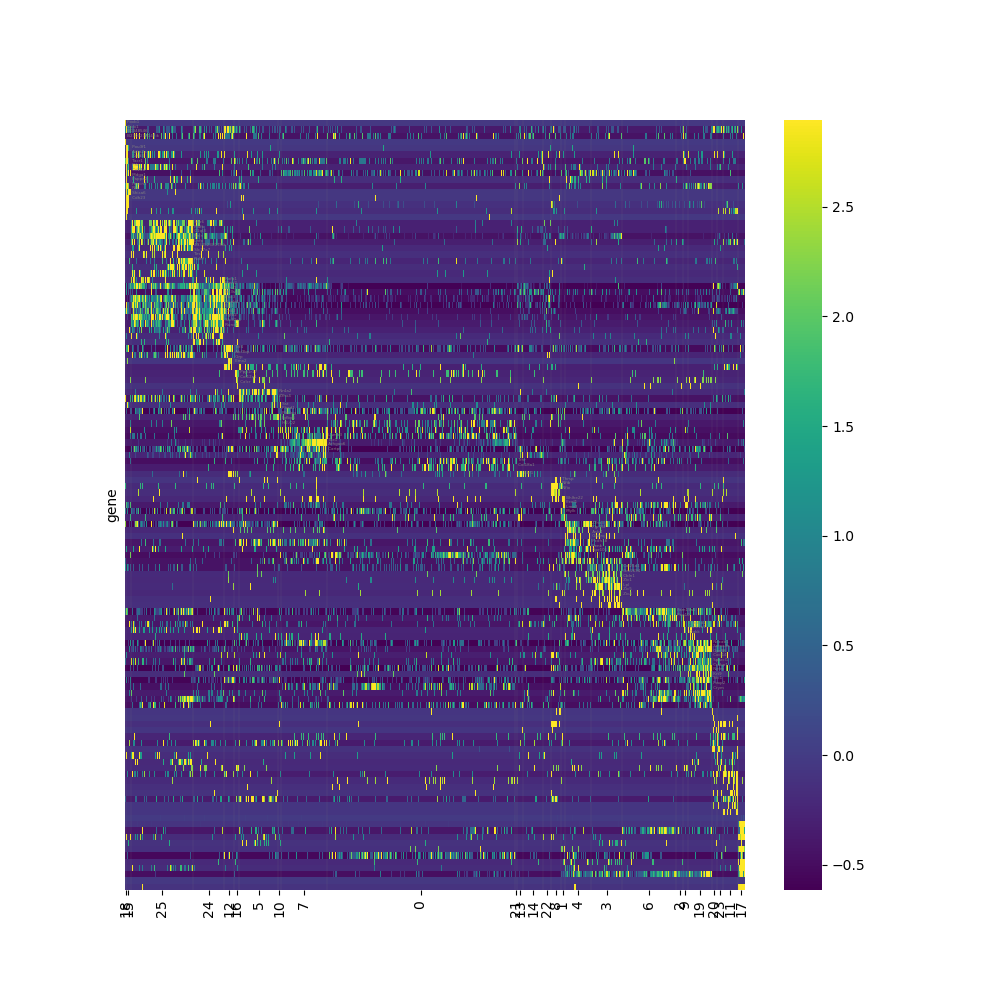

In [325]:
dp.plot_marker_heatmap(Vglut2_df_marker_log_and_std_col, 
                       pos, 
                       linkage_cluster_order, 
                       change_indices, 
                       tg, 
                       tgfs, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       savefig = True,
                       cell_class = 'Vglut2')

In [324]:
for c,g in zip(linkage_cluster_order,tg):
    print (c,g)

18 ['Foxb1', 'Cplx1', 'BC048546', 'B230323A14Rik']
15 ['Pou3f1', 'Adra2a', 'Kctd8', 'Tacr1', 'Prlr', 'Cd24a', 'Mdga1', 'Pappa2', 'Hmcn1', 'Nts', 'Shisa6', 'Cdh23']
25 ['Sox6', 'Mafb', 'C1ql3', 'Reln', 'Lhfp', '4930523C07Rik', 'Slc17a7', 'Tes', 'Ndnf']
24 ['Rxfp1', 'Meis2', 'Tshz1', 'Hs3st4', 'Pbx3', 'Nxph4', 'Etl4', 'Zeb2', 'Tgfb2', 'Slc32a1', 'Runx1']
12 ['Tcf4', 'Abi3bp', 'Grp', 'Emx2']
16 ['Ppp1r17', 'Col12a1', 'Calcr']
5 ['Nr4a2', 'Zfhx4']
10 ['Sst', 'Fhad1', 'Medag', 'Igfbp6', 'H2-Q2']
7 ['Lamb3', 'Tac1', 'Arhgap6', 'Cartpt']
0 []
21 ['Trhr', 'Col18a1']
13 ['Ebf1']
14 []
22 []
8 ['Thrsp', 'Nfib', 'Nfix']
1 ['Bhlhe22', 'Ecel1', 'Lmo3', 'Mylk']
4 ['Zfhx3', 'Pgr15l', 'Asb4', 'Gabrq', 'Pcdh18', 'Penk', 'Gpr101']
3 ['Col25a1', 'Gm2694', 'Cbln1', 'Zic1', 'Lpl', 'Zic5', 'Zic4']
6 ['Fam19a1', 'Peg10']
2 []
9 ['Mpped1', 'Col11a1', 'Dgkk']
19 ['Necab1', 'Sema3a', 'Gpr88', 'Cxcl14', 'Sparcl1', 'Crabp1', 'Nefm', 'Krt9', 'Stc1', 'Foxp2', 'Crym']


[Chat GPT analysis here]

In [117]:
Vglut2_ids_filtered = np.sort([38, 36, 34, 16, 24, 21, 30])
Vglut2_arr_sorted = Vglut2_arr.sort_values(by = 'labels')
Vglut2_arr_filtered = Vglut2_arr_sorted.copy()
Vglut2_arr_filtered = Vglut2_arr_filtered[Vglut2_arr_filtered['labels'].isin(Vglut2_ids_filtered)]
Vglut2_meta_data_df_filtered = Vglut2_meta_data_df.iloc[:,Vglut2_arr_filtered.index]
Vglut2_df_ls_filtered = Vglut2_df_ls.iloc[:,Vglut2_arr_filtered.index]

<IPython.core.display.Javascript object>


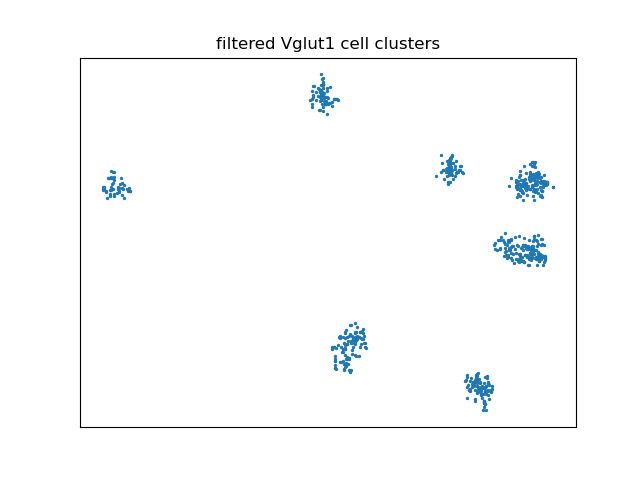

In [118]:
ax, fig = plt.subplots()
fig.scatter(Vglut2_arr_filtered['tsne-1'], Vglut2_arr_filtered['tsne-2'], s = 2)
plt.xticks([])
plt.yticks([])
plt.title('filtered Vglut2 cell clusters')
plt.show()

## Nonneuronal Analysis <a name="nn_analysis"></a>

num m cells: 1338 num f cells: 1658


<IPython.core.display.Javascript object>


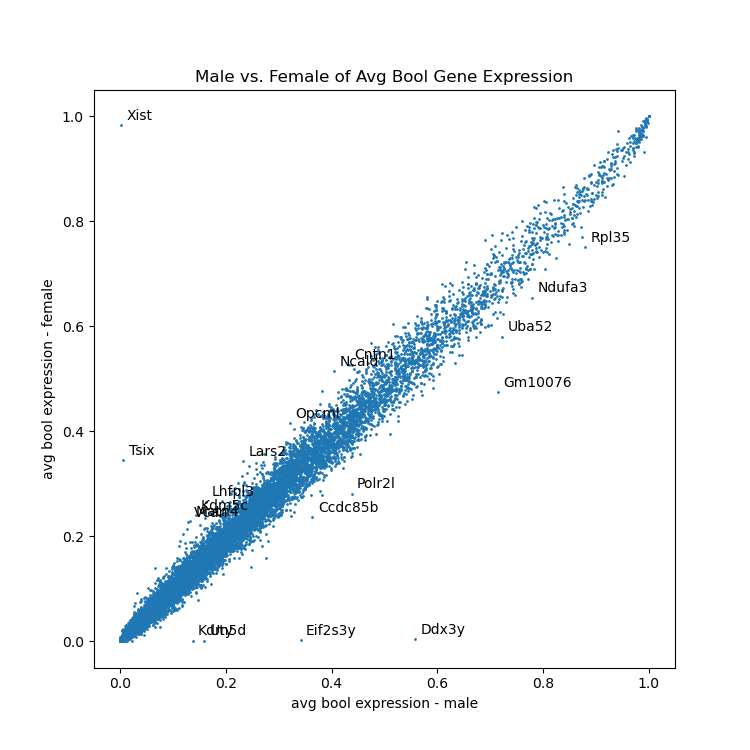

Total genes reduced from 27933 to 14505
removing  49  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


<IPython.core.display.Javascript object>


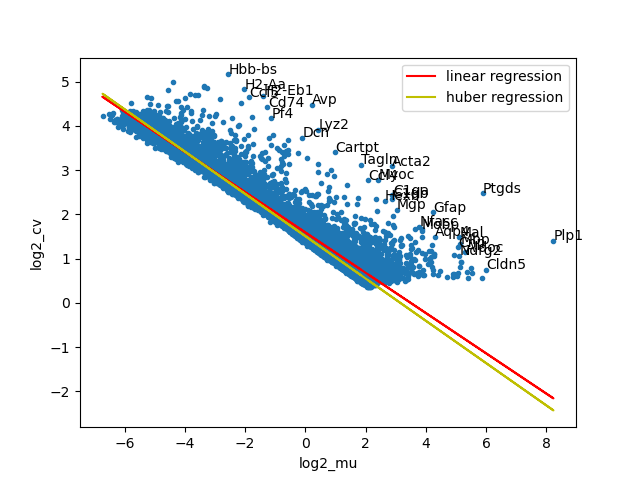

<IPython.core.display.Javascript object>


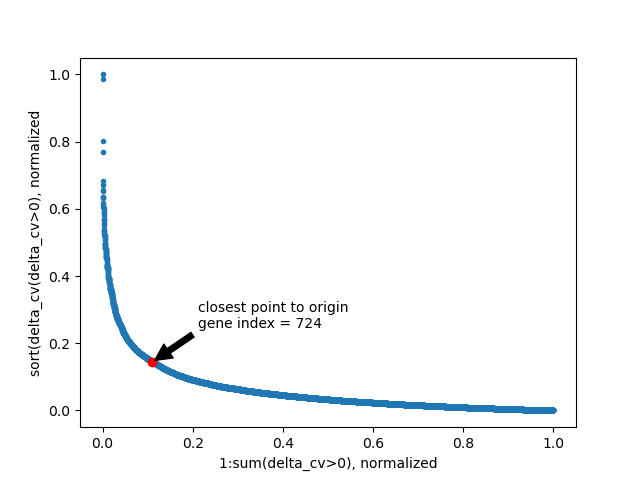

In [341]:

Nonneuronal_meta_data_df = meta_data_df.loc[:,meta_data_df.loc['cell_class',:] == 'Nonneuronal']
Nonneuronal_df = df.loc[:,meta_data_df.loc['cell_class',:] == 'Nonneuronal']
Nonneuronal_df_bool = Nonneuronal_df.mask(Nonneuronal_df>0, other = 1)
Nonneuronal_avg_bool_mf_df_sorted = dp.avg_bool_gene_expression_by_sex(df_bool = Nonneuronal_df_bool,
                                                              meta_data_df=Nonneuronal_meta_data_df,
                                                             num_top_genes=10,
                                                             plot_flag=1)
status_df = dp.intialize_status_df()
status_df.loc['cell_exclusion (l1)',:] = True
Nonneuronal_df_ge, Nonneuronal_df_bool, Nonneuronal_meta_data_df, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                      percent_cell_upper_bound=50,
                                                     df_bool=Nonneuronal_df_bool,
                                                     df = Nonneuronal_df,
                                                     meta_data_df = Nonneuronal_meta_data_df,
                                                     status_df = status_df)
#remove IEG genes
Nonneuronal_df_ge = dp.gene_remover(IEG_list,Nonneuronal_df_ge)
                        
Nonneuronal_cv_df = dp.analyze_cv(df = Nonneuronal_df_ge,
                      norm_scale_factor=20000,
                      num_top_genes=30,
                      plot_flag=1,
                     use_huber = True)

Nonneuronal_gene_index, Nonneuronal_df, status_df = dp.get_top_cv_genes(df = Nonneuronal_df_ge, cv_df=Nonneuronal_cv_df, plot_flag=1, status_df=status_df)

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


<IPython.core.display.Javascript object>


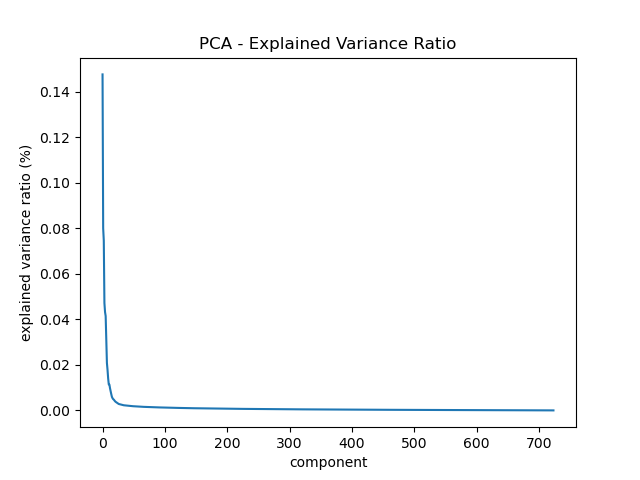

<IPython.core.display.Javascript object>


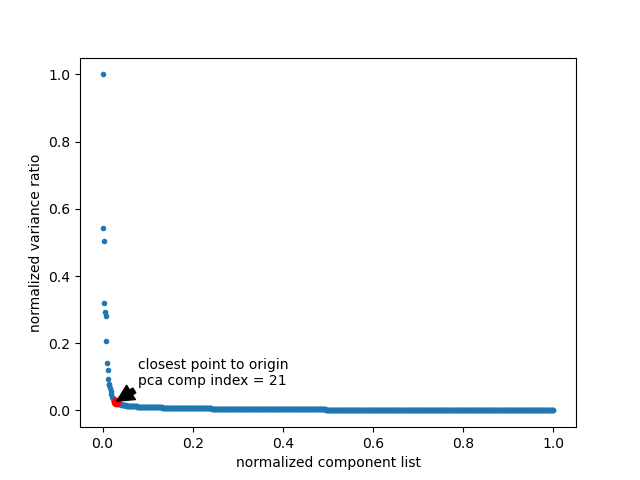

<IPython.core.display.Javascript object>


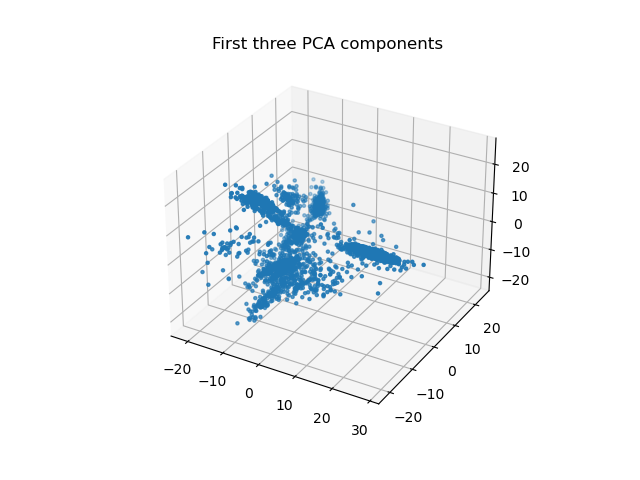

2024-06-06 11:02:45,452 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-06-06 11:02:45,941 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-06-06 11:02:45,950 - harmonypy - INFO - Iteration 1 of 10
2024-06-06 11:02:46,534 - harmonypy - INFO - Iteration 2 of 10
2024-06-06 11:02:47,115 - harmonypy - INFO - Iteration 3 of 10
2024-06-06 11:02:47,584 - harmonypy - INFO - Iteration 4 of 10
2024-06-06 11:02:48,261 - harmonypy - INFO - Iteration 5 of 10
2024-06-06 11:02:48,830 - harmonypy - INFO - Iteration 6 of 10
2024-06-06 11:02:49,552 - harmonypy - INFO - Iteration 7 of 10
2024-06-06 11:02:49,824 - harmonypy - INFO - Converged after 7 iterations


<IPython.core.display.Javascript object>


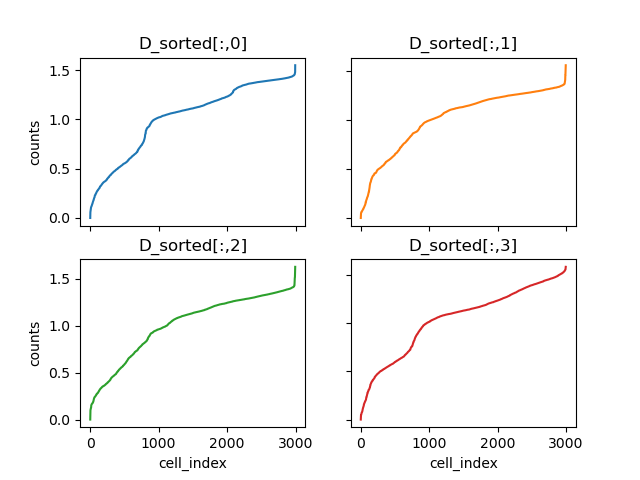

<IPython.core.display.Javascript object>


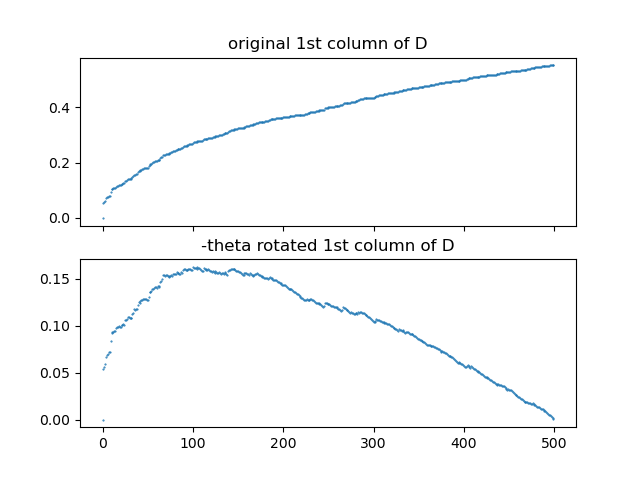

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 73.0


<IPython.core.display.Javascript object>


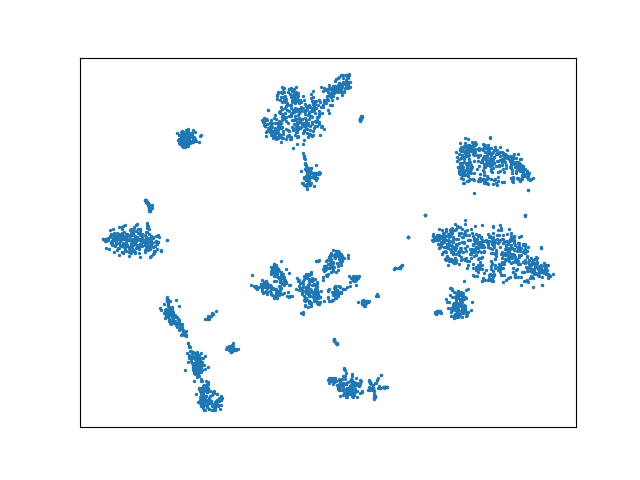

In [342]:
Nonneuronal_log_std_arr,status_df = dp.log_and_standerdize_df(Nonneuronal_df,status_df)
Nonneuronal_df_ls = pd.DataFrame(data = Nonneuronal_log_std_arr.T, index = Nonneuronal_df.index, columns=Nonneuronal_df.columns)

Nonneuronal_pca_index, Nonneuronal_arr_pca, status_df = dp.analyze_pca(arr = Nonneuronal_log_std_arr, #log_std_arr
                                               n_components=Nonneuronal_log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

Nonneuronal_meta_data_df_pca = Nonneuronal_meta_data_df.T.copy()

vars_use = ['SampleID']
ho = hm.run_harmony(Nonneuronal_arr_pca,Nonneuronal_meta_data_df_pca,vars_use)
Nonneuronal_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = Nonneuronal_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

Nonneuronal_arr_tsne,status_df = dp.do_tsne(arr = Nonneuronal_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

params for dbscan
minpts:  20
epsilon percentile 50
epsilon:  1.3821311541865091

running dbscan with epsilon: 1.3821311541865091  and minpts: 20
Estimated number of clusters: 28
Estimated number of noise points: 414


<IPython.core.display.Javascript object>


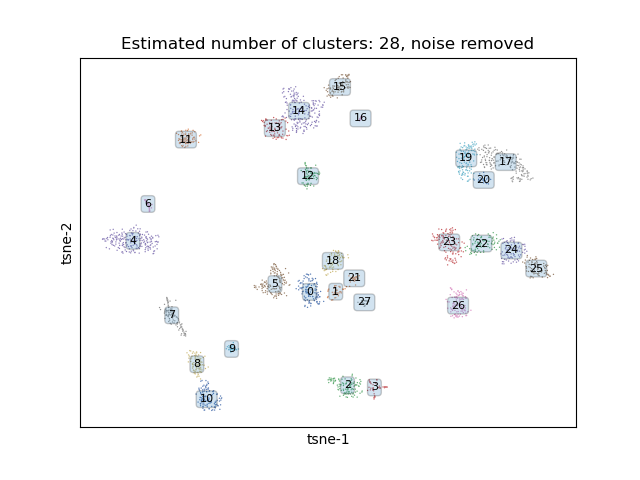

params for dbscan
minpts:  20
epsilon percentile 55
epsilon:  1.428427615798894

running dbscan with epsilon: 1.428427615798894  and minpts: 20
Estimated number of clusters: 27
Estimated number of noise points: 360


<IPython.core.display.Javascript object>


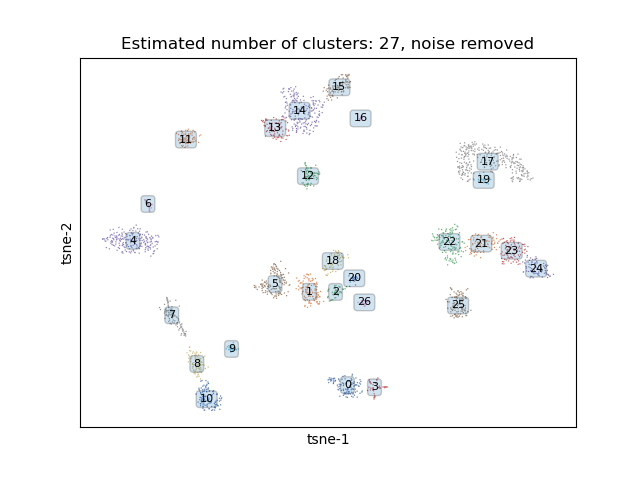

params for dbscan
minpts:  20
epsilon percentile 60
epsilon:  1.47912656605168

running dbscan with epsilon: 1.47912656605168  and minpts: 20
Estimated number of clusters: 27
Estimated number of noise points: 301


<IPython.core.display.Javascript object>


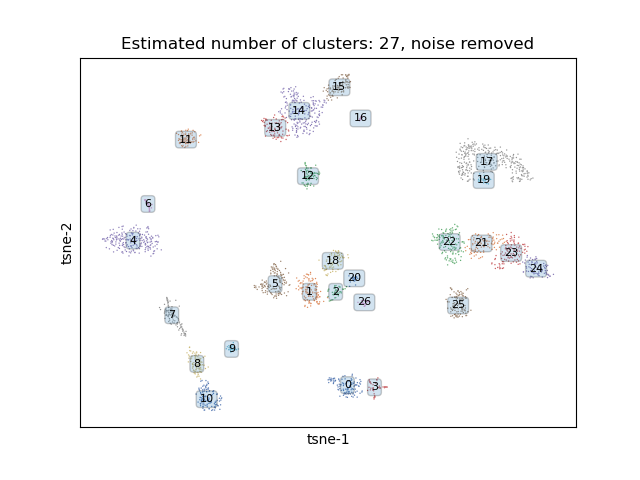

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.5540547281204917

running dbscan with epsilon: 1.5540547281204917  and minpts: 20
Estimated number of clusters: 24
Estimated number of noise points: 240


<IPython.core.display.Javascript object>


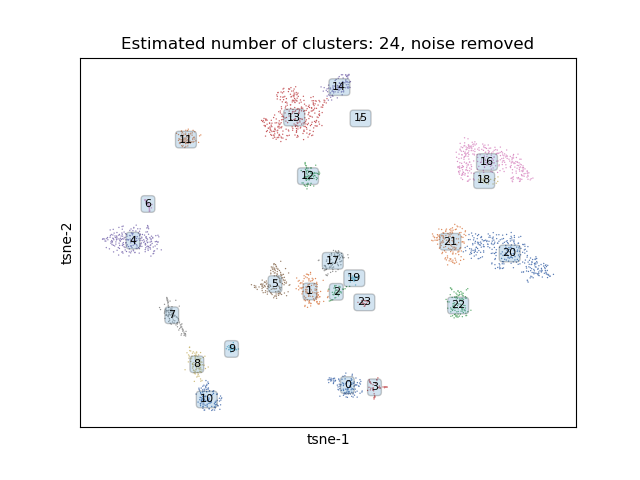

params for dbscan
minpts:  20
epsilon percentile 70
epsilon:  1.6198400566289304

running dbscan with epsilon: 1.6198400566289304  and minpts: 20
Estimated number of clusters: 26
Estimated number of noise points: 178


<IPython.core.display.Javascript object>


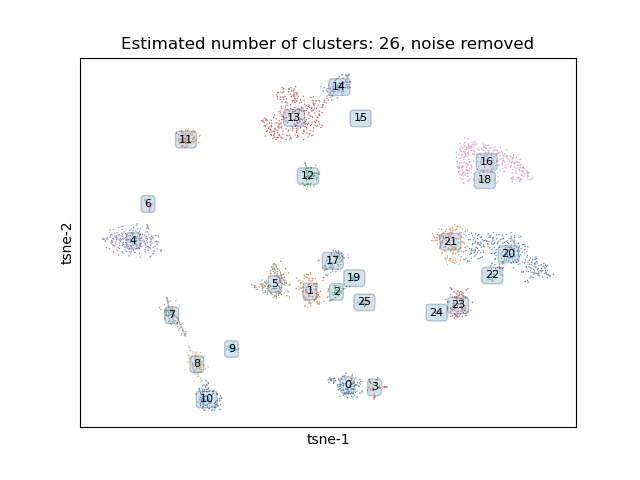

params for dbscan
minpts:  20
epsilon percentile 75
epsilon:  1.6970771477130742

running dbscan with epsilon: 1.6970771477130742  and minpts: 20
Estimated number of clusters: 21
Estimated number of noise points: 158


<IPython.core.display.Javascript object>


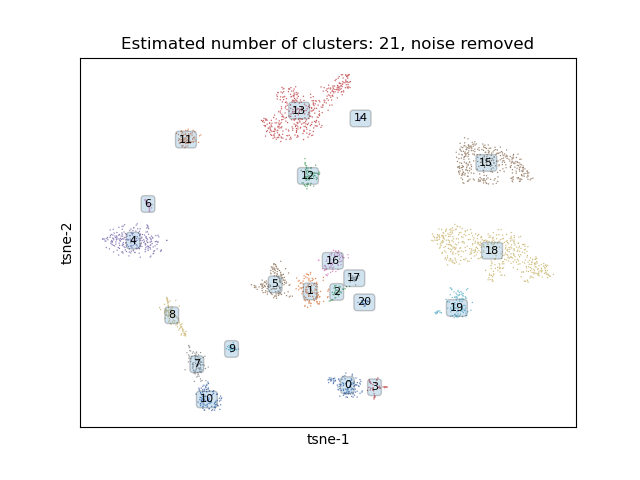

In [343]:
for e in range(50,80,5):
    epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=e, arr= Nonneuronal_arr_tsne, status_df = status_df)
    labels,n_clusters, arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = Nonneuronal_arr_tsne, status_df = status_df)

params for dbscan
minpts:  20
epsilon percentile 70
epsilon:  1.6198400566289304

running dbscan with epsilon: 1.6198400566289304  and minpts: 20
Estimated number of clusters: 26
Estimated number of noise points: 178


<IPython.core.display.Javascript object>


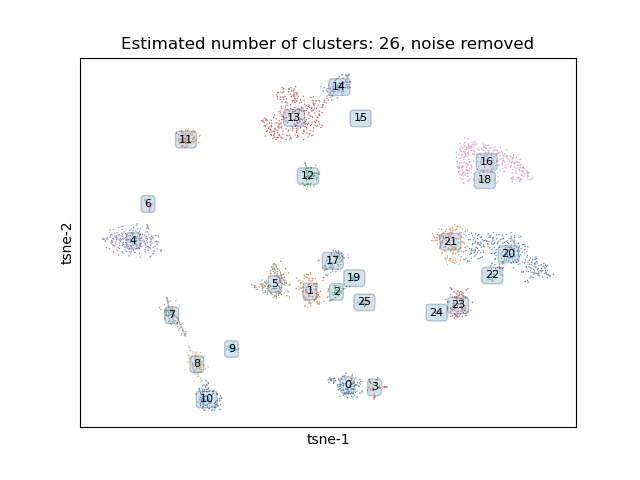

In [344]:
epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=70, arr= Nonneuronal_arr_tsne, status_df = status_df)
Nonneuronal_labels,n_clusters, Nonneuronal_arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = Nonneuronal_arr_tsne, status_df = status_df)

In [347]:
Nonneuronal_df_pre_linkage_ls, Nonneuronal_meta_data_df_pre_linkage, Nonneuronal_unique_labels = dp.sort_by_cluster_label(Nonneuronal_df_ls,
                                                                               Nonneuronal_meta_data_df,
                                                                               Nonneuronal_arr,
                                                                               Nonneuronal_labels)

In [348]:
today

'2024-06-06'

In [349]:
## CHECKPOINT - SAVE FILES
folder = '/bigdata/isaac/Nonneuronal_files/'
file1 = 'Nonneuronal_df_pre_linkage_ls_' + today
file2 = 'Nonneuronal_meta_data_df_pre_linkage_' + today
file3 = 'Nonneuronal_unique_labels_' + today 

Nonneuronal_df_pre_linkage_ls.to_feather(folder+file1+'.feather')
Nonneuronal_meta_data_df_pre_linkage.to_json(folder+file2+'.json')
np.save(folder+file3 +'.npy', Nonneuronal_unique_labels)

#Nonneuronal_df_pre_linkage_ls = pd.read_feather(folder + 'Nonneuronal_df_pre_linkage_ls_2024-06-06.feather')
#Nonneuronal_meta_data_df_pre_linkage = pd.read_json(folder + 'Nonneuronal_meta_data_df_pre_linkage_2024-06-06.json')
#np.load(folder+'Nonneuronal_unique_labels_2024-06-06.npy')

In [350]:
linkage_alg = 'ward'
dist_metric = 'euclidean'

<IPython.core.display.Javascript object>


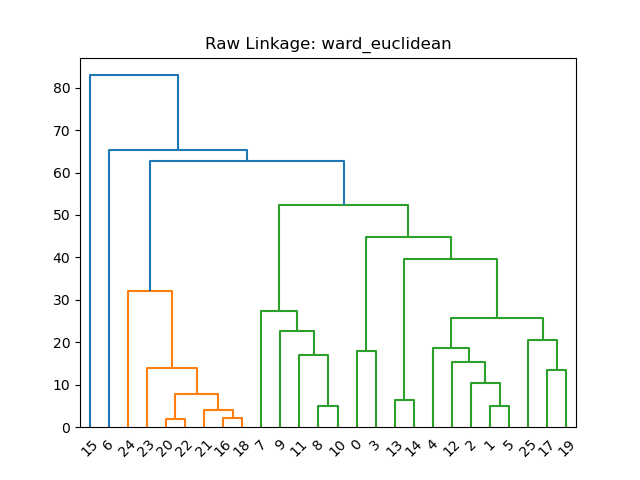

[15  7  9  8 10 11 13 14  4  2  1  5 12 19 17 25  0  3 21 16 18 20 22 23
 24  6]


<IPython.core.display.Javascript object>


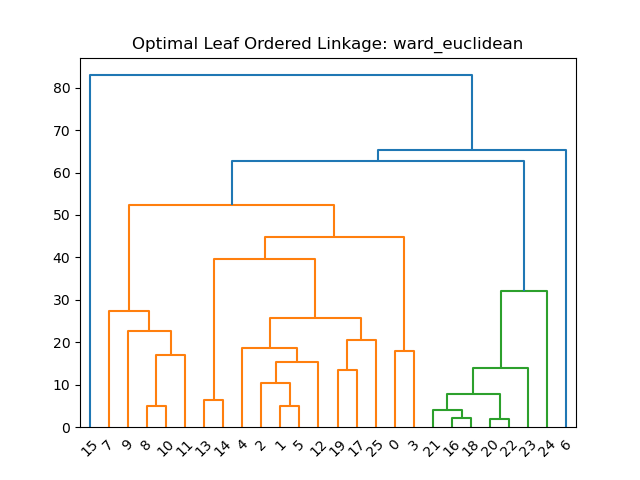

In [351]:
Nonneuronal_df_post_linkage, Nonneuronal_meta_data_df_post_linkage, linkage_cluster_order, Z_ordered, mpg_pca, linkage_cluster_order_po = dp.inter_cluster_sort(Nonneuronal_df_pre_linkage_ls,
                                                 Nonneuronal_meta_data_df_pre_linkage, 
                                                 Nonneuronal_unique_labels,
                                                 n_components = 10, 
                                                 linkage_alg = linkage_alg,
                                                 dist_metric = dist_metric)

<IPython.core.display.Javascript object>


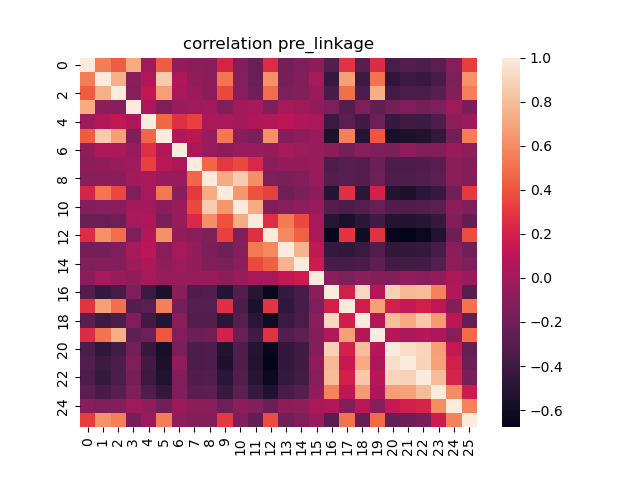

In [352]:
mpg_pca_df = pd.DataFrame(data = mpg_pca)
plt.figure()
ax = sns.heatmap(mpg_pca_df.corr(method='pearson'))
plt.title('correlation pre_linkage')
plt.show()

<IPython.core.display.Javascript object>


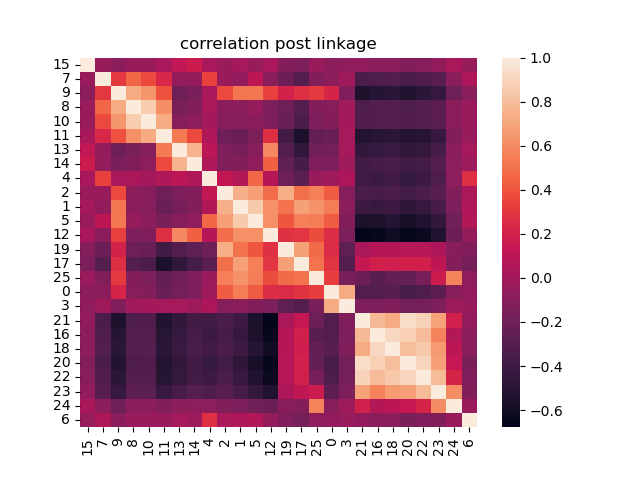

In [353]:
mpg_pca_pl_df = mpg_pca_df.reindex(columns = linkage_cluster_order)
plt.figure()
ax = sns.heatmap(mpg_pca_pl_df.corr(method='pearson'), yticklabels=True, xticklabels=True)
plt.title('correlation post linkage')
plt.savefig(folder + 'mpg_pca_corr_post_linkage')
plt.show()

In [354]:
Nonneuronal_df_s = Nonneuronal_df.reindex(columns = Nonneuronal_df_post_linkage.columns)

In [355]:
Nonneuronal_df_post_linkage_intra_sorted, Nonneuronal_meta_data_df_plis, cluster_indices = dp.intra_cluster_sort(Nonneuronal_df_s, 
                                                                                              Nonneuronal_meta_data_df_post_linkage, 
                                                                                              linkage_cluster_order)

In [356]:
Nonneuronal_marker_genes_sorted, pos, ind, ind_s, mgs = dp.compute_marker_genes(Nonneuronal_df_post_linkage_intra_sorted,
                                                Nonneuronal_meta_data_df_plis,
                                                cluster_indices,
                                                linkage_cluster_order,
                                                n_markers=5)

/home/isaac/analysis/scRNA-seq/dimorph_processing.py:708: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0_ind_arr = np.column_stack((xi0_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:713: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0p5_ind_arr = np.column_stack((xi0p5_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0p5_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:718: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is

len marker_genes_sorted_final 172


In [357]:
Nonneuronal_df_marker = Nonneuronal_df_post_linkage_intra_sorted.loc[Nonneuronal_marker_genes_sorted,:]
Nonneuronal_marker_log_and_std_arr, status_df = dp.log_and_standerdize_df(Nonneuronal_df_marker,status_df, log = False)
Nonneuronal_df_marker_log_and_std = pd.DataFrame(index = Nonneuronal_df_marker.index, 
                                          columns=Nonneuronal_df_post_linkage_intra_sorted.columns, 
                                          data = Nonneuronal_marker_log_and_std_arr.T)
Nonneuronal_df_marker_log_and_std_col = pd.DataFrame(data = Nonneuronal_df_marker_log_and_std.to_numpy(), 
                                         index = Nonneuronal_df_marker_log_and_std.index,
                                        columns = list(Nonneuronal_meta_data_df_plis.loc['cluster_label',:]))
change_indices = dp.get_heatmap_cluster_borders(Nonneuronal_meta_data_df_plis)
tg, tgfs = dp.get_heatmap_labels(mgs, ind, ind_s)

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 25, 139, 173, 272, 391, 478, 808, 902, 1134, 1174, 1302, 1441, 1521, 1550, 1632, 1655, 1777, 1834, 1981, 2296, 2324, 2640, 2655, 2762, 2781]


In [358]:
folder

'/bigdata/isaac/Nonneuronal_files/'

<IPython.core.display.Javascript object>


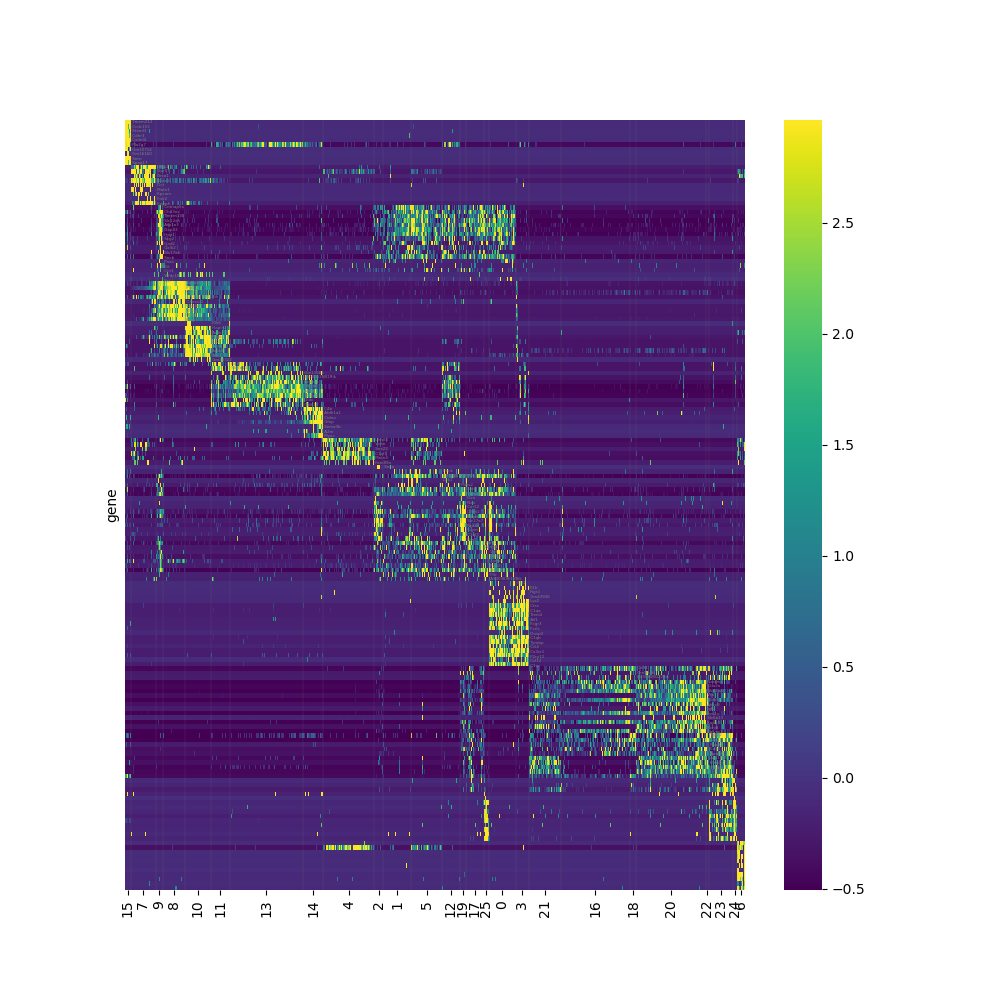

In [359]:
dp.plot_marker_heatmap(Nonneuronal_df_marker_log_and_std_col, 
                       pos, 
                       linkage_cluster_order, 
                       change_indices, 
                       tg, 
                       tgfs, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       savefig = True,
                       cell_class = 'Nonneuronal')

In [360]:
for c,g in zip(linkage_cluster_order,tg):
    print (c,g)

15 ['Tmem212', 'Ccdc153', 'Stoml3', 'Cdhr3', 'Calml4', 'Pla2g7', 'Gm10714', 'Gm16160', 'Sntn', 'Spag17']
7 ['Bfsp2', 'Gpr17', 'Brca1', 'Bcas1', 'Dct', 'Matn1', 'Epcam', 'Folr2', 'Enpp6']
9 ['Cntnap5a', 'Chd3os', 'Tmem130', 'Slc12a5', 'Atp1a3', 'Gap43', 'Hap1', 'Scg2', 'Gad2', 'Calb2', 'Slc17a6', 'Sncb', 'Pnoc', 'Kit', 'Cnr1', 'Wfdc18', 'Sst']
8 ['Tspan2', 'Plp1', 'Grb14', '1700047M11Rik', 'Onecut2', 'Opalin', 'Mobp', 'Mog', 'Mag']
10 ['Klk6', 'Hapln2', 'Anln', 'Ptgds', 'Il33', 'Aspa', 'Apod', 'Trf', 'Gm28322']
11 ['Itih3', 'Slc7a10']
13 ['Gm11681', '2900052N01Rik', 'Acsbg1', 'Slc1a3', 'Aldoc', 'Slc4a4', 'Gldc', 'Cldn10']
14 ['C4b', 'Aldh1a1', 'Cidea', 'Gfap', 'Sema3b', 'A2m', 'Myoc']
4 ['Lhfpl3', 'Vcan', 'Snx22', 'C1ql1', 'Matn4', 'Fam89a']
2 ['Snca']
1 []
5 ['Penk', '6330403K07Rik', 'Dlk1']
12 ['Meis2']
19 ['Syt4', 'Snap25', 'Dcn', 'Nov', 'Car12', 'Olfm1', 'Napb', 'Slc17a7', 'Nptxr', 'Crym', 'C1ql3', 'Nrn1']
17 ['Vsnl1', 'Ntng1']
25 ['Vgf', 'Rab3c', 'Synpr', 'Pcp4', 'Scn2a1', 'Prlr', 

[Chat GPT analysis here]

In [117]:
Nonneuronal_ids_filtered = np.sort([38, 36, 34, 16, 24, 21, 30])
Nonneuronal_arr_sorted = Nonneuronal_arr.sort_values(by = 'labels')
Nonneuronal_arr_filtered = Nonneuronal_arr_sorted.copy()
Nonneuronal_arr_filtered = Nonneuronal_arr_filtered[Nonneuronal_arr_filtered['labels'].isin(Nonneuronal_ids_filtered)]
Nonneuronal_meta_data_df_filtered = Nonneuronal_meta_data_df.iloc[:,Nonneuronal_arr_filtered.index]
Nonneuronal_df_ls_filtered = Nonneuronal_df_ls.iloc[:,Nonneuronal_arr_filtered.index]

<IPython.core.display.Javascript object>


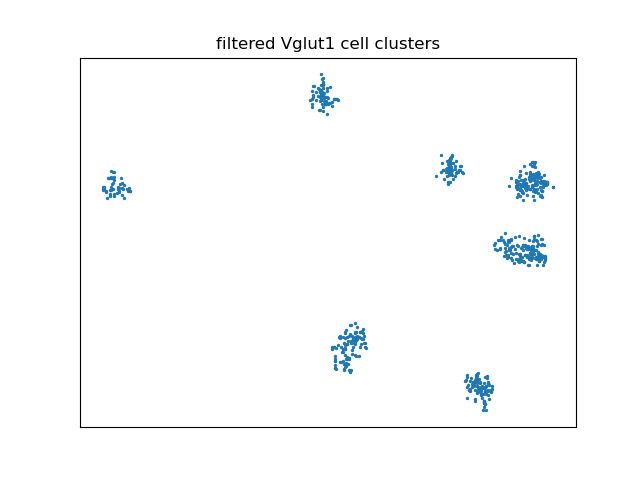

In [118]:
ax, fig = plt.subplots()
fig.scatter(Nonneuronal_arr_filtered['tsne-1'], Nonneuronal_arr_filtered['tsne-2'], s = 2)
plt.xticks([])
plt.yticks([])
plt.title('filtered Nonneuronal cell clusters')
plt.show()